In [ ]:
# Cell 1: Mount Google Drive (Colab only)
try:
    from google.colab import drive
    drive.mount('/content/drive', force_remount=True)
    colab = True
    print("Drive mounted.")
except ModuleNotFoundError:
    colab = False
    print("Not in Colab; skipping drive mount.")


Mounted at /content/drive
Drive mounted.


In [ ]:
!pip install ace_tools

In [ ]:
# Cell 2: Imports & pandas display settings
import os
import pandas as pd
import numpy as np
from scipy import stats
import geopandas as gpd
import matplotlib.pyplot as plt
from pathlib import Path
from matplotlib.animation import FuncAnimation
from matplotlib.colors import LogNorm
from shapely.geometry import Point
from IPython.display import HTML
from IPython.display import display
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import plotly.express as px
from shapely.geometry import MultiPolygon

pd.set_option('display.max_rows', None)
pd.set_option('display.max_columns', None)
pd.set_option('display.width', 200)


In [ ]:
# Cell 3: Load dataset
file_local = '/mnt/data/parcels_all.csv'
file_drive = '/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/parcels_all.csv'
path = file_drive if colab else file_local

df = pd.read_csv(path, low_memory=False)
print(f"Cell 3 ➔ Loaded {path} (shape {df.shape})")


Cell 3 ➔ Loaded /content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/parcels_all.csv (shape (119184, 95))


In [ ]:
# Cell 4: Rename core zone columns
df.rename(columns={
    'RedliningZone_1': 'RL1',
    'RedliningZone_2': 'RL2',
    'RedliningZone_3': 'RL3'
}, inplace=True)
print("Cell 4 ➔ Renamed RedliningZone_1→RL1, 2→RL2, 3→RL3")


Cell 4 ➔ Renamed RedliningZone_1→RL1, 2→RL2, 3→RL3


In [ ]:
# Cell 4: Quick peek
print(df.head())
print("\nColumns:", df.columns.tolist())


                                     Address  ZipCode   Latitude  Longitude  ValueOfCityProperty_1945  ValueOfPersonalProperty_1945  TotalValue_1945  F2025DollarValueTotalValue_1945  StateTax_1945  \
0  1201 E Main St #130, Allen, TX 75002, USA    75002  33.101001 -96.640764                       NaN                           NaN              NaN                              NaN            NaN   
1     116 Simmons Dr, Coppell, TX 75019, USA    75019  32.968255 -96.986184                       NaN                           NaN              NaN                              NaN            NaN   
2      909 Balboa St, Denison, TX 75020, USA    75020  33.749447 -96.597255                       NaN                           NaN              NaN                              NaN            NaN   
3      4008 Goodwin Dr, Plano, TX 75023, USA    75023  33.052497 -96.718419                       NaN                           NaN              NaN                              NaN            NaN   


In [ ]:
# Cell 5: Compute per-square-foot metrics for nominal & adjusted values

# Years to process
years = [1945, 1975, 1985, 2012, 2020, 2021]

# Compute new per‑sqft columns
for yr in years:
    val_col = f"TotalValue_{yr}"
    adj_col = f"F2025DollarValueTotalValue_{yr}"
    area_col = f"LandSizeSqFT_{yr}"

    df[f"TotalValue_perSqFt_{yr}"] = np.where(
        df[val_col].notna() & df[area_col].notna(),
        df[val_col] / df[area_col],
        np.nan
    )

    df[f"F2025DollarValueTotalValue_perSqFt_{yr}"] = np.where(
        df[adj_col].notna() & df[area_col].notna(),
        df[adj_col] / df[area_col],
        np.nan
    )


In [ ]:
# Cell 6: Define parameters for zone-level statistics
citylimit_years = years
zones = [
    'RL1','RL1_buf1','RL1_buf2','RL1_buf3','RL1_buf4',
    'RL2','RL2_buf1','RL2_buf2','RL2_buf3','RL2_buf4',
    'RL3','RL3_buf1','RL3_buf2','RL3_buf3','RL3_buf4'
]
value_types = {
    'NominalValue':                  lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':        lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':          lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt':lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}


In [ ]:
# Cell 7: Compute zone-level statistics
records = []
for yr in citylimit_years:
    city_flag = f'IsIn_citylimit_{yr}'
    for zone in zones:
        mask = (df[city_flag] == 1) & (df.get(zone) == 1)
        subset = df.loc[mask]
        for vt_name, fn in value_types.items():
            col = fn(yr)
            vals = subset[col].dropna() if col in subset else pd.Series([], dtype=float)
            if len(vals) > 0:
                n      = int(vals.count())
                mean   = float(vals.mean())
                median = float(vals.median())
                modes  = vals.mode()
                mode   = float(modes.iloc[0]) if not modes.empty else np.nan
                std    = float(vals.std(ddof=1))
                minv   = float(vals.min())
                q1     = float(vals.quantile(0.25))
                q3     = float(vals.quantile(0.75))
                maxv   = float(vals.max())
            else:
                n = mean = median = mode = std = minv = q1 = q3 = maxv = np.nan

            records.append({
                'CityLimitYear': yr,
                'Zone':           zone,
                'ValueType':      vt_name,
                'n':              n,
                'mean':           mean,
                'median':         median,
                'mode':           mode,
                'std':            std,
                'min':            minv,
                'q1':             q1,
                'q3':             q3,
                'max':            maxv
            })

zone_stats_df = pd.DataFrame(records)
print(f"Cell 7 ➔ Computed {len(zone_stats_df)} zone-level rows")


Cell 7 ➔ Computed 360 zone-level rows


In [ ]:
# Cell 8: Save & display
outname = 'zone_level_stats.csv'
if colab:
    outpath = f'/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/{outname}'
else:
    outpath = outname
zone_stats_df.to_csv(outpath, index=False)
print(f"Cell 8 ➔ Saved to {outpath}\n")
zone_stats_df


Cell 8 ➔ Saved to /content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/zone_level_stats.csv



,CityLimitYear,Zone,ValueType,n,mean,median,mode,std,min,q1,q3,max
0,1945,RL1,NominalValue,38,928.157895,500.000000,400.000000,8.907023e+02,20.000000,250.000000,1575.000000,3.000000e+03
1,1945,RL1,InflationAdjustedValue,38,16270.607895,8765.000000,7012.000000,1.561401e+04,350.600000,4382.500000,27609.750000,5.259000e+04
2,1945,RL1,NominalValue_perSqFt,20,0.137882,0.133333,0.257143,9.435870e-02,0.004762,0.059249,0.232803,2.857143e-01
3,1945,RL1,InflationAdjustedValue_perSqFt,20,2.417073,2.337333,4.507714,1.654108e+00,0.083476,1.038636,4.081043,5.008571e+00
4,1945,RL1_buf1,NominalValue,159,1657.924528,1300.000000,1500.000000,2.433373e+03,10.000000,580.000000,2000.000000,2.640000e+04
5,1945,RL1_buf1,InflationAdjustedValue,159,29063.416981,22789.000000,26295.000000,4.265703e+04,175.300000,10167.400000,35060.000000,4.627920e+05
6,1945,RL1_buf1,NominalValue_perSqFt,57,0.236029,0.150943,0.111111,3.222221e-01,0.001980,0.060377,0.232126,1.893435e+00
7,1945,RL1_buf1,InflationAdjustedValue_perSqFt,57,4.137586,2.646038,1.947778,5.648554e+00,0.034708,1.058415,4.069174,3.319191e+01
8,1945,RL1_buf2,NominalValue,476,1971.680672,1500.000000,1500.000000,3.268469e+03,10.000000,900.000000,1900.000000,4.000000e+04
9,1945,RL1_buf2,InflationAdjustedValue,476,34563.562185,26295.000000,26295.000000,5.729625e+04,175.300000,15777.000000,33307.000000,7.012000e+05


In [ ]:
# Cell 9: Compute city-level statistics
city_records = []
value_types_city = {
    'NominalValue':                  lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':        lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':          lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt':lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

for yr in years:
    city_flag = f'IsIn_citylimit_{yr}'
    subset = df[df.get(city_flag) == 1]
    for vt_name, fn in value_types_city.items():
        col = fn(yr)
        vals = subset[col].dropna() if col in subset else pd.Series([], dtype=float)
        if len(vals) > 0:
            n      = int(vals.count())
            mean   = float(vals.mean())
            median = float(vals.median())
            modes  = vals.mode()
            mode   = float(modes.iloc[0]) if not modes.empty else np.nan
            std    = float(vals.std(ddof=1))
            minv   = float(vals.min())
            q1     = float(vals.quantile(0.25))
            q3     = float(vals.quantile(0.75))
            maxv   = float(vals.max())
        else:
            n = mean = median = mode = std = minv = q1 = q3 = maxv = np.nan

        city_records.append({
            'CityLimitYear': yr,
            'ValueType':      vt_name,
            'n':               n,
            'mean':            mean,
            'median':          median,
            'mode':            mode,
            'std':             std,
            'min':             minv,
            'q1':              q1,
            'q3':              q3,
            'max':             maxv
        })

city_stats_df = pd.DataFrame(city_records)
print(f"Cell 9 ➔ Computed {len(city_stats_df)} city-level rows")


Cell 9 ➔ Computed 24 city-level rows


In [ ]:
# Cell 10: Save and display city-level statistics
output_city = 'city_level_stats.csv'
outpath = f'/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/{output_city}'
city_stats_df.to_csv(outpath, index=False)
print(f"Cell 10 ➔ Saved to {outpath}")
city_stats_df


Cell 10 ➔ Saved to /content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/city_level_stats.csv


,CityLimitYear,ValueType,n,mean,median,mode,std,min,q1,q3,max
0,1945,NominalValue,2027,1920.306364,1800.000000,1800.000000,1.932707e+03,10.000000,1300.000000,2200.000000,4.000000e+04
1,1945,InflationAdjustedValue,2027,33662.970562,31554.000000,31554.000000,3.388035e+04,175.300000,22789.000000,38566.000000,7.012000e+05
2,1945,NominalValue_perSqFt,1500,5.680577,0.239658,0.214286,2.097801e+02,0.001190,0.190931,0.285714,8.125000e+03
3,1945,InflationAdjustedValue_perSqFt,1500,99.580523,4.201207,3.756429,3.677445e+03,0.020869,3.347023,5.008571,1.424312e+05
4,1975,NominalValue,25245,5399.551040,3860.000000,1000.000000,1.311891e+04,10.000000,2360.000000,6440.000000,1.062880e+06
5,1975,InflationAdjustedValue,25245,31695.364604,22658.200000,5870.000000,7.700802e+04,58.700000,13853.200000,37802.800000,6.239106e+06
6,1975,NominalValue_perSqFt,23051,1.361868,0.470513,0.333333,1.214382e+02,0.000077,0.309200,0.727095,1.843750e+04
7,1975,InflationAdjustedValue_perSqFt,23051,7.994163,2.761910,1.956667,7.128424e+02,0.000449,1.815002,4.268048,1.082281e+05
8,1985,NominalValue,11970,40957.415205,30944.500000,5000.000000,7.668756e+04,130.000000,17526.250000,49937.500000,2.591840e+06
9,1985,InflationAdjustedValue,11970,120005.226550,90667.385000,14650.000000,2.246946e+05,380.900000,51351.912500,146316.875000,7.594091e+06


In [ ]:
# Cell 11: Count parcels with complete data across all six years per city limit

# Years to require complete data
years = [1945, 1975, 1985, 2012, 2020, 2021]

# Build a boolean mask: TotalValue and InflationAdjustedValue must be non-null every year
common_mask = np.logical_and.reduce([
    df[f"TotalValue_{yr}"].notna() & df[f"F2025DollarValueTotalValue_{yr}"].notna()
    for yr in years
])

# Filtered subset
df_common = df[common_mask]
print(f"Total parcels with complete data all years: {len(df_common)}\n")

# For each city-limit year, count how many of these parcels fall inside
counts = {
    yr: int(df_common[f"IsIn_citylimit_{yr}"].sum())
    for yr in years
}

# Build a summary DataFrame
counts_df = pd.DataFrame({
    "CityLimitYear": list(counts.keys()),
    "CommonParcelCount": list(counts.values())
})

print("Parcels with complete data in each city-limit:")
print(counts_df)


Total parcels with complete data all years: 282

Parcels with complete data in each city-limit:
   CityLimitYear  CommonParcelCount
0           1945                276
1           1975                282
2           1985                282
3           2012                282
4           2020                282
5           2021                282


In [ ]:
# Cell 12: Compute zone-level statistics on df_common
records_common = []

for yr in years:
    city_flag = f'IsIn_citylimit_{yr}'
    for zone in zones:
        mask = (df_common[city_flag] == 1) & (df_common[zone] == 1)
        subset = df_common.loc[mask]
        for vt_name, fn in value_types.items():
            col  = fn(yr)
            vals = subset[col].dropna()
            if not vals.empty:
                r = {
                    'CityLimitYear': yr,
                    'Zone':          zone,
                    'ValueType':     vt_name,
                    'n':             int(vals.count()),
                    'mean':          float(vals.mean()),
                    'median':        float(vals.median()),
                    'mode':          float(vals.mode().iloc[0]),
                    'std':           float(vals.std(ddof=1)),
                    'min':           float(vals.min()),
                    'q1':            float(vals.quantile(0.25)),
                    'q3':            float(vals.quantile(0.75)),
                    'max':           float(vals.max())
                }
            else:
                r = dict(
                    CityLimitYear=yr, Zone=zone, ValueType=vt_name,
                    n=0, mean=np.nan, median=np.nan, mode=np.nan,
                    std=np.nan, min=np.nan, q1=np.nan, q3=np.nan, max=np.nan
                )
            records_common.append(r)

zone_stats_common_df = pd.DataFrame(records_common)
output_file_name = 'zone_level_stats_common.csv'
output_name = f'/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/{output_file_name}'
# Save + display
zone_stats_common_df.to_csv(output_name, index=False)
print("Cell 12 ➔ zone_level_stats_common.csv saved (rows:", len(zone_stats_common_df), ")")
zone_stats_common_df


Cell 12 ➔ zone_level_stats_common.csv saved (rows: 360 )


,CityLimitYear,Zone,ValueType,n,mean,median,mode,std,min,q1,q3,max
0,1945,RL1,NominalValue,1,500.000000,500.000000,500.000000,NaN,500.000000,500.000000,500.000000,5.000000e+02
1,1945,RL1,InflationAdjustedValue,1,8765.000000,8765.000000,8765.000000,NaN,8765.000000,8765.000000,8765.000000,8.765000e+03
2,1945,RL1,NominalValue_perSqFt,1,0.153846,0.153846,0.153846,NaN,0.153846,0.153846,0.153846,1.538462e-01
3,1945,RL1,InflationAdjustedValue_perSqFt,1,2.696923,2.696923,2.696923,NaN,2.696923,2.696923,2.696923,2.696923e+00
4,1945,RL1_buf1,NominalValue,3,1566.666667,2000.000000,200.000000,1209.683154,200.000000,1100.000000,2250.000000,2.500000e+03
5,1945,RL1_buf1,InflationAdjustedValue,3,27463.666667,35060.000000,3506.000000,21205.745692,3506.000000,19283.000000,39442.500000,4.382500e+04
6,1945,RL1_buf1,NominalValue_perSqFt,3,0.473133,0.615385,0.034783,0.387337,0.034783,0.325084,0.692308,7.692308e-01
7,1945,RL1_buf1,InflationAdjustedValue_perSqFt,3,8.294016,10.787692,0.609739,6.790024,0.609739,5.698716,12.136154,1.348462e+01
8,1945,RL1_buf2,NominalValue,53,2083.962264,1500.000000,1600.000000,4250.879248,30.000000,1300.000000,1700.000000,3.200000e+04
9,1945,RL1_buf2,InflationAdjustedValue,53,36531.858491,26295.000000,28048.000000,74517.913222,525.900000,22789.000000,29801.000000,5.609600e+05


In [ ]:
# Cell 13: Compute city-level statistics on df_common
records_city = []

for yr in years:
    flag = f'IsIn_citylimit_{yr}'
    subset = df_common[df_common[flag] == 1]
    for vt_name, fn in value_types.items():
        col  = fn(yr)
        vals = subset[col].dropna()
        if not vals.empty:
            r = {
                'CityLimitYear': yr,
                'ValueType':     vt_name,
                'n':             int(vals.count()),
                'mean':          float(vals.mean()),
                'median':        float(vals.median()),
                'mode':          float(vals.mode().iloc[0]),
                'std':           float(vals.std(ddof=1)),
                'min':           float(vals.min()),
                'q1':            float(vals.quantile(0.25)),
                'q3':            float(vals.quantile(0.75)),
                'max':           float(vals.max())
            }
        else:
            r = dict(
                CityLimitYear=yr, ValueType=vt_name,
                n=0, mean=np.nan, median=np.nan, mode=np.nan,
                std=np.nan, min=np.nan, q1=np.nan, q3=np.nan, max=np.nan
            )
        records_city.append(r)

city_stats_common_df = pd.DataFrame(records_city)

# Save + display
output_file_name = 'city_level_stats_common.csv'
output_name = f'/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/{output_file_name}'
city_stats_common_df.to_csv(output_name, index=False)
print("Cell 13 ➔ city_level_stats_common.csv saved (rows:", len(city_stats_common_df), ")")
city_stats_common_df


Cell 13 ➔ city_level_stats_common.csv saved (rows: 24 )


,CityLimitYear,ValueType,n,mean,median,mode,std,min,q1,q3,max
0,1945,NominalValue,276,2077.902174,1800.000000,1800.000000,2033.292919,30.000000,1600.000000,2250.000000,3.200000e+04
1,1945,InflationAdjustedValue,276,36425.625109,31554.000000,31554.000000,35643.624876,525.900000,28048.000000,39442.500000,5.609600e+05
2,1945,NominalValue_perSqFt,275,0.294770,0.253333,0.214286,0.610355,0.004706,0.214286,0.285714,1.024000e+01
3,1945,InflationAdjustedValue_perSqFt,275,5.167312,4.440933,3.756429,10.699524,0.082494,3.756429,5.008571,1.795072e+02
4,1975,NominalValue,282,3218.581560,2660.000000,2540.000000,2067.173903,100.000000,2262.500000,3487.500000,1.999000e+04
5,1975,InflationAdjustedValue,282,18893.073759,15614.200000,14909.800000,12134.310811,587.000000,13280.875000,20471.625000,1.173413e+05
6,1975,NominalValue_perSqFt,281,0.424826,0.357143,0.285714,0.299772,0.015748,0.304000,0.446667,2.461538e+00
7,1975,InflationAdjustedValue_perSqFt,281,2.493732,2.096429,1.677143,1.759663,0.092441,1.784480,2.621933,1.444923e+01
8,1985,NominalValue,282,24192.457447,18738.500000,21447.000000,24550.787108,240.000000,15719.250000,24084.250000,2.913300e+05
9,1985,InflationAdjustedValue,282,70883.900319,54903.805000,62839.710000,71933.806226,703.200000,46057.402500,70566.852500,8.535969e+05


In [ ]:
# Cell 21: Parcel-Count Tables (Year × Zone) for Two Comparison Groups


# 2) Build the longitudinal subset (complete panel)
years = [1945, 1975, 1985, 2012, 2020, 2021]
mask_common = pd.Series(True, index=df.index)
for yr in years:
    mask_common &= df[f'TotalValue_{yr}'].notna() & df[f'F2025DollarValueTotalValue_{yr}'].notna()
df_common = df[mask_common]

# 3) Define the six years and fifteen zone flags
zones = [
    'RL1','RL1_buf1','RL1_buf2','RL1_buf3','RL1_buf4',
    'RL2','RL2_buf1','RL2_buf2','RL2_buf3','RL2_buf4',
    'RL3','RL3_buf1','RL3_buf2','RL3_buf3','RL3_buf4'
]

# 4) Prepare empty DataFrames for counts
baseline_counts = pd.DataFrame(index=years, columns=zones, dtype=int)
common_counts   = pd.DataFrame(index=years, columns=zones, dtype=int)

baseline_counts = baseline_counts.fillna(0).astype(int)
common_counts   = common_counts.fillna(0).astype(int)



# 5) Fill in counts
for yr in years:
    city_flag = f'IsIn_citylimit_{yr}'
    for zone in zones:
        baseline_counts.loc[yr, zone] = int(((df[city_flag]==1) & (df[zone]==1)).sum())
        common_counts.loc[yr, zone]   = int(((df_common[city_flag]==1) & (df_common[zone]==1)).sum())

# 6) Display the pivot tables
print("Baseline Sample Parcel Counts (Year × Zone):")
display(baseline_counts)

print("\nLongitudinal Subset Parcel Counts (Year × Zone):")
display(common_counts)


Baseline Sample Parcel Counts (Year × Zone):


,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
1945,1862,3109,4090,3944,13260,3217,3767,3984,3513,11784,1151,5940,5301,4423,9450
1975,4361,3904,5399,7302,44805,5949,4689,5955,6841,42337,1151,5959,5843,5555,47263
1985,4560,3923,5403,7738,55905,6163,4705,5982,8241,52438,1151,5959,5843,5555,59021
2012,4567,3923,5463,8202,74587,6170,4711,6414,8578,70869,1151,5959,5843,5555,78234
2020,4567,3923,5463,8202,74587,6170,4711,6414,8578,70869,1151,5959,5843,5555,78234
2021,4565,3923,5462,8201,74384,6168,4711,6413,8577,70666,1151,5959,5843,5555,78027



Longitudinal Subset Parcel Counts (Year × Zone):


,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
1945,1,3,53,103,116,1,41,62,92,80,1,52,87,68,68
1975,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
1985,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2012,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2020,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2021,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73


In [ ]:
# Cell 21: Parcel-Count Tables by ValueType & Comparison Group

# Define years, zones, and value types
years = [1945, 1975, 1985, 2012, 2020, 2021]
zones = [
    'RL1','RL1_buf1','RL1_buf2','RL1_buf3','RL1_buf4',
    'RL2','RL2_buf1','RL2_buf2','RL2_buf3','RL2_buf4',
    'RL3','RL3_buf1','RL3_buf2','RL3_buf3','RL3_buf4'
]
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]

# Loop through each value type
for vt in value_types:
    # Baseline sample
    df_all = zone_stats_df[zone_stats_df['ValueType'] == vt]
    tbl_all = df_all.pivot(index='CityLimitYear', columns='Zone', values='n')
    print(f"\n{vt} – Baseline Sample Parcel Counts (Year × Zone):")
    display(tbl_all)

    # Longitudinal subset
    df_comm = zone_stats_common_df[zone_stats_common_df['ValueType'] == vt]
    tbl_comm = df_comm.pivot(index='CityLimitYear', columns='Zone', values='n')
    print(f"\n{vt} – Longitudinal Subset Parcel Counts (Year × Zone):")
    display(tbl_comm)



NominalValue – Baseline Sample Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,38,159,476,646,708,43,359,497,671,457,83,654,518,534,238
1975,1342,1174,1978,3156,17595,1853,1630,2398,3024,16340,270,1834,2217,2421,18503
1985,392,301,1223,1512,8542,524,1003,973,1975,7495,85,835,1335,905,8810
2012,3942,3445,4825,7472,62474,5421,4228,5683,7726,59100,924,5037,5369,5107,65721
2020,3949,3477,4843,7571,70984,5466,4218,5802,7915,67423,875,4892,5344,5113,74600
2021,3958,3479,4847,7575,72474,5471,4219,5814,7930,68899,876,4887,5349,5149,76072



NominalValue – Longitudinal Subset Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,1,3,53,103,116,1,41,62,92,80,1,52,87,68,68
1975,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
1985,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2012,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2020,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2021,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73



InflationAdjustedValue – Baseline Sample Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,38,159,476,646,708,43,359,497,671,457,83,654,518,534,238
1975,1342,1174,1978,3156,17595,1853,1630,2398,3024,16340,270,1834,2217,2421,18503
1985,392,301,1223,1512,8542,524,1003,973,1975,7495,85,835,1335,905,8810
2012,3942,3445,4825,7472,62474,5421,4228,5683,7726,59100,924,5037,5369,5107,65721
2020,3949,3477,4843,7571,70984,5466,4218,5802,7915,67423,875,4892,5344,5113,74600
2021,3958,3479,4847,7575,72474,5471,4219,5814,7930,68899,876,4887,5349,5149,76072



InflationAdjustedValue – Longitudinal Subset Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,1,3,53,103,116,1,41,62,92,80,1,52,87,68,68
1975,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
1985,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2012,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2020,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73
2021,3,3,53,104,119,3,41,62,96,80,1,52,87,69,73



NominalValue_perSqFt – Baseline Sample Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,20,57,303,512,608,21,235,331,526,387,29,340,439,463,229
1975,890,957,1690,2827,16687,1373,1383,2095,2712,15488,162,1388,1931,2142,17428
1985,357,255,1152,1419,8249,472,953,907,1883,7217,42,668,1288,876,8558
2012,3865,3383,4652,7387,61178,5337,4054,5619,7638,57817,899,4936,5259,5056,64315
2020,3874,3422,4686,7494,69777,5381,4057,5754,7837,66224,855,4805,5245,5069,73279
2021,3884,3425,4690,7499,71206,5388,4058,5766,7853,67639,856,4800,5252,5106,74690



NominalValue_perSqFt – Longitudinal Subset Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,1,3,53,102,116,1,41,62,91,80,1,52,87,67,68
1975,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
1985,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
2012,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
2020,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
2021,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73



InflationAdjustedValue_perSqFt – Baseline Sample Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,20,57,303,512,608,21,235,331,526,387,29,340,439,463,229
1975,890,957,1690,2827,16687,1373,1383,2095,2712,15488,162,1388,1931,2142,17428
1985,357,255,1152,1419,8249,472,953,907,1883,7217,42,668,1288,876,8558
2012,3865,3383,4652,7387,61178,5337,4054,5619,7638,57817,899,4936,5259,5056,64315
2020,3874,3422,4686,7494,69777,5381,4057,5754,7837,66224,855,4805,5245,5069,73279
2021,3884,3425,4690,7499,71206,5388,4058,5766,7853,67639,856,4800,5252,5106,74690



InflationAdjustedValue_perSqFt – Longitudinal Subset Parcel Counts (Year × Zone):


Zone,RL1,RL1_buf1,RL1_buf2,RL1_buf3,RL1_buf4,RL2,RL2_buf1,RL2_buf2,RL2_buf3,RL2_buf4,RL3,RL3_buf1,RL3_buf2,RL3_buf3,RL3_buf4
CityLimitYear,,,,,,,,,,,,,,,
1945,1,3,53,102,116,1,41,62,91,80,1,52,87,67,68
1975,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
1985,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
2012,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
2020,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73
2021,3,3,53,103,119,3,41,62,95,80,1,52,87,68,73


In [ ]:
# Cell 22: City-Level Parcel-Count Tables by Metric & Comparison Group

years = [1945, 1975, 1985, 2012, 2020, 2021]

# 1) Total parcel counts within each city-limit
counts_totals = pd.DataFrame(index=years, columns=['Baseline_Total','Longitudinal_Total'], dtype=int)
for yr in years:
    flag = f'IsIn_citylimit_{yr}'
    counts_totals.loc[yr, 'Baseline_Total']     = (df[flag] == 1).sum()
    counts_totals.loc[yr, 'Longitudinal_Total'] = (df_common[flag] == 1).sum()

print("Total Parcels within City Limits (Baseline vs Longitudinal):")
display(counts_totals)

# 2) Raw Value metrics (Nominal & Inflation-Adjusted)
metrics_raw = ['NominalValue','InflationAdjustedValue']
tbl_raw_base = (
    city_stats_df[city_stats_df.ValueType.isin(metrics_raw)]
    .pivot(index='CityLimitYear', columns='ValueType', values='n')
    .reindex(index=years, columns=metrics_raw)
)
tbl_raw_long = (
    city_stats_common_df[city_stats_common_df.ValueType.isin(metrics_raw)]
    .pivot(index='CityLimitYear', columns='ValueType', values='n')
    .reindex(index=years, columns=metrics_raw)
)

print("\nRaw Value Metrics Parcel Counts - Baseline Sample:")
display(tbl_raw_base)
print("\nRaw Value Metrics Parcel Counts - Longitudinal Subset:")
display(tbl_raw_long)

# 3) Per-SqFt metrics (Nominal & Inflation-Adjusted)
metrics_psf = ['NominalValue_perSqFt','InflationAdjustedValue_perSqFt']
tbl_psf_base = (
    city_stats_df[city_stats_df.ValueType.isin(metrics_psf)]
    .pivot(index='CityLimitYear', columns='ValueType', values='n')
    .reindex(index=years, columns=metrics_psf)
)
tbl_psf_long = (
    city_stats_common_df[city_stats_common_df.ValueType.isin(metrics_psf)]
    .pivot(index='CityLimitYear', columns='ValueType', values='n')
    .reindex(index=years, columns=metrics_psf)
)

print("\nPer-SqFt Metrics Parcel Counts - Baseline Sample:")
display(tbl_psf_base)
print("\nPer-SqFt Metrics Parcel Counts - Longitudinal Subset:")
display(tbl_psf_long)


Total Parcels within City Limits (Baseline vs Longitudinal):


,Baseline_Total,Longitudinal_Total
1945,26265.0,276.0
1975,65771.0,282.0
1985,77529.0,282.0
2012,96742.0,282.0
2020,96742.0,282.0
2021,96535.0,282.0



Raw Value Metrics Parcel Counts - Baseline Sample:


ValueType,NominalValue,InflationAdjustedValue
CityLimitYear,,
1945,2027,2027
1975,25245,25245
1985,11970,11970
2012,82158,82158
2020,90824,90824
2021,92333,92333



Raw Value Metrics Parcel Counts - Longitudinal Subset:


ValueType,NominalValue,InflationAdjustedValue
CityLimitYear,,
1945,276,276
1975,282,282
1985,282,282
2012,282,282
2020,282,282
2021,282,282



Per-SqFt Metrics Parcel Counts - Baseline Sample:


ValueType,NominalValue_perSqFt,InflationAdjustedValue_perSqFt
CityLimitYear,,
1945,1500,1500
1975,23051,23051
1985,11432,11432
2012,80465,80465
2020,89253,89253
2021,90704,90704



Per-SqFt Metrics Parcel Counts - Longitudinal Subset:


ValueType,NominalValue_perSqFt,InflationAdjustedValue_perSqFt
CityLimitYear,,
1945,275,275
1975,281,281
1985,281,281
2012,281,281
2020,281,281
2021,281,281


In [ ]:
# Cell 23: Compute mean values by Year & ValueType for Baseline & Longitudinal

import pandas as pd

# 0) Assumes `df` and `df_common` are already loaded.

years = [1945, 1975, 1985, 2012, 2020, 2021]
value_types_map = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# 1) Build a dict of DataFrames of means
means = {}
for grp_name, data in [('Baseline', df), ('Longitudinal', df_common)]:
    dfm = pd.DataFrame(index=years)
    for vt, col_fn in value_types_map.items():
        dfm[vt] = [
            data.loc[data[f'IsIn_citylimit_{yr}']==1, col_fn(yr)].mean()
            for yr in years
        ]
    means[grp_name] = dfm

# 2) Display the tables
print("Mean values within city limits by year and value type:")
for grp_name, dfm in means.items():
    print(f"\n{grp_name} Sample Means:")
    display(dfm)


Mean values within city limits by year and value type:

Baseline Sample Means:


,NominalValue,InflationAdjustedValue,NominalValue_perSqFt,InflationAdjustedValue_perSqFt
1945,1920.306364,33662.970562,5.680577,99.580523
1975,5399.551040,31695.364604,1.361868,7.994163
1985,40957.415205,120005.226550,4.269930,12.510893
2012,147522.791706,202106.224638,12.251052,16.783941
2020,204515.120332,249508.446804,21.408425,26.118279
2021,219638.311156,254780.440942,23.969351,27.804448



Longitudinal Sample Means:


,NominalValue,InflationAdjustedValue,NominalValue_perSqFt,InflationAdjustedValue_perSqFt
1945,2077.902174,36425.625109,0.294770,5.167312
1975,3218.581560,18893.073759,0.424826,2.493732
1985,24192.457447,70883.900319,3.244118,9.505267
2012,87091.421986,119315.248121,11.003076,15.074214
2020,114375.982270,139538.698369,14.246278,17.380459
2021,127249.570922,147609.502270,16.177007,18.765328


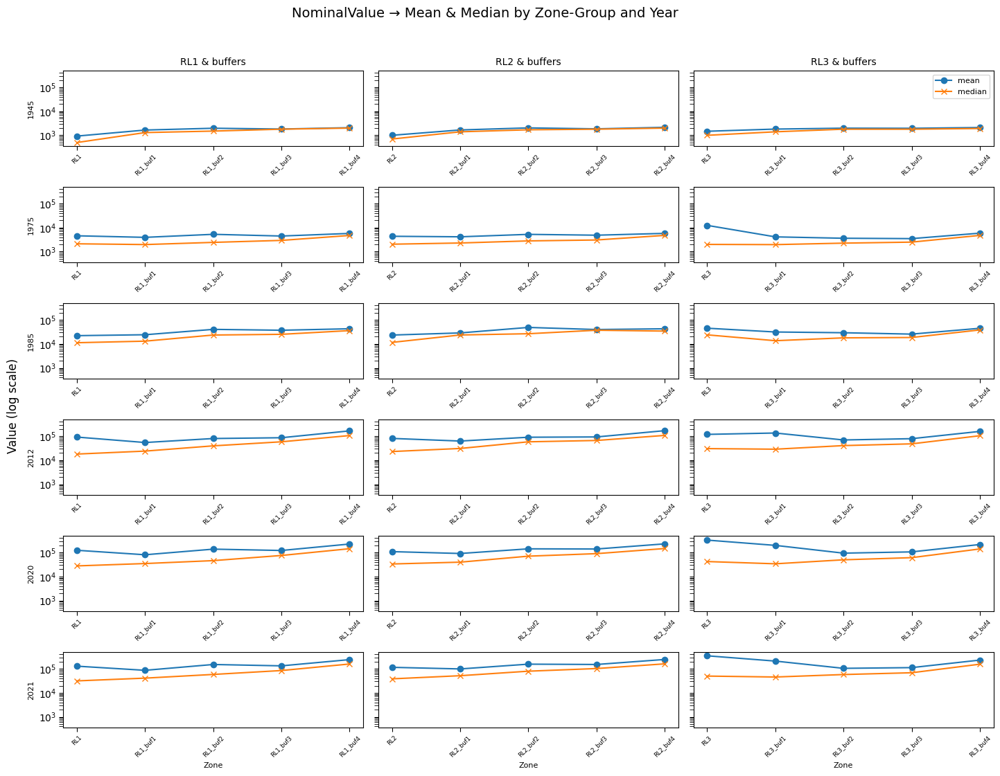

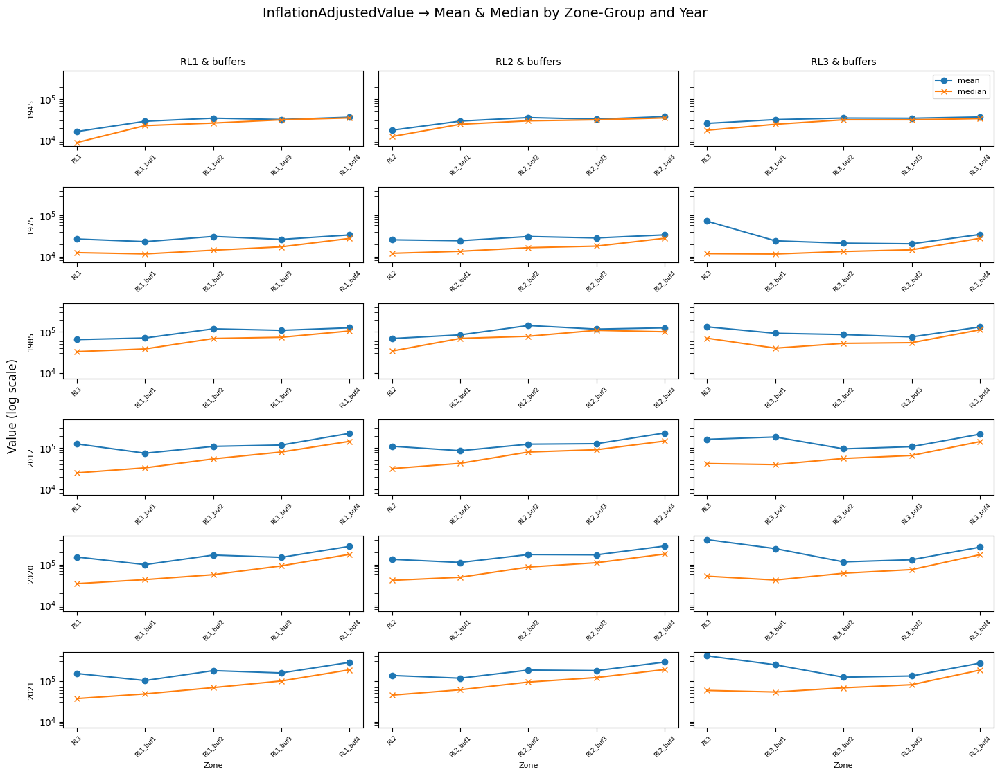

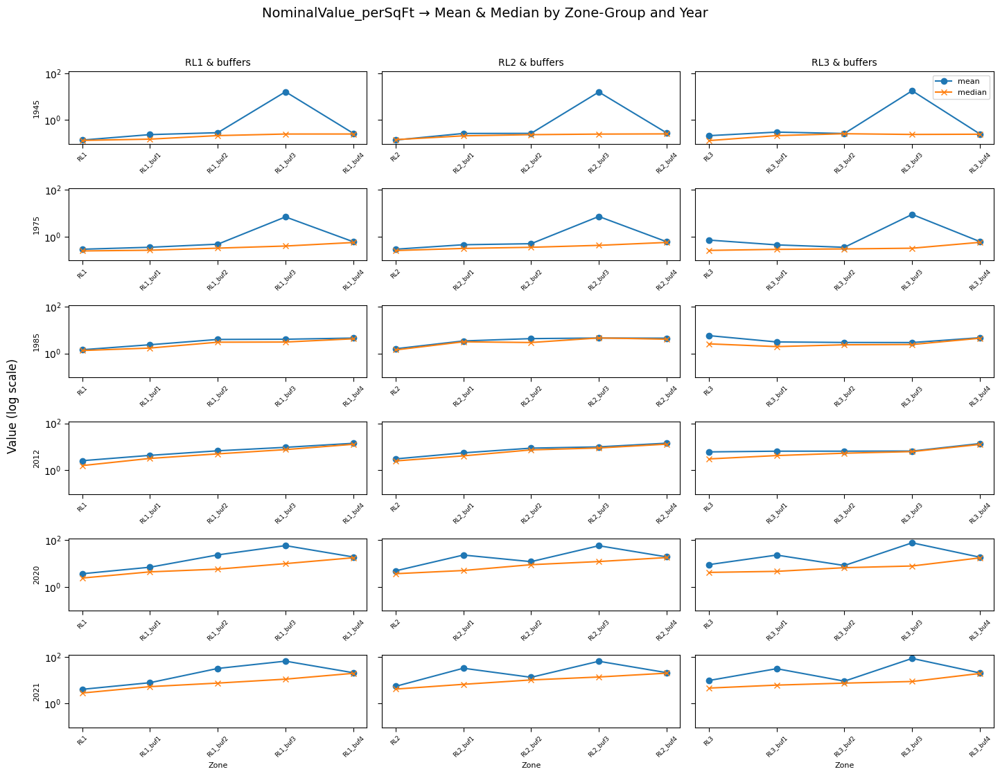

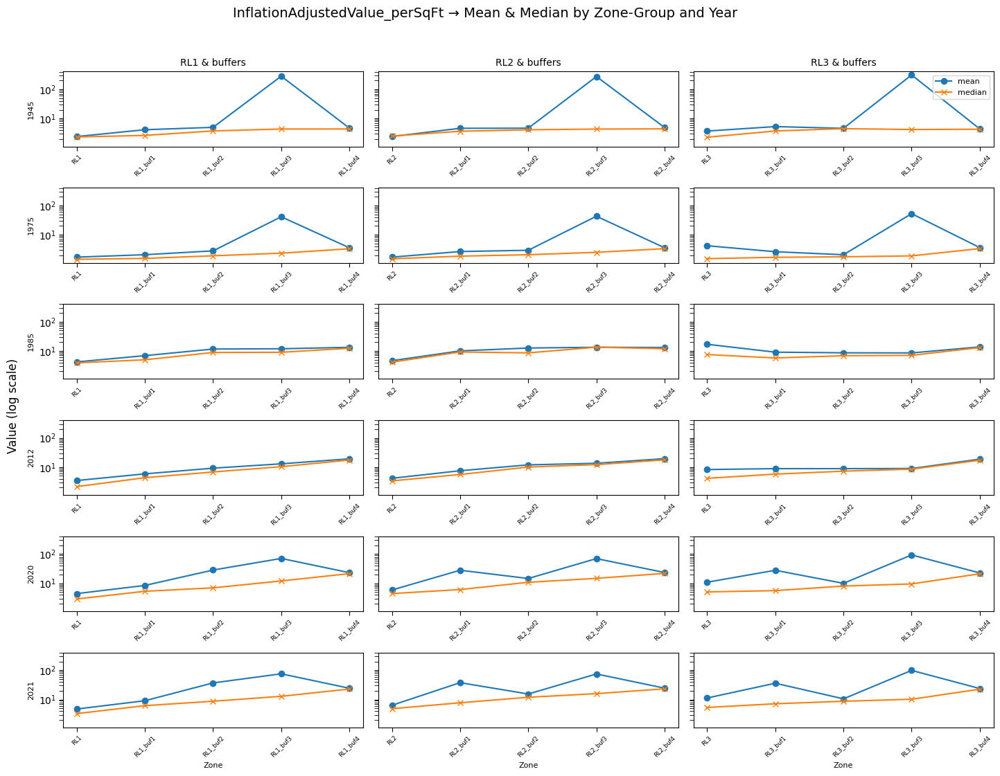

In [ ]:
# Cell 16 : Plot zone-level mean & median on log scale with visible axes

# 1) Load your zone stats table
zone_stats = pd.read_csv('/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/zone_level_stats.csv')

# 2) Define ordering
years = [1945, 1975, 1985, 2012, 2020, 2021]
zone_groups = {
    'RL1 & buffers': ['RL1','RL1_buf1','RL1_buf2','RL1_buf3','RL1_buf4'],
    'RL2 & buffers': ['RL2','RL2_buf1','RL2_buf2','RL2_buf3','RL2_buf4'],
    'RL3 & buffers': ['RL3','RL3_buf1','RL3_buf2','RL3_buf3','RL3_buf4']
}
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]

# 3) Loop through each ValueType
for vt in value_types:
    fig, axes = plt.subplots(
        nrows=len(years),
        ncols=len(zone_groups),
        sharey=True,
        figsize=(15, 12)
    )

    # For each year (row) and each zone‐group (col)
    for i, yr in enumerate(years):
        for j, (group_name, zones) in enumerate(zone_groups.items()):
            ax = axes[i, j]

            # Filter stats for this year & value type
            subset = zone_stats[
                (zone_stats.CityLimitYear == yr) &
                (zone_stats.ValueType == vt) &
                (zone_stats.Zone.isin(zones))
            ].set_index('Zone').reindex(zones)

            # Plot mean & median
            ax.plot(zones, subset['mean'],   marker='o', label='mean')
            ax.plot(zones, subset['median'], marker='x', label='median')

            ax.set_yscale('log')                 # log‐scale
            ax.set_xticks(range(len(zones)))     # position ticks under each zone
            ax.set_xticklabels(zones, rotation=45, fontsize=6)

            # Ensure spines and ticks are visible
            for spine in ax.spines.values():
                spine.set_visible(True)
            ax.tick_params(axis='x', which='both', length=4)
            ax.tick_params(axis='y', which='both', length=4)

            # Annotate row/col and label axes
            if i == 0:
                ax.set_title(group_name, fontsize=10)
            if j == 0:
                ax.set_ylabel(str(yr), fontsize=8)
            if i == len(years) - 1:
                ax.set_xlabel('Zone', fontsize=8)

    # Shared legend only once
    axes[0, -1].legend(loc='upper right', fontsize=8)

    # Add a big Y label for the whole figure
    fig.text(0.04, 0.5, 'Value (log scale)', va='center', rotation='vertical', fontsize=12)

    fig.suptitle(f'{vt} → Mean & Median by Zone‐Group and Year', fontsize=14)
    fig.tight_layout(rect=[0.05, 0.05, 1, 0.96])
    plt.show()


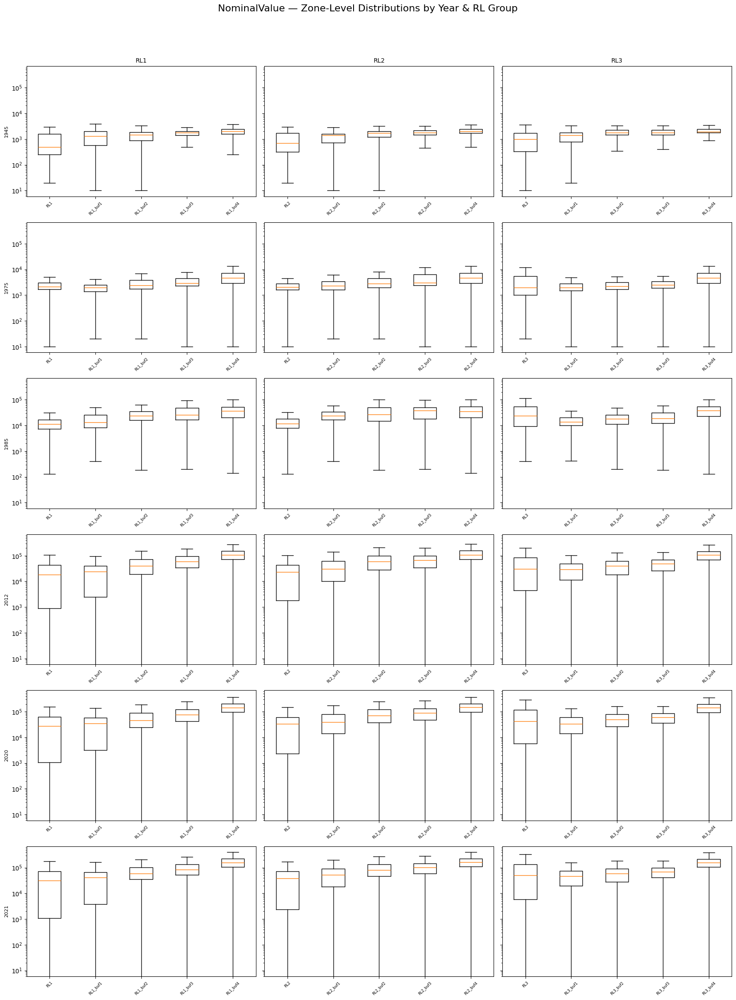

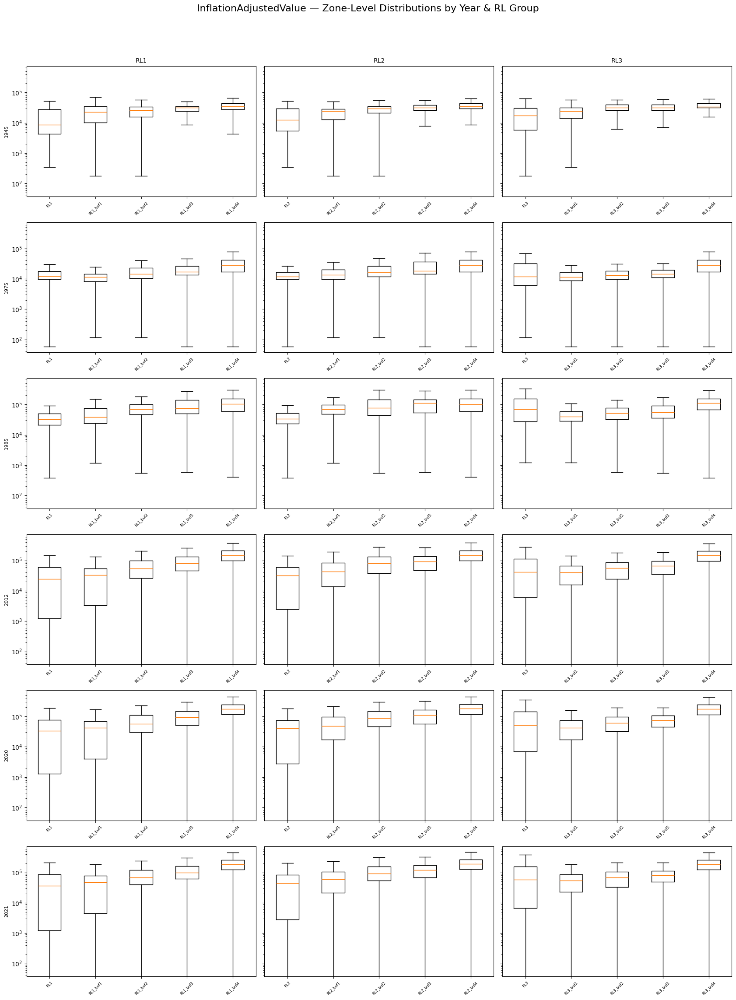

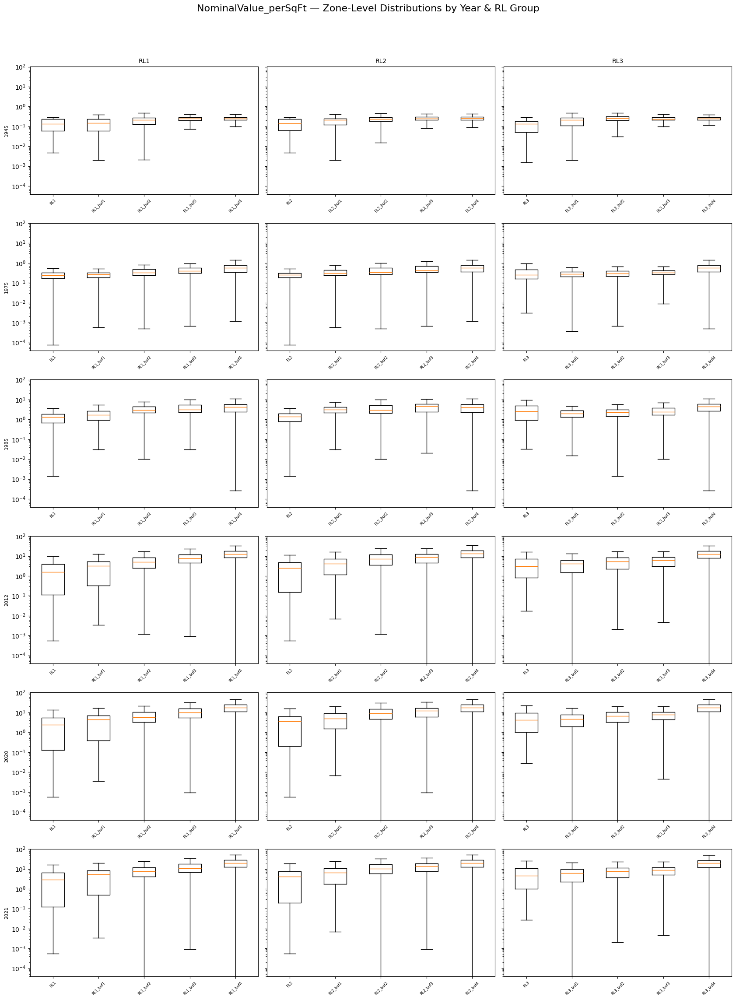

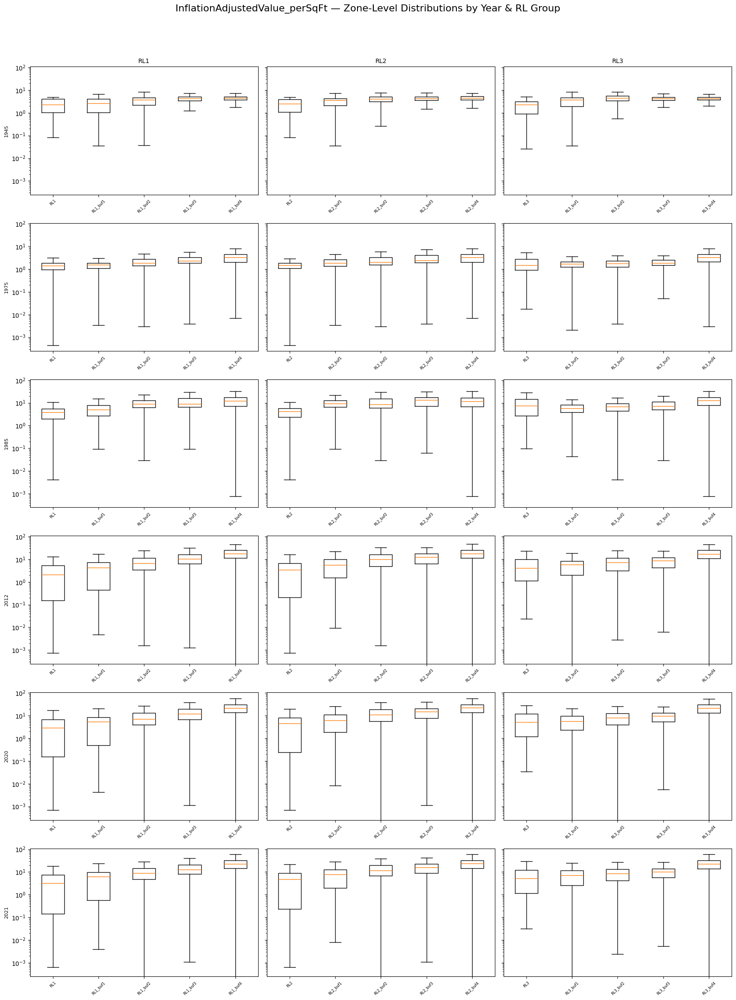

In [ ]:
# Cell 24: Zone‐Level Boxplots (6×3 grid) for Each Value Type

# 2) Set up years and RL groups
years = [1945, 1975, 1985, 2012, 2020, 2021]
rl_prefixes = ['RL1','RL2','RL3']
zone_groups = {
    p: [p] + [f"{p}_buf{i}" for i in range(1,5)]
    for p in rl_prefixes
}

# 3) Map each ValueType to its column‐naming function
value_types_map = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# 4) Loop through each value type and draw the 6×3 boxplot grid
for vt, col_fn in value_types_map.items():
    fig, axes = plt.subplots(nrows=6, ncols=3, figsize=(18, 24), sharey=True)
    axes = axes.flatten()

    for idx, ax in enumerate(axes):
        yr     = years[idx // 3]
        prefix = rl_prefixes[idx % 3]
        zones  = zone_groups[prefix]

        # filter parcels inside this year’s boundary
        df_year = df[df[f'IsIn_citylimit_{yr}']==1]

        # collect values for each zone band
        data_list = [
            df_year.loc[df_year[zone_flag]==1, col_fn(yr)].dropna()
            for zone_flag in zones
        ]

        # draw boxplot, log‐scale y
        ax.boxplot(data_list, positions=range(len(zones)), showfliers=False)
        ax.set_yscale('log')
        ax.set_xticks(range(len(zones)))
        ax.set_xticklabels(zones, rotation=45, fontsize=6)

        # annotate row/col labels
        if idx % 3 == 0:
            ax.set_ylabel(str(yr), fontsize=8)
        if idx < 3:
            ax.set_title(prefix, fontsize=10)

    # final formatting
    fig.suptitle(f"{vt} — Zone‐Level Distributions by Year & RL Group", fontsize=16)
    fig.tight_layout(rect=[0.03, 0.03, 0.97, 0.95])
    plt.show()


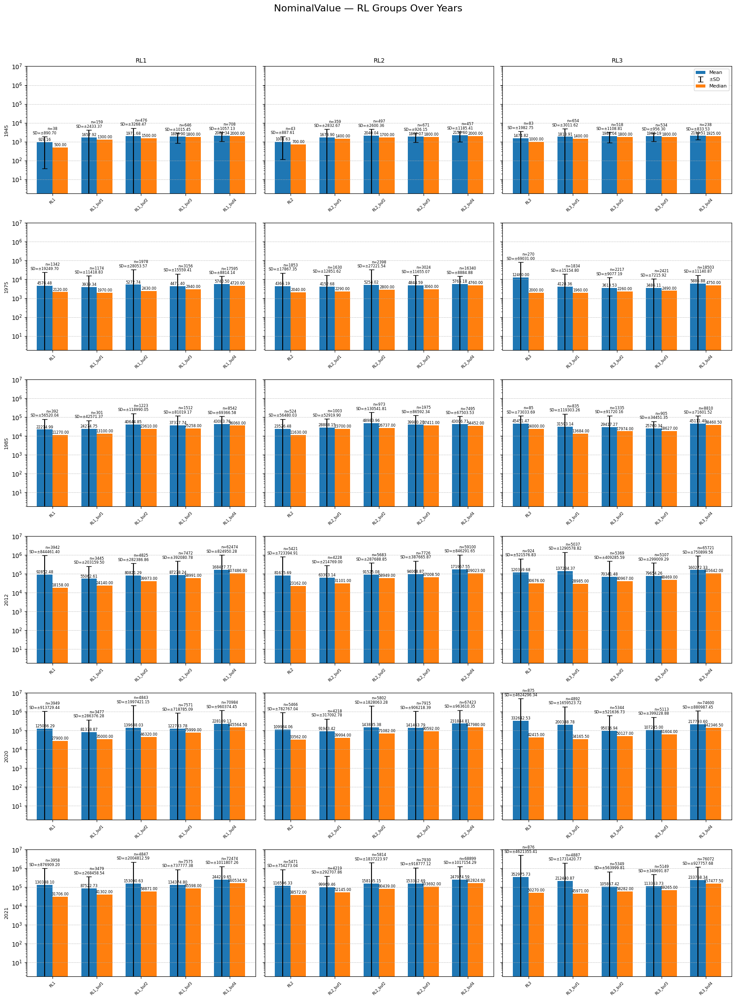

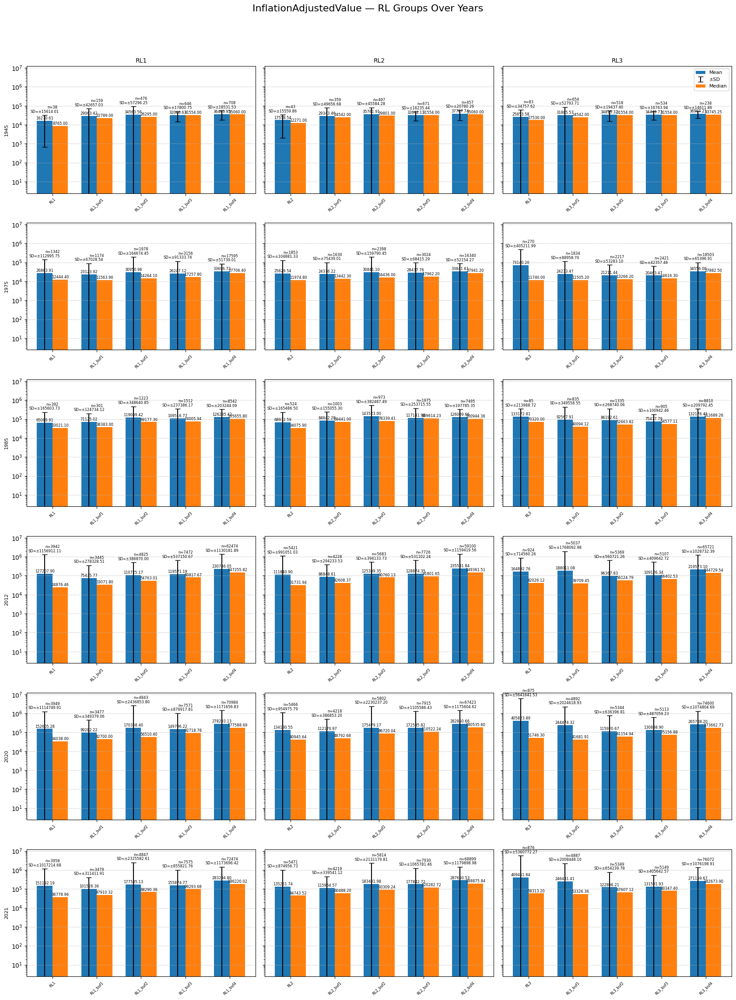

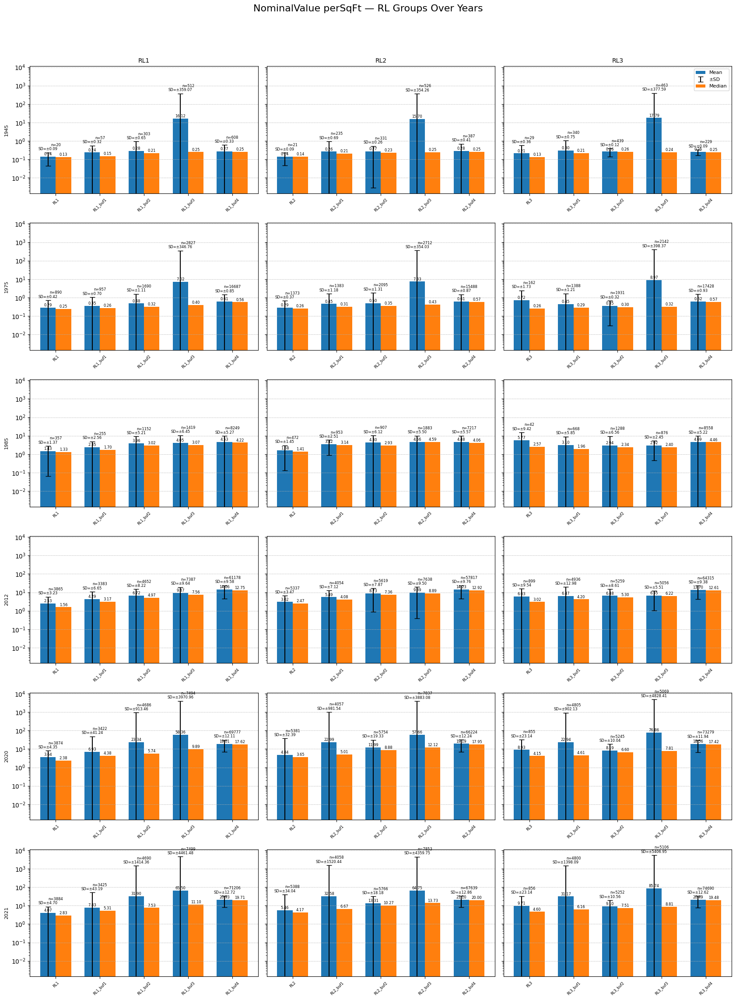

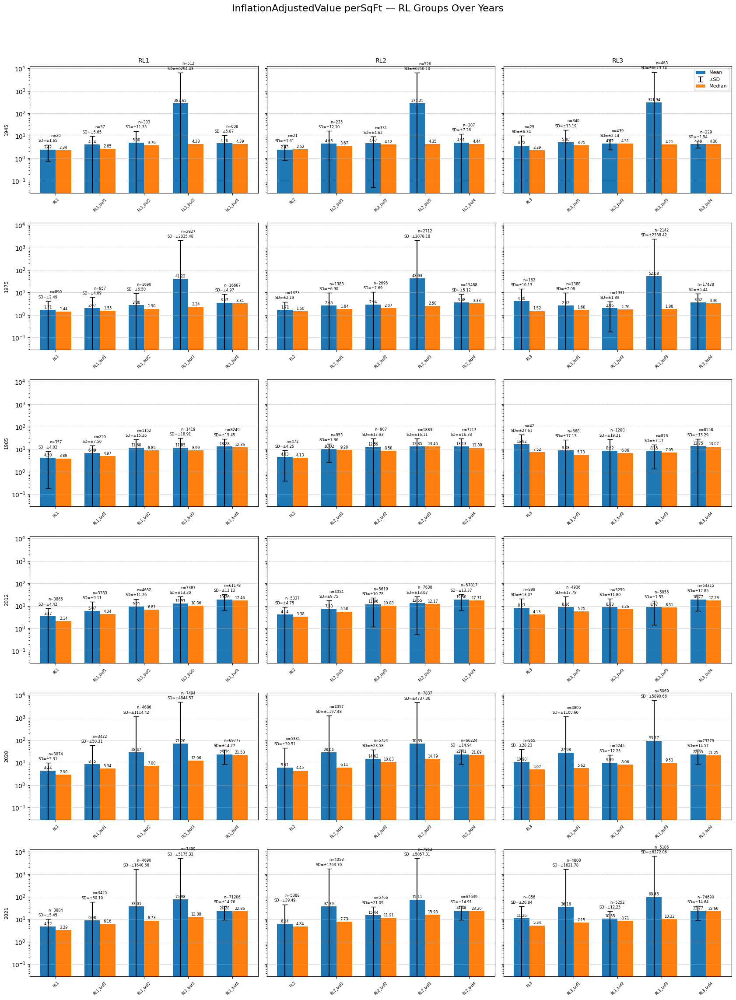

In [ ]:
# Cell 20: 6×3 Bar Charts with Mean, ±SD, Median & per-zone n

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm

# ── 1) Load data ───────────────────────────────────────────────────────────────


# ── 2) Setup years & value‐type → column mapping ───────────────────────────────
years = [1945, 1975, 1985, 2012, 2020, 2021]
value_types_map = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# ── 3) Define RL groups & their zones ──────────────────────────────────────────
rl_prefixes = ['RL1', 'RL2', 'RL3']
group_zones = {
    p: [p] + [f"{p}_buf{i}" for i in range(1,5)]
    for p in rl_prefixes
}

# ── 4) Loop over each value type ───────────────────────────────────────────────
for vt, col_fn in value_types_map.items():
    # 4a) Compute shared log‐scale from all means
    all_means = zone_stats[zone_stats.ValueType==vt]['mean']
    norm = LogNorm(vmin=max(all_means.min(), 1e-6), vmax=all_means.max())

    # 4b) Set up 6×3 grid
    fig, axes = plt.subplots(6, 3, figsize=(18,24), sharey=True)

    for i, yr in enumerate(years):
        for j, prefix in enumerate(rl_prefixes):
            ax    = axes[i, j]
            zones = group_zones[prefix]

            # subset & order
            ss = (zone_stats
                  .query("CityLimitYear==@yr and ValueType==@vt and Zone in @zones")
                  .set_index('Zone')
                  .reindex(zones))

            x     = np.arange(len(zones))
            means = ss['mean'].values
            meds  = ss['median'].values
            errs  = ss['std'].values

            w = 0.35
            # plot Mean bars + SD errorbars + Median bars
            bar_mean = ax.bar(x-w/2, means, width=w, color='C0', label='Mean')
            eb       = ax.errorbar(x-w/2, means, yerr=errs, fmt='none',
                                   ecolor='black', capsize=4, label='±SD')
            bar_med  = ax.bar(x+w/2, meds, width=w, color='C1', label='Median')

            # annotate mean, ±SD, median, n
            for xi, zone in enumerate(zones):
                row   = ss.loc[zone]
                mean  = row['mean']
                sd    = row['std']
                med   = row['median']
                n_val = int(row['n'])
                top   = max(mean+sd, med)

                ax.text(xi-w/2, mean*1.05,          f"{mean:.2f}",
                        ha='center', va='bottom', fontsize=6)
                ax.text(xi-w/2, (mean+sd)*1.2,     f"SD=±{sd:.2f}",
                        ha='center', va='bottom', fontsize=6)
                ax.text(xi+w/2, med*1.05,           f"{med:.2f}",
                        ha='center', va='bottom', fontsize=6)
                ax.text(xi,       top*2,         f"n={n_val}",
                        ha='center', va='bottom', fontsize=6)

            # titles & labels
            if i == 0:
                ax.set_title(prefix, fontsize=10)
            if j == 0:
                ax.set_ylabel(str(yr), fontsize=8)

            ax.set_yscale('log')
            ax.set_xticks(x)
            ax.set_xticklabels(zones, rotation=45, fontsize=6)
            ax.grid(axis='y', linestyle='--', linewidth=0.5)

    # single legend in top right
    axes[0,2].legend(fontsize=8)

    fig.suptitle(f"{vt.replace('_',' ')} — RL Groups Over Years", fontsize=16)
    fig.tight_layout(rect=[0.03,0.03,0.97,0.95])
    plt.show()


In [ ]:
# Cell 17: Prepare GeoDataFrame of parcels & load city-limit shapes

# Create GeoDataFrame from lon/lat (adjust column names if needed)
gdf_parcels = gpd.GeoDataFrame(
    df,
    geometry=[Point(xy) for xy in zip(df.Longitude, df.Latitude)],
    crs="EPSG:4326"
)

# Read each year’s city-limit shapefile and reproject
years = [1945, 1975, 1985, 2012, 2020, 2021]
city_limits = {}
for yr in years:
    shp_path = f'/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/city_limit_{yr}/city_limit_{yr}.shp'   # update if your path differs
    city = gpd.read_file(shp_path).to_crs(gdf_parcels.crs)
    city_limits[yr] = city


In [ ]:
# Cell 18: Plot 4 figures with 6 subplots each,
# shared log-scale per figure, annotated with per-ValueType parcel counts

# 1) Precompute parcels inside each city-limit
gdf_in_by_year = {}
for yr, city in city_limits.items():
    gdf_in_by_year[yr] = gpd.sjoin(
        gdf_parcels,
        city[['geometry']],
        how='inner',
        predicate='within'
    )

# 2) Define your four value-type → column mappings
value_types = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'  # check your exact column
}

# 3) Compute counts for each (ValueType, Year)
counts_by_vt_year = {
    vt: {
        yr: int(
            gdf_in_by_year[yr][col_fn(yr)]
            .notna()
            .sum()
        )
        for yr in years
    }
    for vt, col_fn in value_types.items()
}

# 4) Plot one figure per ValueType
for vt, col_fn in value_types.items():
    # determine vmin/vmax across all years for this VT
    vmins, vmaxs = [], []
    for yr in years:
        col = col_fn(yr)
        vals = gdf_in_by_year[yr][col].dropna()
        if not vals.empty:
            vmins.append(vals.min())
            vmaxs.append(vals.max())
    vmin, vmax = min(vmins), max(vmaxs)
    if vt == 'NominalValue':
        norm = LogNorm(vmin=10.0, vmax=45550.0)
    elif vt == 'InflationAdjustedValue':
        norm = LogNorm(vmin=175.3, vmax=798491.5)
    elif vt == 'NominalValue_perSqFt':
        norm = LogNorm(vmin=0.00119047619047619, vmax=8125.0)
    else:  # InflationAdjustedValue_perSqFt
        norm = LogNorm(vmin=0.02086904761904762, vmax=142431.25)

    # set up 2×3 grid
    fig, axes = plt.subplots(2, 3, figsize=(15,10), sharex=True, sharey=True)
    axes = axes.flatten()

    for ax, yr in zip(axes, years):
        city_limits[yr].boundary.plot(ax=ax, color='black', linewidth=0.8)
        gdf_in_by_year[yr].plot(
            ax=ax,
            column=col_fn(yr),
            cmap='viridis',
            norm=norm,
            markersize=6,
            alpha=0.7,
            legend=False
        )
        # annotate with year and count of non-null parcels for this VT
        n = counts_by_vt_year[vt][yr]
        ax.set_title(f"{yr}\n(n={n})", fontsize=10)
        ax.set_xticks([])
        ax.set_yticks([])

    # tighten and add shared colorbar
    fig.subplots_adjust(left=0.02, right=0.88, top=0.92,
                        bottom=0.05, wspace=0.02, hspace=0.15)
    cax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
    sm = plt.cm.ScalarMappable(cmap='viridis', norm=norm)
    sm.set_array([])
    fig.colorbar(sm, cax=cax, label=vt)

    fig.suptitle(f"{vt} Across City-Limit Years", fontsize=16)
    plt.show()


Output hidden; open in https://colab.research.google.com to view.

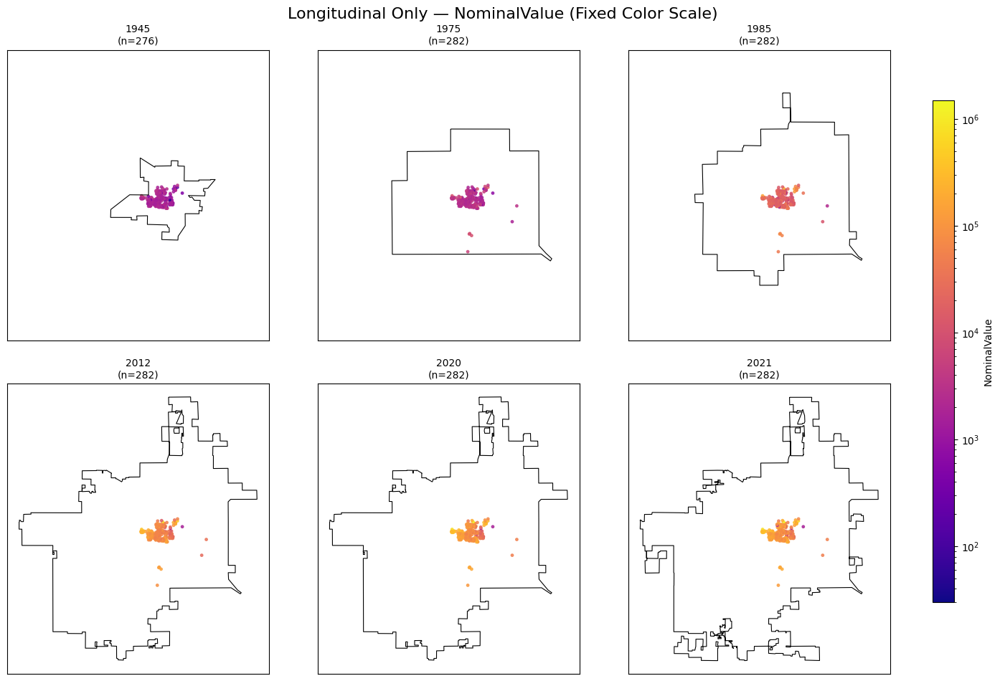

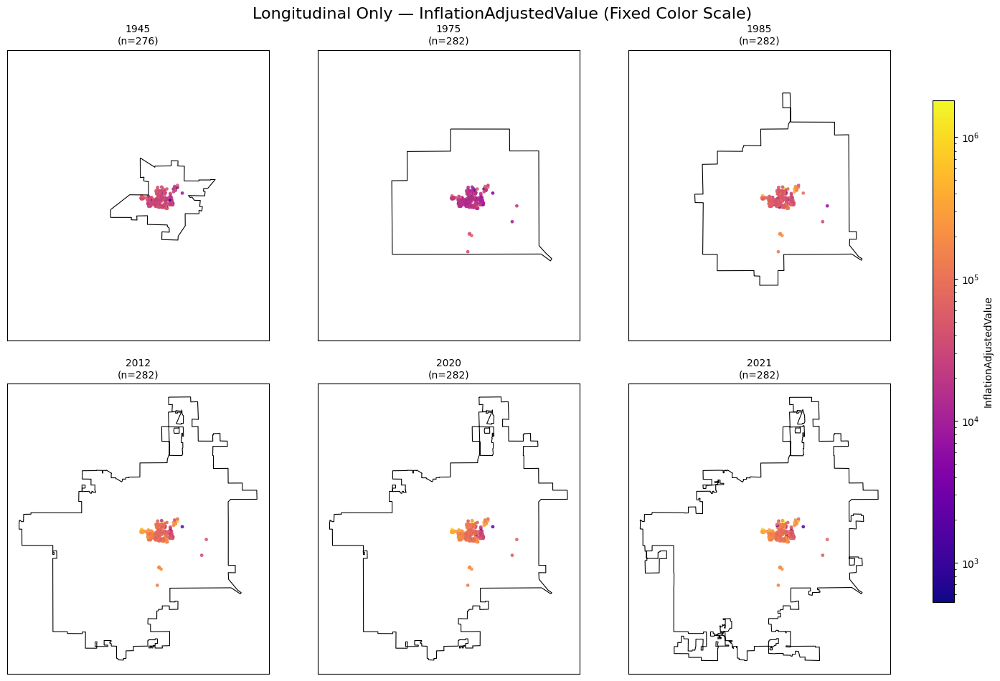

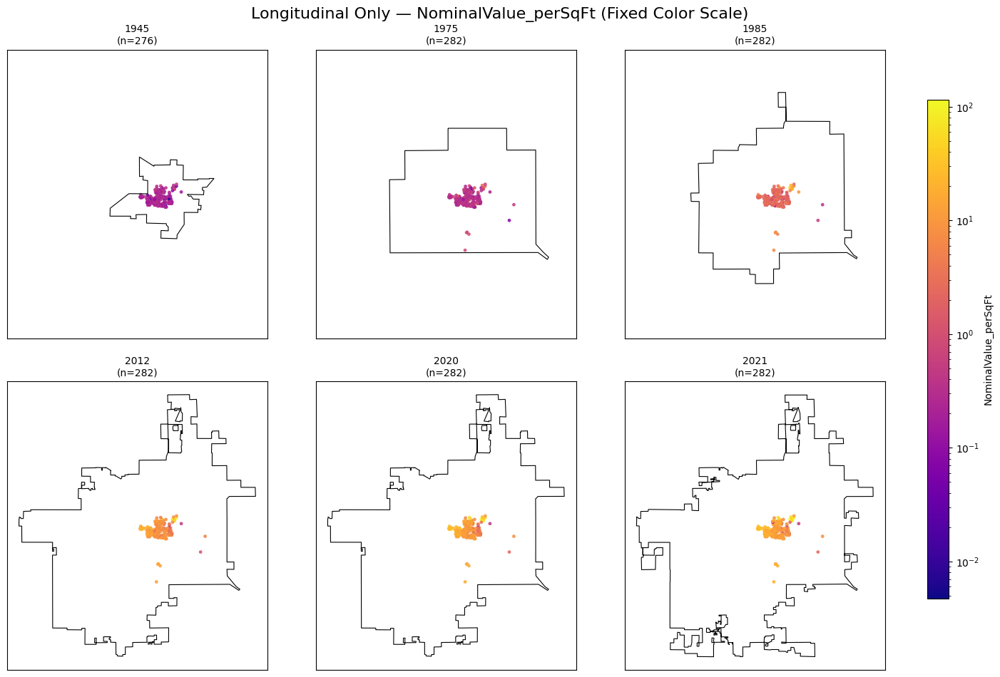

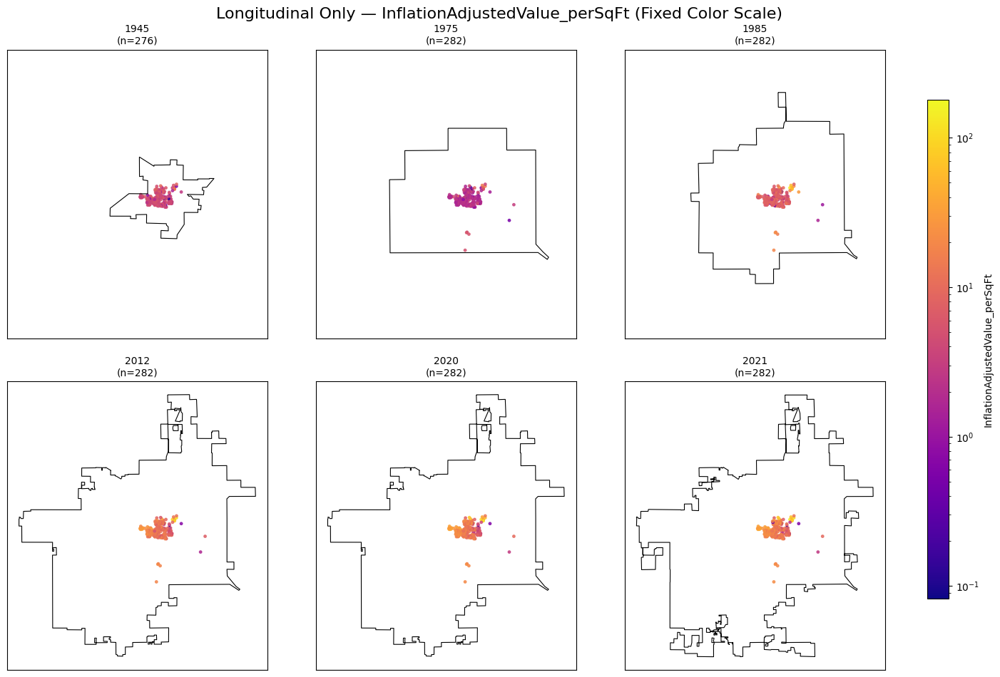

In [ ]:
# Cell 18 (Revised): Zone‐Level Maps for Longitudinal Subset with Fixed Color Scales

# 1) Build longitudinal GeoDataFrame
gdf_long = gdf_parcels.loc[df_common.index]

# 2) Spatial join to get parcels inside each year’s limit
gdf_long_in = {}
counts_long = {}
for yr, city in city_limits.items():
    joined = gpd.sjoin(gdf_long, city[['geometry']], how='inner', predicate='within')
    gdf_long_in[yr] = joined
    counts_long[yr] = len(joined)

# 3) Define fixed vmin/vmax from your summary
fixed_scales = {
    'NominalValue':                   (30.0, 1.490182e6),
    'InflationAdjustedValue':         (525.9, 1.818022e6),
    'NominalValue_perSqFt':           (0.004706, 115.5207),
    'InflationAdjustedValue_perSqFt': (0.082494, 179.5072)
}

# 4) Map ValueType → column function
value_types = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# 5) Plot each ValueType with fixed color scale
for vt, col_fn in value_types.items():
    vmin, vmax = fixed_scales[vt]
    norm = LogNorm(vmin=vmin, vmax=vmax)

    fig, axes = plt.subplots(2, 3, figsize=(15, 10), sharex=True, sharey=True)
    axes = axes.flatten()

    for ax, yr in zip(axes, years):
        # draw boundary
        city_limits[yr].boundary.plot(ax=ax, color='black', linewidth=0.8)
        # plot longitudinal parcels
        gdf_long_in[yr].plot(
            ax=ax,
            column=col_fn(yr),
            cmap='plasma',
            norm=norm,
            markersize=6,
            alpha=0.8,
            legend=False
        )
        ax.set_title(f"{yr}\n(n={counts_long[yr]})", fontsize=10)
        ax.set_xticks([]); ax.set_yticks([])

    # shared colorbar on right
    fig.subplots_adjust(left=0.02, right=0.88, top=0.92, bottom=0.05, wspace=0.02, hspace=0.15)
    cax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
    sm  = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
    sm.set_array([])
    fig.colorbar(sm, cax=cax, label=vt)

    fig.suptitle(f"Longitudinal Only — {vt} (Fixed Color Scale)", fontsize=16)
    plt.show()


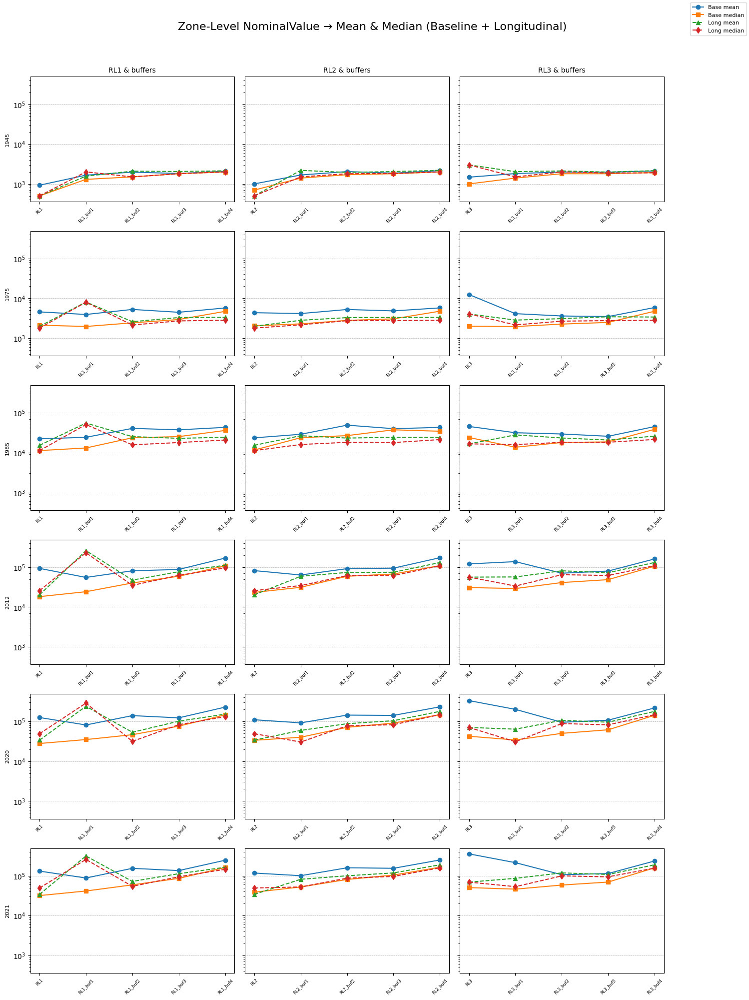

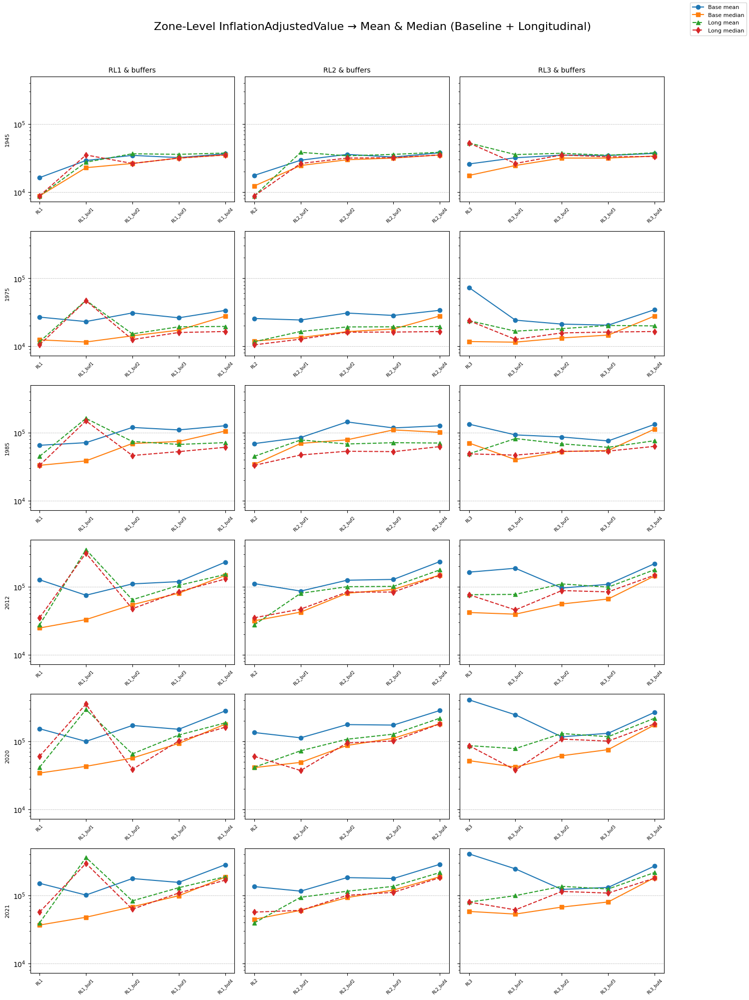

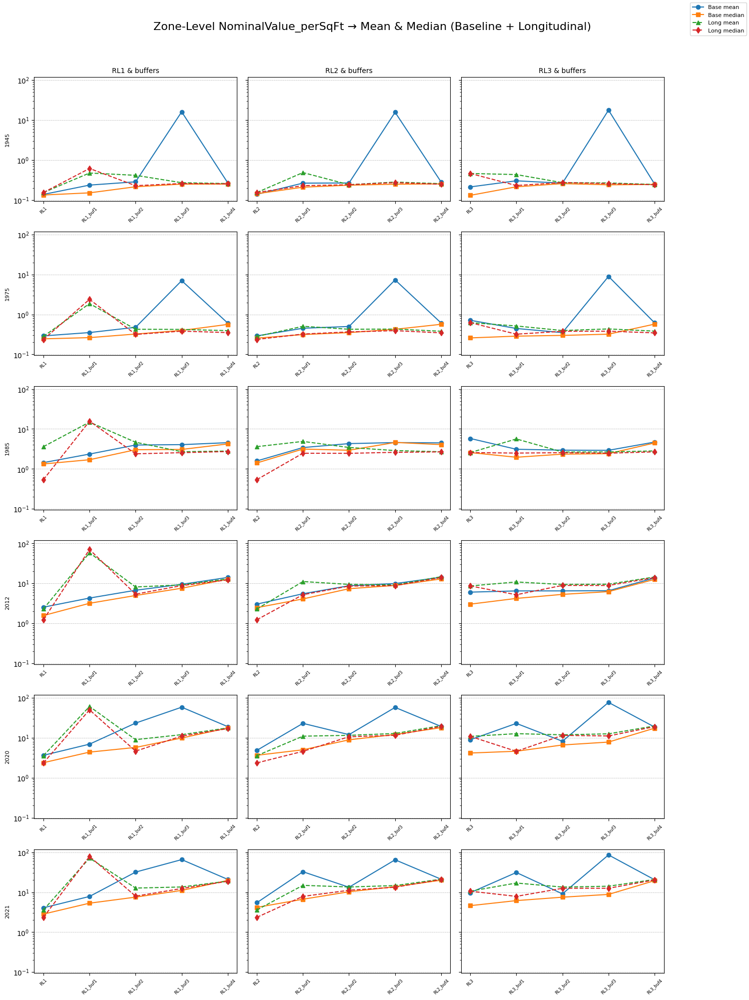

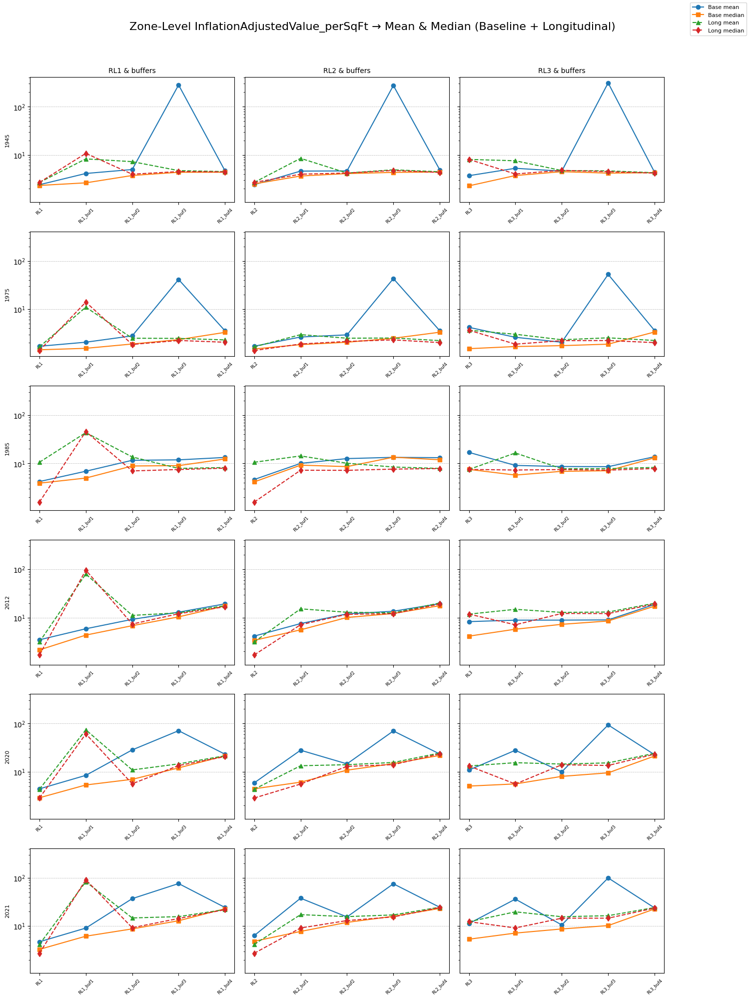

In [ ]:
# Cell 16 (Updated): Zone‐Level Mean & Median on Log Scale for Baseline + Longitudinal

# 2) Define years and RL+buffer groups
years = [1945, 1975, 1985, 2012, 2020, 2021]
zone_groups = {
    'RL1 & buffers': ['RL1','RL1_buf1','RL1_buf2','RL1_buf3','RL1_buf4'],
    'RL2 & buffers': ['RL2','RL2_buf1','RL2_buf2','RL2_buf3','RL2_buf4'],
    'RL3 & buffers': ['RL3','RL3_buf1','RL3_buf2','RL3_buf3','RL3_buf4']
}

# 3) Value types to loop over
value_types = ['NominalValue','InflationAdjustedValue',
               'NominalValue_perSqFt','InflationAdjustedValue_perSqFt']

# 4) Plot
for vt in value_types:
    fig, axes = plt.subplots(len(years), len(zone_groups),
                             figsize=(15, 20), sharey=True)
    for i, yr in enumerate(years):
        for j, (group_name, zones) in enumerate(zone_groups.items()):
            ax = axes[i, j]
            # Baseline subset
            df_base = (zone_stats_df
                       .query("CityLimitYear==@yr and ValueType==@vt and Zone in @zones")
                       .set_index('Zone')
                       .reindex(zones))
            # Longitudinal subset
            df_long = (zone_stats_common_df
                       .query("CityLimitYear==@yr and ValueType==@vt and Zone in @zones")
                       .set_index('Zone')
                       .reindex(zones))
            x = np.arange(len(zones))
            # Plot baseline mean & median
            ax.plot(x, df_base['mean'],   marker='o', color='C0', label='Base mean')
            ax.plot(x, df_base['median'], marker='s', color='C1', label='Base median')
            # Plot longitudinal mean & median
            ax.plot(x, df_long['mean'],   marker='^', linestyle='--', color='C2', label='Long mean')
            ax.plot(x, df_long['median'], marker='d', linestyle='--', color='C3', label='Long median')

            ax.set_yscale('log')
            ax.set_xticks(x)
            ax.set_xticklabels(zones, rotation=45, fontsize=6)
            ax.set_title(f"{group_name}" if i==0 else "", fontsize=10)
            if j==0:
                ax.set_ylabel(str(yr), fontsize=8)
            ax.grid(axis='y', linestyle='--', linewidth=0.5)

    # Shared legend
    handles, labels = axes[0,-1].get_legend_handles_labels()
    fig.legend(handles, labels, loc='upper right', fontsize=8)
    fig.suptitle(f"Zone‐Level {vt} → Mean & Median (Baseline + Longitudinal)", fontsize=16)
    plt.tight_layout(rect=[0,0,0.9,0.96])
    plt.show()


In [ ]:
# Cell 24: Advanced Interactive Boxplots (Mean, SD Hover, Thicker Boxes, No Whiskers)

# 2) Create longitudinal subset
years = [1945, 1975, 1985, 2012, 2020, 2021]
mask = pd.Series(True, index=df.index)
for yr in years:
    mask &= df[f'TotalValue_{yr}'].notna() & df[f'F2025DollarValueTotalValue_{yr}'].notna()
df_common = df[mask]

# 3) ValueType ‑→ column
value_types_map = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}
vt_keys = list(value_types_map.keys())

# ── City‐Level Figure ─────────────────────────────────────────────────────────
city_traces = []
for i, vt in enumerate(vt_keys):
    fn = value_types_map[vt]
    for group_name, data in [('Baseline', df), ('Longitudinal', df_common)]:
        for yr in years:
            col = fn(yr)
            vals = data.loc[data[f'IsIn_citylimit_{yr}']==1, col].dropna()
            city_traces.append(
                go.Box(
                    y=vals,
                    x=[str(yr)]*len(vals),
                    name=f"{group_name} (n={len(vals)})",
                    legendgroup=group_name,
                    marker_color=('steelblue' if group_name=='Baseline' else 'indianred'),
                    boxpoints=False,
                    boxmean=True,               # show mean only
                    line=dict(width=3)          # thicker box border
                )
            )

fig_city = go.Figure(data=city_traces)
n_tr = len(years)*2
city_buttons = []
for i, vt in enumerate(vt_keys):
    visible = [(j//n_tr)==i for j in range(len(city_traces))]
    city_buttons.append(dict(
        label=vt,
        method='update',
        args=[{'visible': visible},
              {'title': f"City‐Level: {vt}"}]
    ))

fig_city.update_layout(
    updatemenus=[dict(active=0, buttons=city_buttons,
                     x=0, y=1.15, xanchor='left', yanchor='top')],
    title=f"City‐Level: {vt_keys[0]}",
    xaxis_title="Year",
    yaxis_title="Value (log scale)",
    yaxis_type="log",
    boxmode='group',
    legend_title="Group"
)

# ── Zone‐Level Figure ─────────────────────────────────────────────────────────
zones = [
    'RL1','RL1_buf1','RL1_buf2','RL1_buf3','RL1_buf4',
    'RL2','RL2_buf1','RL2_buf2','RL2_buf3','RL2_buf4',
    'RL3','RL3_buf1','RL3_buf2','RL3_buf3','RL3_buf4'
]
zone_traces = []
for i, vt in enumerate(vt_keys):
    fn = value_types_map[vt]
    for group_name, data in [('Baseline', df), ('Longitudinal', df_common)]:
        for zone_flag in zones:
            vals = pd.concat([
                data.loc[(data[f'IsIn_citylimit_{yr}']==1) & (data[zone_flag]==1), fn(yr)].dropna()
                for yr in years
            ], ignore_index=True)
            zone_traces.append(
                go.Box(
                    y=vals,
                    x=[zone_flag]*len(vals),
                    name=f"{group_name} (n={len(vals)})",
                    legendgroup=group_name,
                    marker_color=('steelblue' if group_name=='Baseline' else 'indianred'),
                    boxpoints=False,
                    boxmean=True,
                    line=dict(width=3)
                )
            )

fig_zone = go.Figure(data=zone_traces)
n_z = len(zones)*2
zone_buttons = []
for i, vt in enumerate(vt_keys):
    visible = [(j//n_z)==i for j in range(len(zone_traces))]
    zone_buttons.append(dict(
        label=vt,
        method='update',
        args=[{'visible': visible},
              {'title': f"Zone‐Level: {vt}"}]
    ))

fig_zone.update_layout(
    updatemenus=[dict(active=0, buttons=zone_buttons,
                     x=0, y=1.15, xanchor='left', yanchor='top')],
    title=f"Zone‐Level: {vt_keys[0]}",
    xaxis_title="Zone Category",
    yaxis_title="Value (log scale)",
    yaxis_type="log",
    boxmode='group',
    legend_title="Group"
)

# ── Write Combined HTML ────────────────────────────────────────────────────────
html_city = fig_city.to_html(include_plotlyjs=True, full_html=False)
html_zone = fig_zone.to_html(include_plotlyjs=False, full_html=False)

html = f"""
<!DOCTYPE html>
<html>
<head>
  <meta charset="utf-8" />
  <title>Advanced Lubbock Analysis</title>
  <script src="https://cdn.plot.ly/plotly-latest.min.js"></script>
  <style>
    body {{ font-family: Arial, sans-serif; margin: 20px; }}
    h2 {{ color: #333; }}
    .section {{ margin-bottom: 60px; }}
  </style>
</head>
<body>
  <div class="section">
    <h2>City‐Level Interactive Boxplots</h2>
    {html_city}
  </div>
  <div class="section">
    <h2>Zone‐Level Interactive Boxplots</h2>
    {html_zone}
  </div>
</body>
</html>
"""

with open('advanced_stats.html','w') as f:
    f.write(html)

print("✅ Enhanced HTML with thicker boxes & mean markers written to advanced_stats.html")


✅ Enhanced HTML with thicker boxes & mean markers written to advanced_stats.html


In [ ]:
df.to_csv('parcels_all_updated_may28.csv')

## TASK 3: Compute Core Comparative Statistics (In vs. Out) for Each Redlining Zone

In [ ]:
# Define years and core zones
years = [1945, 1975, 1985, 2012, 2020, 2021]
core_zones = ['RL1', 'RL2', 'RL3']

# Define value types → column functions
value_types_map = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# Prepare list of statistic names
stat_names = ['count','min','q25','mean','mode','median','q75','max','std']

# Loop to compute stats
records = []
for yr in years:
    city_flag = f'IsIn_citylimit_{yr}'
    # mask of parcels within city limit
    mask_city = df[city_flag] == 1

    for zone in core_zones:
        # masks for inside vs. outside this core zone
        mask_in  = mask_city & (df[zone] == 1)
        mask_out = mask_city & (df[zone] == 0)

        for group_name, mask in [('in', mask_in), ('out', mask_out)]:
            subset = df.loc[mask]
            for vt, col_fn in value_types_map.items():
                col = col_fn(yr)
                vals = subset[col].dropna()
                n = len(vals)
                if n > 0:
                    mn   = float(vals.min())
                    q25  = float(vals.quantile(0.25))
                    mean = float(vals.mean())
                    mode_arr = vals.mode()
                    mode = float(mode_arr.iloc[0]) if not mode_arr.empty else np.nan
                    med  = float(vals.median())
                    q75  = float(vals.quantile(0.75))
                    mx   = float(vals.max())
                    std  = float(vals.std(ddof=1))
                else:
                    mn = q25 = mean = mode = med = q75 = mx = std = np.nan

                records.append({
                    'Year': yr,
                    'Zone': zone,
                    'Group': group_name,
                    'ValueType': vt,
                    'count': n,
                    'min': mn,
                    'q25': q25,
                    'mean': mean,
                    'mode': mode,
                    'median': med,
                    'q75': q75,
                    'max': mx,
                    'std': std
                })

# Assemble into DataFrame and save
stats_df = pd.DataFrame.from_records(records)
stats_df.to_csv('core_comparison_stats_in_vs_out.csv', index=False)

# Display summary
print(f"Computed {stats_df.shape[0]} rows × {stats_df.shape[1]} columns")
stats_df


Computed 144 rows × 13 columns


,Year,Zone,Group,ValueType,count,min,q25,mean,mode,median,q75,max,std
0,1945,RL1,in,NominalValue,38,20.000000,250.000000,928.157895,400.000000,500.000000,1575.000000,3.000000e+03,8.907023e+02
1,1945,RL1,in,InflationAdjustedValue,38,350.600000,4382.500000,16270.607895,7012.000000,8765.000000,27609.750000,5.259000e+04,1.561401e+04
2,1945,RL1,in,NominalValue_perSqFt,20,0.004762,0.059249,0.137882,0.257143,0.133333,0.232803,2.857143e-01,9.435870e-02
3,1945,RL1,in,InflationAdjustedValue_perSqFt,20,0.083476,1.038636,2.417073,4.507714,2.337333,4.081043,5.008571e+00,1.654108e+00
4,1945,RL1,out,NominalValue,1989,10.000000,1300.000000,1939.261438,1800.000000,1800.000000,2200.000000,4.000000e+04,1.942373e+03
5,1945,RL1,out,InflationAdjustedValue,1989,175.300000,22789.000000,33995.253007,31554.000000,31554.000000,38566.000000,7.012000e+05,3.404980e+04
6,1945,RL1,out,NominalValue_perSqFt,1480,0.001190,0.192890,5.755479,0.214286,0.240000,0.285714,8.125000e+03,2.111927e+02
7,1945,RL1,out,InflationAdjustedValue_perSqFt,1480,0.020869,3.381365,100.893543,3.756429,4.207200,5.008571,1.424312e+05,3.702209e+03
8,1945,RL2,in,NominalValue,43,20.000000,315.000000,1001.627907,400.000000,700.000000,1700.000000,3.000000e+03,8.876130e+02
9,1945,RL2,in,InflationAdjustedValue,43,350.600000,5521.950000,17558.537209,7012.000000,12271.000000,29801.000000,5.259000e+04,1.555986e+04


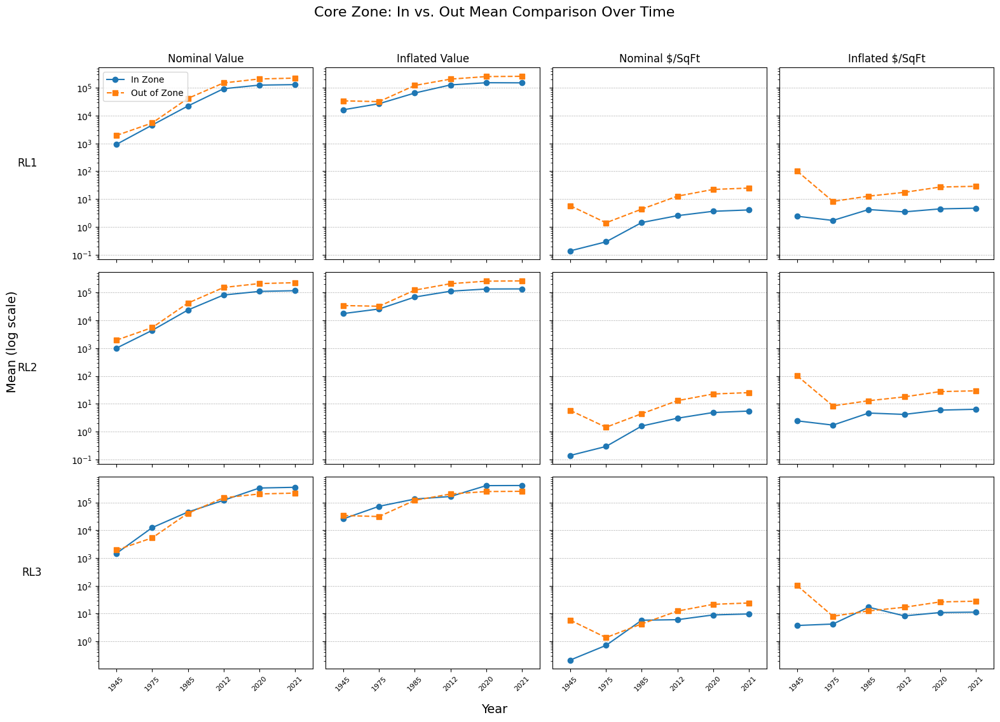

In [ ]:
# Cell 27 (Updated): In vs. Out Mean Comparison with Equal‐Spaced Years & Row Labels

# Define parameters
years       = [1945, 1975, 1985, 2012, 2020, 2021]
x_pos       = list(range(len(years)))   # [0,1,2,3,4,5]
core_zones  = ['RL1', 'RL2', 'RL3']
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]
vt_titles = {
    'NominalValue': 'Nominal Value',
    'InflationAdjustedValue': 'Inflated Value',
    'NominalValue_perSqFt': 'Nominal $/SqFt',
    'InflationAdjustedValue_perSqFt': 'Inflated $/SqFt'
}

# Prepare the figure: 3 rows (zones) × 4 columns (metrics)
fig, axes = plt.subplots(
    nrows=len(core_zones),
    ncols=len(value_types),
    figsize=(16, 12),
    sharex=True, sharey='row'
)

for i, zone in enumerate(core_zones):
    for j, vt in enumerate(value_types):
        ax = axes[i, j]

        # filter stats_df & pivot
        df_vt = stats_df[(stats_df.Zone == zone) & (stats_df.ValueType == vt)]
        pivot = df_vt.pivot(index='Year', columns='Group', values='mean').reindex(years)

        # plot “in” vs “out” at x_pos
        ax.plot(x_pos, pivot['in'],  marker='o', color='C0', label='In Zone')
        ax.plot(x_pos, pivot['out'], marker='s', color='C1', linestyle='--', label='Out of Zone')

        # equal‐spacing ticks labeled with years
        ax.set_xticks(x_pos)
        ax.set_xticklabels(years, rotation=45, fontsize=8)

        # styling
        ax.set_yscale('log')
        ax.grid(axis='y', linestyle='--', linewidth=0.5)
        ax.set_xlim(-0.5, len(years)-0.5)

        # column titles
        if i == 0:
            ax.set_title(vt_titles[vt], fontsize=12)
        # legend only once
        if i == 0 and j == 0:
            ax.legend(loc='upper left', fontsize=10)

# Add row labels on first column, centered vertically
for row_idx, zone in enumerate(core_zones):
    ax = axes[row_idx, 0]
    # place the label to the left; adjust labelpad as needed
    ax.set_ylabel(zone, fontsize=12, rotation=0, labelpad=50, va='center')

# Common figure labels
fig.supxlabel("Year", fontsize=14)
fig.supylabel("Mean (log scale)", fontsize=14)
fig.suptitle("Core Zone: In vs. Out Mean Comparison Over Time", fontsize=16, y=0.94)

plt.tight_layout(rect=[0, 0, 1, 0.92])
plt.show()


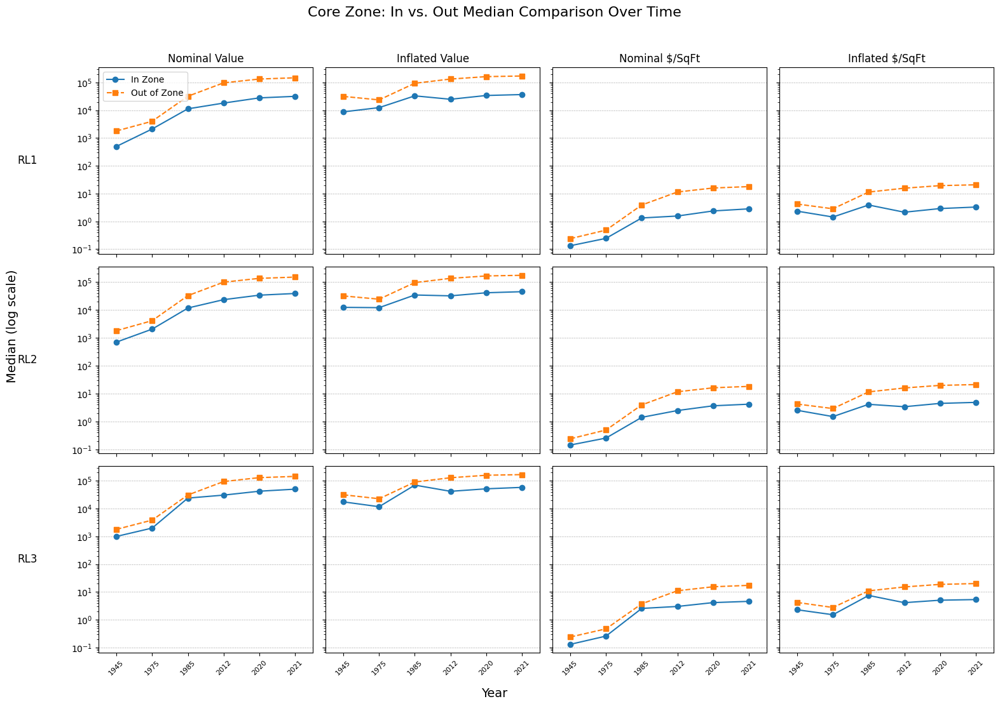

In [ ]:
# Cell 28: Core Zone “In vs Out” Median Comparison (log scale, equal-spaced years)

# Define parameters
years       = [1945, 1975, 1985, 2012, 2020, 2021]
x_pos       = list(range(len(years)))        # [0,1,2,3,4,5]
core_zones  = ['RL1', 'RL2', 'RL3']
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]
vt_titles = {
    'NominalValue': 'Nominal Value',
    'InflationAdjustedValue': 'Inflated Value',
    'NominalValue_perSqFt': 'Nominal $/SqFt',
    'InflationAdjustedValue_perSqFt': 'Inflated $/SqFt'
}

# Set up the 3×4 grid
fig, axes = plt.subplots(
    nrows=len(core_zones),
    ncols=len(value_types),
    figsize=(16, 12),
    sharex=True, sharey='row'
)

# Loop through zones & value‐types, plotting medians
for i, zone in enumerate(core_zones):
    for j, vt in enumerate(value_types):
        ax = axes[i, j]
        # filter & pivot medians
        df_vt = stats_df[(stats_df.Zone==zone)&(stats_df.ValueType==vt)]
        pivot = df_vt.pivot(index='Year', columns='Group', values='median').reindex(years)

        # plot “in” vs “out” at equally spaced x
        ax.plot(x_pos, pivot['in'],  marker='o', color='C0', label='In Zone')
        ax.plot(x_pos, pivot['out'], marker='s', color='C1', linestyle='--', label='Out of Zone')

        # equal‐spacing & labels
        ax.set_xticks(x_pos)
        ax.set_xticklabels(years, rotation=45, fontsize=8)
        ax.set_xlim(-0.5, len(years)-0.5)

        # styling
        ax.set_yscale('log')
        ax.grid(axis='y', linestyle='--', linewidth=0.5)

        # titles & legend
        if i==0:
            ax.set_title(vt_titles[vt], fontsize=12)
        if i==0 and j==0:
            ax.legend(loc='upper left', fontsize=10)

# Row labels on first column
for row_idx, zone in enumerate(core_zones):
    axes[row_idx, 0].set_ylabel(zone, fontsize=12, rotation=0, labelpad=50, va='center')

# Global figure labels
fig.supxlabel("Year", fontsize=14)
fig.supylabel("Median (log scale)", fontsize=14)
fig.suptitle("Core Zone: In vs. Out Median Comparison Over Time", fontsize=16, y=0.92)

plt.tight_layout(rect=[0,0,1,0.90])
plt.show()


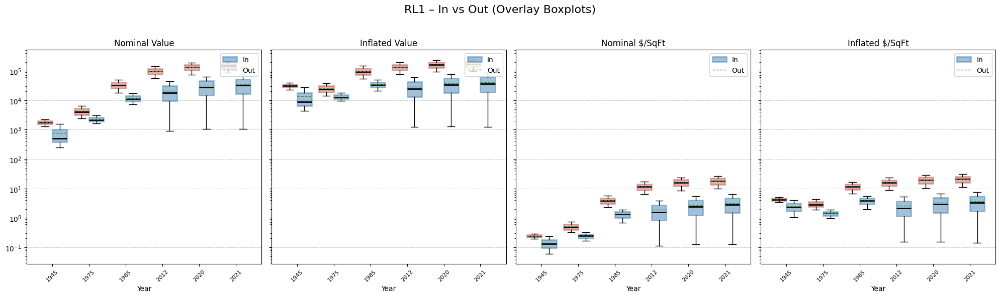

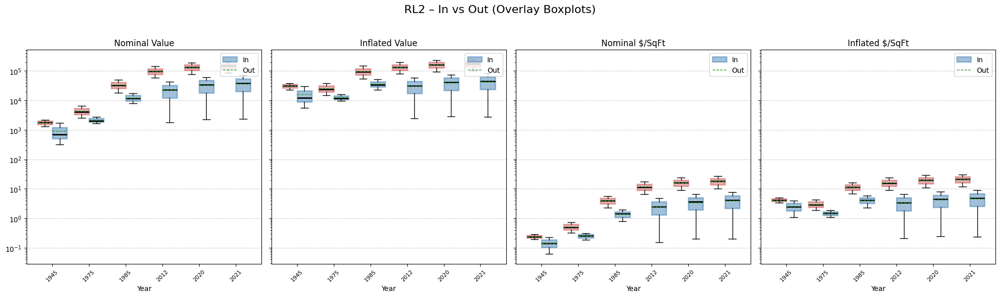

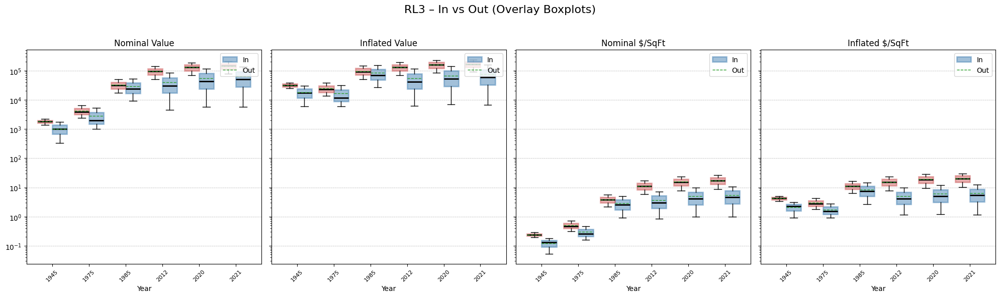

In [ ]:
# Cell 30: Overlay Boxplots – In vs Out (Overlay comparison for each year, with legends)

# 2) Define parameters
years = [1945, 1975, 1985, 2012, 2020, 2021]
core_zones = ['RL1', 'RL2', 'RL3']
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]
vt_titles = {
    'NominalValue': 'Nominal Value',
    'InflationAdjustedValue': 'Inflated Value',
    'NominalValue_perSqFt': 'Nominal $/SqFt',
    'InflationAdjustedValue_perSqFt': 'Inflated $/SqFt'
}

# 3) Create figure for each core zone
for zone in core_zones:
    fig, axes = plt.subplots(1, len(value_types), figsize=(20, 6), sharey=True)
    fig.suptitle(f"{zone} – In vs Out (Overlay Boxplots)", fontsize=16)

    for ax, vt in zip(axes, value_types):
        # Filter stats for this zone and value type
        df_vt = stats_df[(stats_df.Zone == zone) & (stats_df.ValueType == vt)]

        # Plot the "In" vs "Out" boxplots for each year
        for grp, color in [('in', 'steelblue'), ('out', 'indianred')]:
            # Filter for "In" or "Out" group and plot
            data = []
            for yr in years:
                row = df_vt.query("Year == @yr and Group == @grp").iloc[0]
                data.append(row[['q25', 'median', 'q75']].values)  # q25, median, q75 for the box
            # Convert data into list of data points for plotting boxplot
            ax.boxplot(data, positions=[i + 0.2 if grp == 'in' else i - 0.2 for i in range(len(years))],
                       widths=0.4, showmeans=True, meanline=True,
                       patch_artist=True,
                       boxprops=dict(linewidth=2, color=color, facecolor=color, alpha=0.5),
                       medianprops=dict(linewidth=2, color='black'))

        # Customize plot
        ax.set_xticks(range(len(years)))
        ax.set_xticklabels(years, rotation=45, fontsize=8)
        ax.set_yscale('log')
        ax.set_title(vt_titles[vt], fontsize=12)
        ax.set_xlabel("Year", fontsize=10)
        ax.grid(axis='y', linestyle='--', linewidth=0.5)
        ax.legend(["In", "Out"], loc="upper right", fontsize=10)

    fig.tight_layout(rect=[0, 0, 1, 0.95])
    plt.show()


In [ ]:
# Define years and core zones
years = [1945, 1975, 1985, 2012, 2020, 2021]
core_zones = ['RL1', 'RL2', 'RL3']

# Define value types → column functions
value_types_map = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# Prepare list of statistic names
stat_names = ['count','min','q25','mean','mode','median','q75','max','std']

# Loop to compute stats
records = []

# Loop over years for both Baseline and Longitudinal comparison
for yr in years:
    city_flag = f'IsIn_citylimit_{yr}'  # Flag for parcels inside the city limits of each year

    # mask of parcels within city limit (for baseline & longitudinal)
    mask_city = df[city_flag] == 1

    # Baseline: Use all the parcels in the city limit for that year
    for zone in core_zones:
        # masks for inside vs. outside this core zone (baseline)
        mask_in  = mask_city & (df[zone] == 1)
        mask_out = mask_city & (df[zone] == 0)

        # Baseline group comparison
        for group_name, mask in [('in', mask_in), ('out', mask_out)]:
            subset = df.loc[mask]
            for vt, col_fn in value_types_map.items():
                col = col_fn(yr)
                vals = subset[col].dropna()
                n = len(vals)
                if n > 0:
                    mn   = float(vals.min())
                    q25  = float(vals.quantile(0.25))
                    mean = float(vals.mean())
                    mode_arr = vals.mode()
                    mode = float(mode_arr.iloc[0]) if not mode_arr.empty else np.nan
                    med  = float(vals.median())
                    q75  = float(vals.quantile(0.75))
                    mx   = float(vals.max())
                    std  = float(vals.std(ddof=1))
                else:
                    mn = q25 = mean = mode = med = q75 = mx = std = np.nan

                records.append({
                    'Year': yr,
                    'Zone': zone,
                    'Group': group_name,
                    'Comparison': 'Baseline',
                    'ValueType': vt,
                    'count': n,
                    'min': mn,
                    'q25': q25,
                    'mean': mean,
                    'mode': mode,
                    'median': med,
                    'q75': q75,
                    'max': mx,
                    'std': std
                })

    # Longitudinal: Use parcels common across all years (intersection of all 6 years' boundaries)
    for zone in core_zones:
        # masks for inside vs. outside this core zone (longitudinal subset)
        mask_in  = mask_city & (df[zone] == 1)
        mask_out = mask_city & (df[zone] == 0)

        # Longitudinal group comparison
        for group_name, mask in [('in', mask_in), ('out', mask_out)]:
            # Apply a mask where parcels are within boundaries for all 6 years
            longitudinal_mask = mask_city
            for year in years:
                longitudinal_mask &= df[f'IsIn_citylimit_{year}'] == 1  # intersection across all years

            subset_long = df.loc[longitudinal_mask & (df[zone] == (1 if group_name == 'in' else 0))]
            for vt, col_fn in value_types_map.items():
                col = col_fn(yr)
                vals = subset_long[col].dropna()
                n = len(vals)
                if n > 0:
                    mn   = float(vals.min())
                    q25  = float(vals.quantile(0.25))
                    mean = float(vals.mean())
                    mode_arr = vals.mode()
                    mode = float(mode_arr.iloc[0]) if not mode_arr.empty else np.nan
                    med  = float(vals.median())
                    q75  = float(vals.quantile(0.75))
                    mx   = float(vals.max())
                    std  = float(vals.std(ddof=1))
                else:
                    mn = q25 = mean = mode = med = q75 = mx = std = np.nan

                records.append({
                    'Year': yr,
                    'Zone': zone,
                    'Group': group_name,
                    'Comparison': 'Longitudinal',
                    'ValueType': vt,
                    'count': n,
                    'min': mn,
                    'q25': q25,
                    'mean': mean,
                    'mode': mode,
                    'median': med,
                    'q75': q75,
                    'max': mx,
                    'std': std
                })

# Assemble into DataFrame and save
stats_df = pd.DataFrame.from_records(records)
stats_df.to_csv('core_comparison_stats_in_vs_out_with_comparison_groups.csv', index=False)

# Display summary
print(f"Computed {stats_df.shape[0]} rows × {stats_df.shape[1]} columns")
stats_df


Computed 288 rows × 14 columns


,Year,Zone,Group,Comparison,ValueType,count,min,q25,mean,mode,median,q75,max,std
0,1945,RL1,in,Baseline,NominalValue,38,20.000000,250.000000,928.157895,400.000000,500.000000,1575.000000,3.000000e+03,8.907023e+02
1,1945,RL1,in,Baseline,InflationAdjustedValue,38,350.600000,4382.500000,16270.607895,7012.000000,8765.000000,27609.750000,5.259000e+04,1.561401e+04
2,1945,RL1,in,Baseline,NominalValue_perSqFt,20,0.004762,0.059249,0.137882,0.257143,0.133333,0.232803,2.857143e-01,9.435870e-02
3,1945,RL1,in,Baseline,InflationAdjustedValue_perSqFt,20,0.083476,1.038636,2.417073,4.507714,2.337333,4.081043,5.008571e+00,1.654108e+00
4,1945,RL1,out,Baseline,NominalValue,1989,10.000000,1300.000000,1939.261438,1800.000000,1800.000000,2200.000000,4.000000e+04,1.942373e+03
5,1945,RL1,out,Baseline,InflationAdjustedValue,1989,175.300000,22789.000000,33995.253007,31554.000000,31554.000000,38566.000000,7.012000e+05,3.404980e+04
6,1945,RL1,out,Baseline,NominalValue_perSqFt,1480,0.001190,0.192890,5.755479,0.214286,0.240000,0.285714,8.125000e+03,2.111927e+02
7,1945,RL1,out,Baseline,InflationAdjustedValue_perSqFt,1480,0.020869,3.381365,100.893543,3.756429,4.207200,5.008571,1.424312e+05,3.702209e+03
8,1945,RL2,in,Baseline,NominalValue,43,20.000000,315.000000,1001.627907,400.000000,700.000000,1700.000000,3.000000e+03,8.876130e+02
9,1945,RL2,in,Baseline,InflationAdjustedValue,43,350.600000,5521.950000,17558.537209,7012.000000,12271.000000,29801.000000,5.259000e+04,1.555986e+04


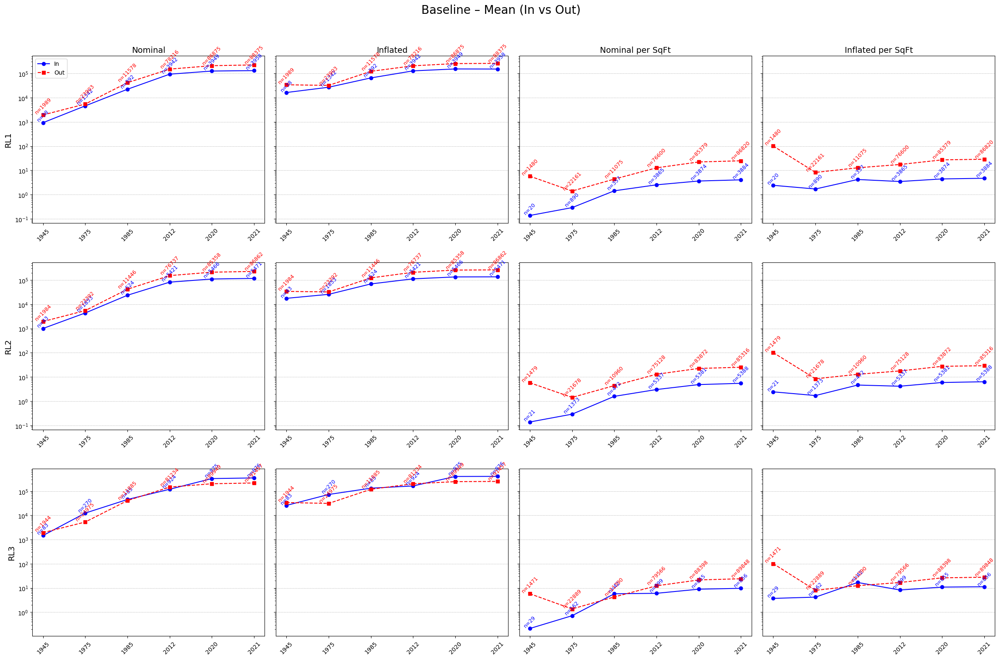

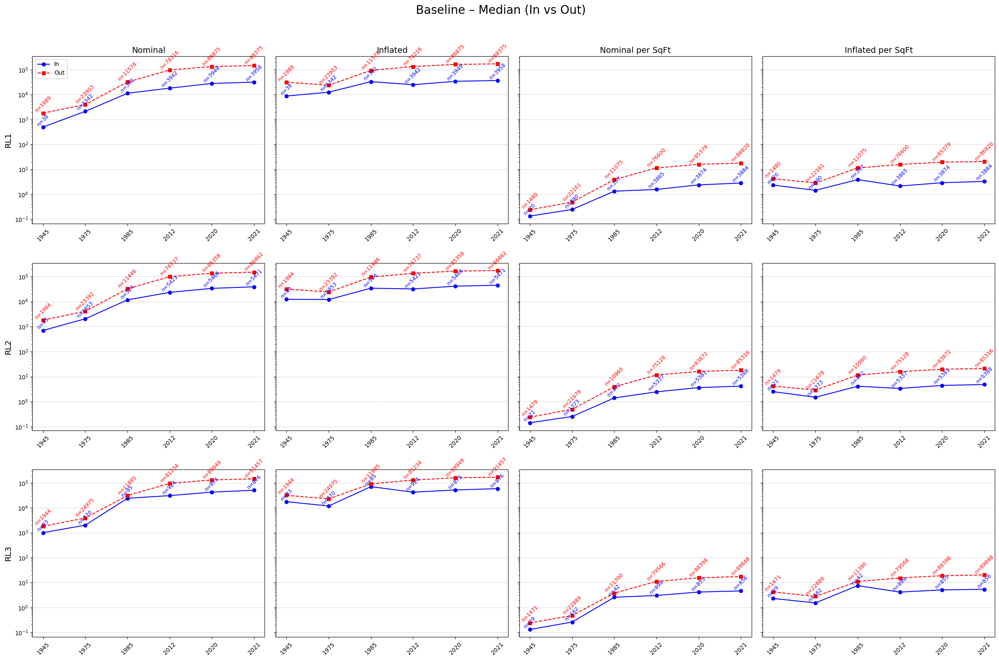

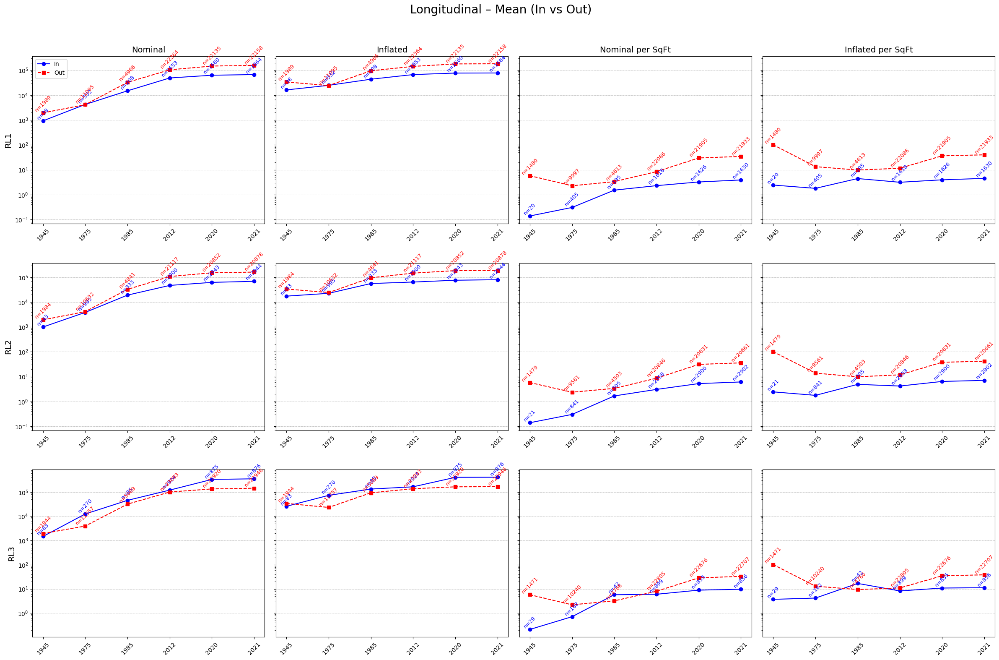

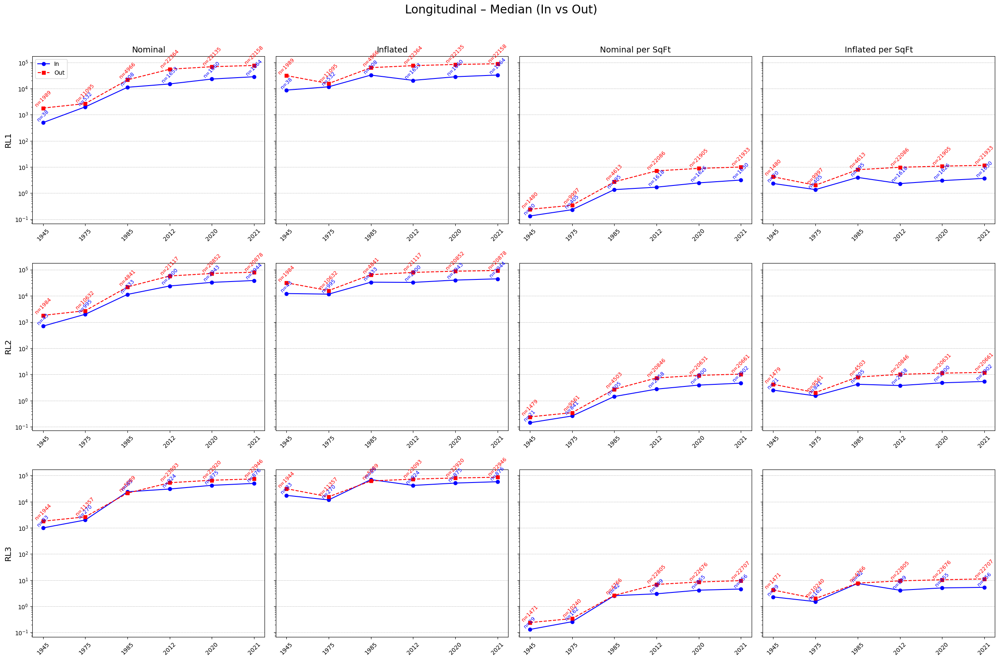

In [ ]:
zones = ['RL1', 'RL2', 'RL3']
years = ['1945', '1975', '1985', '2012', '2020', '2021']  # categorical
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]
vt_labels = {
    'NominalValue': 'Nominal',
    'InflationAdjustedValue': 'Inflated',
    'NominalValue_perSqFt': 'Nominal per SqFt',
    'InflationAdjustedValue_perSqFt': 'Inflated per SqFt'
}

comparisons = ['Baseline', 'Longitudinal']
metrics = ['mean', 'median']

for comparison in comparisons:
    for metric in metrics:
        fig, axes = plt.subplots(len(zones), len(value_types), figsize=(24, 16), sharey='row')
        fig.suptitle(f"{comparison} – {metric.capitalize()} (In vs Out)", fontsize=20)

        for i, zone in enumerate(zones):
            for j, vt in enumerate(value_types):
                ax = axes[i, j]

                df_in = stats_df[
                    (stats_df['Comparison'] == comparison) &
                    (stats_df['ValueType'] == vt) &
                    (stats_df['Zone'] == zone) &
                    (stats_df['Group'] == 'in')
                ].set_index('Year').reindex([int(y) for y in years])

                df_out = stats_df[
                    (stats_df['Comparison'] == comparison) &
                    (stats_df['ValueType'] == vt) &
                    (stats_df['Zone'] == zone) &
                    (stats_df['Group'] == 'out')
                ].set_index('Year').reindex([int(y) for y in years])

                x_pos = range(len(years))

                # Plotting
                ax.plot(x_pos, df_in[metric], marker='o', linestyle='-', color='blue', label='In')
                ax.plot(x_pos, df_out[metric], marker='s', linestyle='--', color='red', label='Out')

                # Label counts (n-values) for clarity
                for x, val, n in zip(x_pos, df_in[metric], df_in['count']):
                    ax.text(x, val, f'n={n}', ha='center', va='bottom', fontsize=9, color='blue', rotation=45)
                for x, val, n in zip(x_pos, df_out[metric], df_out['count']):
                    ax.text(x, val, f'n={n}', ha='center', va='bottom', fontsize=9, color='red', rotation=45)

                # Axes styling
                ax.set_yscale('log')
                ax.set_xticks(x_pos)
                ax.set_xticklabels(years, rotation=45, fontsize=10)
                ax.grid(axis='y', linestyle='--', linewidth=0.5)

                # Titles & labels
                if i == 0:
                    ax.set_title(vt_labels[vt], fontsize=14)
                if j == 0:
                    ax.set_ylabel(zone, fontsize=14)

                # Legend once in top-left plot
                if i == 0 and j == 0:
                    ax.legend(fontsize=10)

        plt.tight_layout(rect=[0, 0, 1, 0.96])
        plt.show()


## TASK 6: Conduct a Separate Analysis Starting from 1975

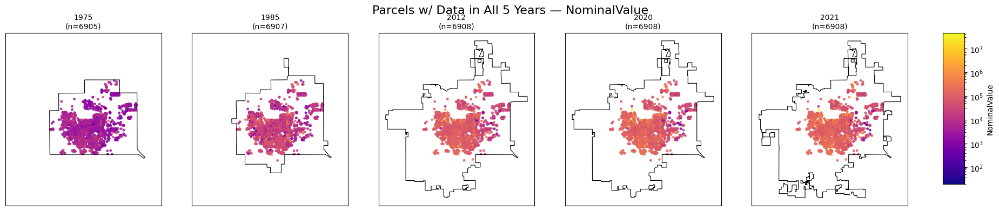

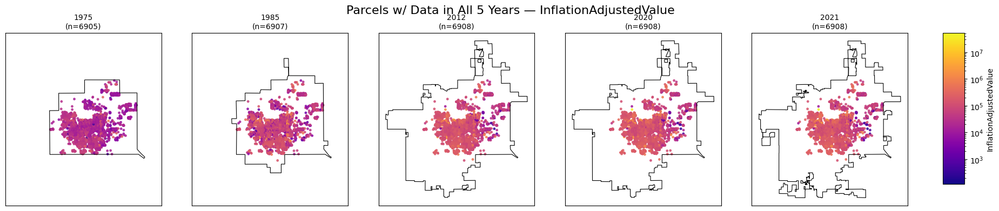

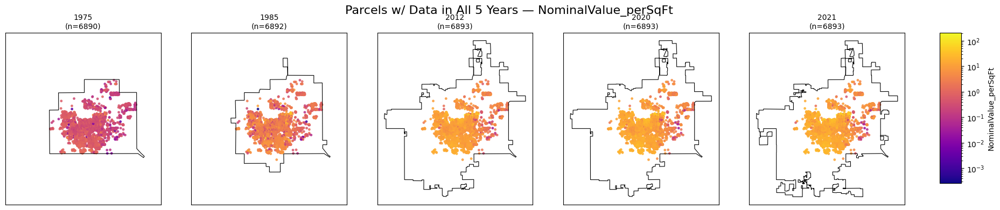

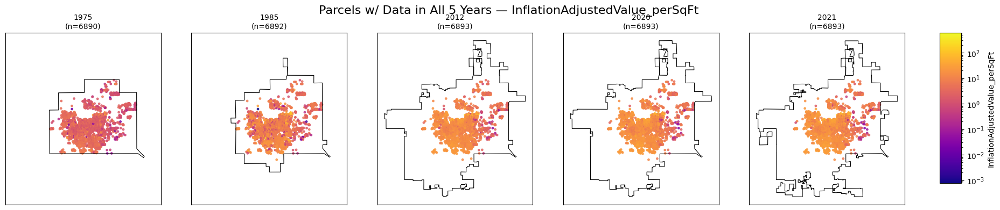

In [ ]:
years5      = [1975, 1985, 2012, 2020, 2021]
gdf_parcels = gdf_parcels      # your GeoDataFrame
city_limits = city_limits      # dict of GeoDataFrames by year

# 1) Map ValueType → column name
value_types = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# 2) Build per‐ValueType “in‐all‐5‐years” joins and compute safe (vmin,vmax)
gdf_in_by_vt = {}
fixed_scales = {}

for vt, col_fn in value_types.items():
    # a) keep only parcels with non-null in every year
    mask = pd.Series(True, index=gdf_parcels.index)
    for yr in years5:
        mask &= gdf_parcels[col_fn(yr)].notna()
    gdf_vt = gdf_parcels.loc[mask]

    # b) spatial‐join into each boundary
    joins = {}
    all_vals = []
    for yr in years5:
        joined = gpd.sjoin(
            gdf_vt, city_limits[yr][['geometry']],
            how='inner', predicate='within'
        )
        joins[yr] = joined

        vals = joined[col_fn(yr)].dropna()
        if len(vals):
            all_vals.append(vals)

    gdf_in_by_vt[vt] = joins

    # c) concatenate and determine a safe positive vmin/vmax
    if all_vals:
        concat = pd.concat(all_vals)
        # ensure vmin > 0
        pos = concat[concat > 0]
        vmin = pos.min() if len(pos) else 1e-6
        vmax = concat.max()
        # if by any chance vmax ≤ vmin, buffer it
        if vmax <= vmin:
            vmax = vmin * 1.1 if vmin > 0 else vmin + 1e-6
    else:
        # fallback if there's literally no data
        vmin, vmax = 1e-6, 1.0

    fixed_scales[vt] = (vmin, vmax)

# 3) Plot 1×5 panels using those safe scales
for vt, col_fn in value_types.items():
    vmin, vmax = fixed_scales[vt]
    norm        = LogNorm(vmin=vmin, vmax=vmax)

    fig, axes = plt.subplots(1, len(years5), figsize=(20, 4),
                             sharex=True, sharey=True)
    fig.suptitle(f"Parcels w/ Data in All 5 Years — {vt}", fontsize=16)

    for ax, yr in zip(axes, years5):
        city_limits[yr].boundary.plot(ax=ax, color='black', linewidth=0.8)
        join_gdf = gdf_in_by_vt[vt][yr]

        if not join_gdf.empty:
            join_gdf.plot(
                ax=ax,
                column=col_fn(yr),
                cmap='plasma',
                norm=norm,
                markersize=6,
                alpha=0.8,
                legend=False
            )
        ax.set_title(f"{yr}\n(n={len(join_gdf)})", fontsize=10)
        ax.set_xticks([]); ax.set_yticks([])

    # shared colorbar
    fig.subplots_adjust(left=0.02, right=0.88, top=0.85,
                        bottom=0.05, wspace=0.02)
    cax = fig.add_axes([0.90, 0.15, 0.02, 0.7])
    sm  = plt.cm.ScalarMappable(cmap='plasma', norm=norm)
    sm.set_array([])
    fig.colorbar(sm, cax=cax, label=vt)

    plt.show()


In [ ]:
# 1) Define the common years for post-1975 analysis
years5 = [1975, 1985, 2012, 2020, 2021]

# 2) Filter for parcels that have ALL "NominalValue" columns non-null
nom_cols = [f"TotalValue_{yr}" for yr in years5]
df5 = df.dropna(subset=nom_cols)
gdf5 = gdf_parcels.loc[df5.index]

# 3) Spatial join: parcels inside each year's boundary
gdf_in5 = {}
for yr, city in city_limits.items():
    if yr in years5:
        gdf_in5[yr] = gpd.sjoin(
            gdf5,
            city[['geometry']],
            how='inner',
            predicate='within'
        )

# 4) Build decile labels and a color palette
decile_labels = [f"{i*10}-{(i+1)*10}%" for i in range(10)]
# you can pick any 10 distinct colors here
colors = [
    '#d7191c','#fdae61','#ffffbf','#a6d96a','#1a9641',
    '#2b83ba','#abdda4','#f46d43','#66c2a5','#3288bd'
]

# 5) Assign decile category for each year's data
for yr in years5:
    col = f"TotalValue_{yr}"
    # qcut on the raw value
    gdf_in5[yr]['decile'] = pd.qcut(
        gdf_in5[yr][col],
        10,
        labels=decile_labels
    )

# 6) Set up a 1×5 Plotly subplot
fig = make_subplots(
    rows=1,
    cols=5,
    subplot_titles=[str(yr) for yr in years5],
    horizontal_spacing=0.02,
    vertical_spacing=0.0
)

# 7) Draw city boundaries and decile‐colored points
for i, yr in enumerate(years5, start=1):
    city = city_limits[yr]
    # draw boundary (handle MultiPolygon)
    for geom in city.geometry:
        if geom.geom_type == 'Polygon':
            xs, ys = geom.exterior.xy
            fig.add_trace(
                go.Scatter(
                    x=list(xs),
                    y=list(ys),
                    mode='lines',
                    line=dict(color='black', width=1),
                    showlegend=False
                ),
                row=1, col=i
            )
        else:
            for poly in geom.geoms:
                xs, ys = poly.exterior.xy
                fig.add_trace(
                    go.Scatter(
                        x=list(xs),
                        y=list(ys),
                        mode='lines',
                        line=dict(color='black', width=1),
                        showlegend=False
                    ),
                    row=1, col=i
                )

    # add one trace per decile
    for j, label in enumerate(decile_labels):
        sel = gdf_in5[yr][gdf_in5[yr]['decile'] == label]
        fig.add_trace(
            go.Scatter(
                x=sel.geometry.x,
                y=sel.geometry.y,
                mode='markers',
                marker=dict(
                    color=colors[j],
                    size=6
                ),
                name=label,
                legendgroup=label,
                showlegend=(i == 1)  # show only in first column
            ),
            row=1,
            col=i
        )

# 8) Create updatemenus: decile toggles + color mode
# Decile dropdown
dec_buttons = []
for lbl in decile_labels:
    visible = [trace.name == lbl for trace in fig.data]
    dec_buttons.append(
        dict(
            label=lbl,
            method="update",
            args=[{"visible": visible}]
        )
    )
# Multi/single color buttons
col_buttons = [
    dict(
        label="Multi-color",
        method="update",
        args=[{}, {"marker.color": [trace.marker.color for trace in fig.data]}]
    ),
    dict(
        label="Single-color",
        method="update",
        args=[{}, {"marker.color": 'red'}]
    )
]

fig.update_layout(
    updatemenus=[
        dict(
            type="dropdown",
            x=0.0,
            y=1.15,
            showactive=True,
            buttons=dec_buttons
        ),
        dict(
            type="buttons",
            x=0.5,
            y=1.15,
            direction="right",
            buttons=col_buttons
        )
    ],
    title_text="NominalValue Decile Maps (1975–2021) with Decile Toggles",
    margin=dict(l=10, r=10, t=60, b=10)
)

# 9) Fix all subplots to the 2021 bounding box
minx, miny, maxx, maxy = city_limits[2021].total_bounds
for col_idx in range(1, 6):
    fig.update_xaxes(range=[minx, maxx], row=1, col=col_idx)
    fig.update_yaxes(range=[miny, maxy], row=1, col=col_idx)

# 10) Export to standalone HTML
fig.write_html(
    "latest_5_years_common_datapoints_viz.html",
    include_plotlyjs="cdn"
)
print("HTML file written: latest_5_years_common_datapoints_viz.html")


HTML file written: latest_5_years_common_datapoints_viz.html


In [ ]:
# Cell Z: Nominal‐Value Decile Facets with Boundaries & Working Toggles

# 1) PARAMETERS
years        = [1945, 1975, 1985, 2012, 2020, 2021]
col_tmpl     = "TotalValue_{}"
decile_labels= [f"{i*10}-{(i+1)*10}%" for i in range(10)]

# 2) PARCELS → GeoDataFrame
gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df.Longitude, df.Latitude),
    crs="EPSG:4326"
)

# 3) LOAD & REPROJECT CITY LIMITS
city_limits = {}
for yr in years:
    path = f'/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/city_limit_{yr}/city_limit_{yr}.shp'
    city_limits[yr] = gpd.read_file(path).to_crs(gdf.crs)

# 4) SPATIAL JOIN → PARCELS INSIDE EACH YEAR
gdf_in = {}
for yr in years:
    gdf_in[yr] = (
        gpd.sjoin(gdf, city_limits[yr][['geometry']],
                  how='inner', predicate='within')
         .reset_index(drop=True)
    )

# 5) COMPUTE DECILES WITH TINY JITTER
records = []
for yr in years:
    ser   = gdf_in[yr][col_tmpl.format(yr)].dropna()
    edges = np.quantile(ser, np.linspace(0,1,11))
    eps   = (edges[-1] - edges[0]) * 1e-9
    edges = edges + np.arange(len(edges)) * eps
    dec   = pd.cut(
        gdf_in[yr][col_tmpl.format(yr)],
        bins=edges,
        labels=decile_labels,
        include_lowest=True
    )
    tmp = pd.DataFrame({
        'x':      gdf_in[yr].geometry.x,
        'y':      gdf_in[yr].geometry.y,
        'year':   yr,
        'decile': dec
    })
    records.append(tmp)
df_plot = pd.concat(records, ignore_index=True)

# 6) MAKE THE FACETED SCATTER
fig = px.scatter(
    df_plot,
    x='x', y='y',
    color='decile',
    category_orders={'decile': decile_labels},
    facet_col='year',
    facet_col_wrap=3,
    title="Nominal Value Deciles by Year",
    width=1800, height=800,
    color_discrete_sequence=px.colors.diverging.RdYlGn
)

# 7) ENSURE ONE LEGEND ITEM PER DECILE
seen = set()
for trace in fig.data:
    if trace.mode == 'markers':
        dec = trace.name
        trace.legendgroup = dec
        trace.showlegend  = dec not in seen
        seen.add(dec)

# 8) OVERLAY THE CITY LIMIT BOUNDARIES
import plotly.graph_objects as go
from shapely.geometry import MultiPolygon

nrows, ncols = 2, 3

for idx, yr in enumerate(years):
    # Plotly’s row=1 is the *bottom* facet, so invert it:
    row = nrows - (idx // ncols)
    col = (idx % ncols) + 1

    bound = city_limits[yr].geometry.union_all()
    parts = bound.geoms if isinstance(bound, MultiPolygon) else [bound]
    for poly in parts:
        xs, ys = poly.exterior.xy
        fig.add_trace(
            go.Scatter(
                x=list(xs),
                y=list(ys),
                mode='lines',
                line=dict(color='black', width=1),
                showlegend=False,
                hoverinfo='skip'
            ),
            row=row,
            col=col
        )


# 9) LOCK ALL PANELS TO 2021 EXTENT
minx, miny, maxx, maxy = city_limits[2021].total_bounds
for ax in fig.layout:
    if ax.startswith('xaxis') or ax.startswith('yaxis'):
        fig.layout[ax].update(
            range=[minx, maxx] if ax.startswith('xaxis') else [miny, maxy]
        )

# 10) FINAL TWEAKS & EXPORT
fig.update_traces(marker=dict(size=4), selector=dict(mode='markers'))
fig.update_layout(
    legend_title_text="Decile (%)",
    margin=dict(t=80, l=20, r=20, b=20)
)

fig.write_html("all_years_percentile_toggle.html", include_plotlyjs="cdn")
print("✅ Saved all_years_percentile_toggle.html")


✅ Saved all_years_percentile_toggle.html


In [ ]:
# Cell X: Compute core-zone vs. outside statistics for Baseline, Longitudinal6 & Longitudinal5

# 1) Define years, zones and value‐type column mappings
years6 = [1945, 1975, 1985, 2012, 2020, 2021]
years5 = [1975, 1985, 2012, 2020, 2021]
core_zones = ['RL1', 'RL2', 'RL3']
value_types = {
    'NominalValue':                   lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue':         lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt':           lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}
stat_names = ['count','min','q25','mean','mode','median','q75','max','std']

# 2) Precompute masks for longitudinal cohorts
mask_value6 = df[[f'TotalValue_{y}' for y in years6]].notna().all(axis=1)
mask_value5 = df[[f'TotalValue_{y}' for y in years5]].notna().all(axis=1)

# 3) Loop over cohorts, years, zones, groups, and value types to compute stats
records = []
for cohort, mask_cohort, cohort_years in [
    ('Baseline',     None,     years6),
    ('Longitudinal6', mask_value6, years6),
    ('Longitudinal5', mask_value5, years5)
]:
    for yr in cohort_years:
        city_flag = f'IsIn_citylimit_{yr}'
        # parcels inside that year's boundary
        base_mask = df[city_flag] == 1
        # if a longitudinal cohort, intersect with its mask
        if mask_cohort is not None:
            base_mask &= mask_cohort

        for zone in core_zones:
            for group in ['in', 'out']:
                # zone‐in vs zone‐out mask
                mask = base_mask & (df[zone] == (1 if group == 'in' else 0))
                subset = df.loc[mask]

                for vt, col_fn in value_types.items():
                    col = col_fn(yr)
                    vals = subset[col].dropna()
                    n = len(vals)
                    if n > 0:
                        stats = {
                            'count': n,
                            'min':   float(vals.min()),
                            'q25':   float(vals.quantile(0.25)),
                            'mean':  float(vals.mean()),
                            'mode':  float(vals.mode().iloc[0]) if not vals.mode().empty else np.nan,
                            'median':float(vals.median()),
                            'q75':   float(vals.quantile(0.75)),
                            'max':   float(vals.max()),
                            'std':   float(vals.std(ddof=1))
                        }
                    else:
                        stats = {sn: np.nan for sn in stat_names}
                        stats['count'] = 0

                    records.append({
                        'Cohort':     cohort,
                        'Year':       yr,
                        'Zone':       zone,
                        'Group':      group,
                        'ValueType':  vt,
                        **stats
                    })

# 4) Assemble into a DataFrame
core_stats_df = pd.DataFrame.from_records(records)

# 5) (Optional) save to CSV or inspect
core_stats_df.to_csv('core_zone_comparison_stats.csv', index=False)

In [ ]:
df_test = df.sample(10000)

In [ ]:
df_test.to_csv('df_test_sample_10000.csv')

In [ ]:
print(f"Generated {core_stats_df.shape[0]} rows × {core_stats_df.shape[1]} columns")
core_stats_df

Generated 408 rows × 14 columns


,Cohort,Year,Zone,Group,ValueType,count,min,q25,mean,mode,median,q75,max,std
0,Baseline,1945,RL1,in,NominalValue,38,20.000000,250.000000,928.157895,400.000000,500.000000,1575.000000,3.000000e+03,8.907023e+02
1,Baseline,1945,RL1,in,InflationAdjustedValue,38,350.600000,4382.500000,16270.607895,7012.000000,8765.000000,27609.750000,5.259000e+04,1.561401e+04
2,Baseline,1945,RL1,in,NominalValue_perSqFt,20,0.004762,0.059249,0.137882,0.257143,0.133333,0.232803,2.857143e-01,9.435870e-02
3,Baseline,1945,RL1,in,InflationAdjustedValue_perSqFt,20,0.083476,1.038636,2.417073,4.507714,2.337333,4.081043,5.008571e+00,1.654108e+00
4,Baseline,1945,RL1,out,NominalValue,1989,10.000000,1300.000000,1939.261438,1800.000000,1800.000000,2200.000000,4.000000e+04,1.942373e+03
5,Baseline,1945,RL1,out,InflationAdjustedValue,1989,175.300000,22789.000000,33995.253007,31554.000000,31554.000000,38566.000000,7.012000e+05,3.404980e+04
6,Baseline,1945,RL1,out,NominalValue_perSqFt,1480,0.001190,0.192890,5.755479,0.214286,0.240000,0.285714,8.125000e+03,2.111927e+02
7,Baseline,1945,RL1,out,InflationAdjustedValue_perSqFt,1480,0.020869,3.381365,100.893543,3.756429,4.207200,5.008571,1.424312e+05,3.702209e+03
8,Baseline,1945,RL2,in,NominalValue,43,20.000000,315.000000,1001.627907,400.000000,700.000000,1700.000000,3.000000e+03,8.876130e+02
9,Baseline,1945,RL2,in,InflationAdjustedValue,43,350.600000,5521.950000,17558.537209,7012.000000,12271.000000,29801.000000,5.259000e+04,1.555986e+04


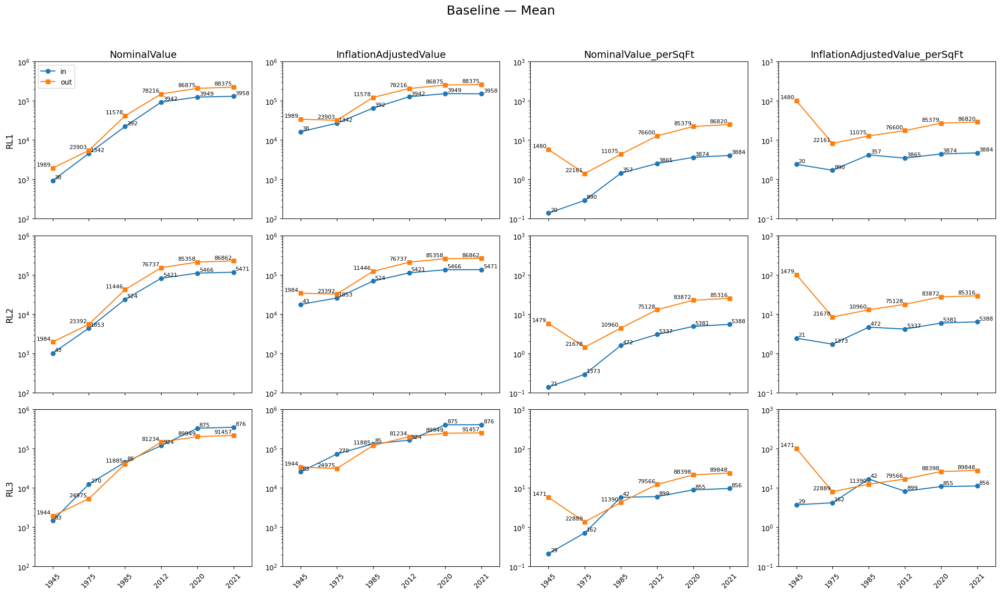

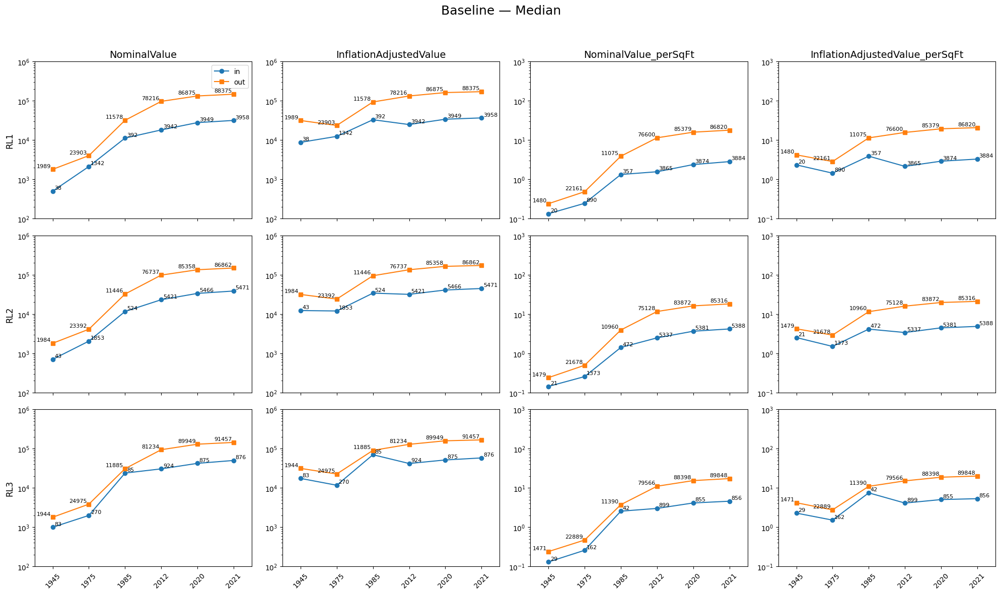

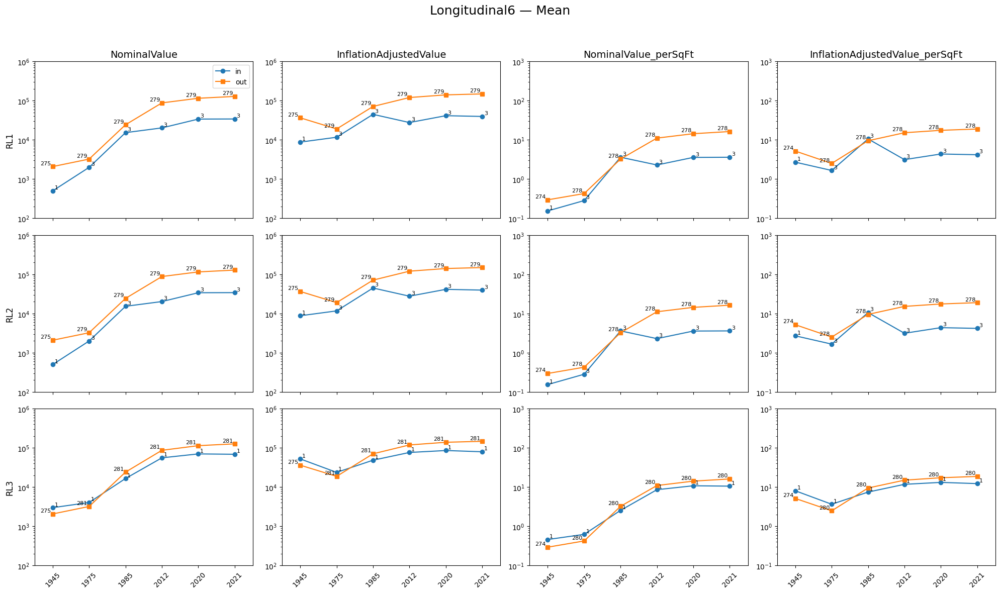

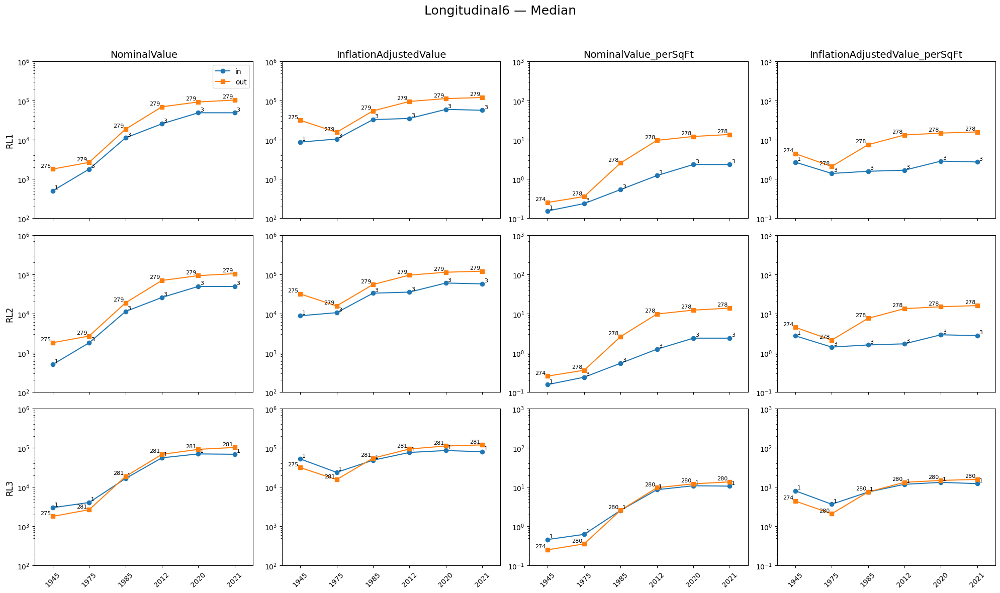

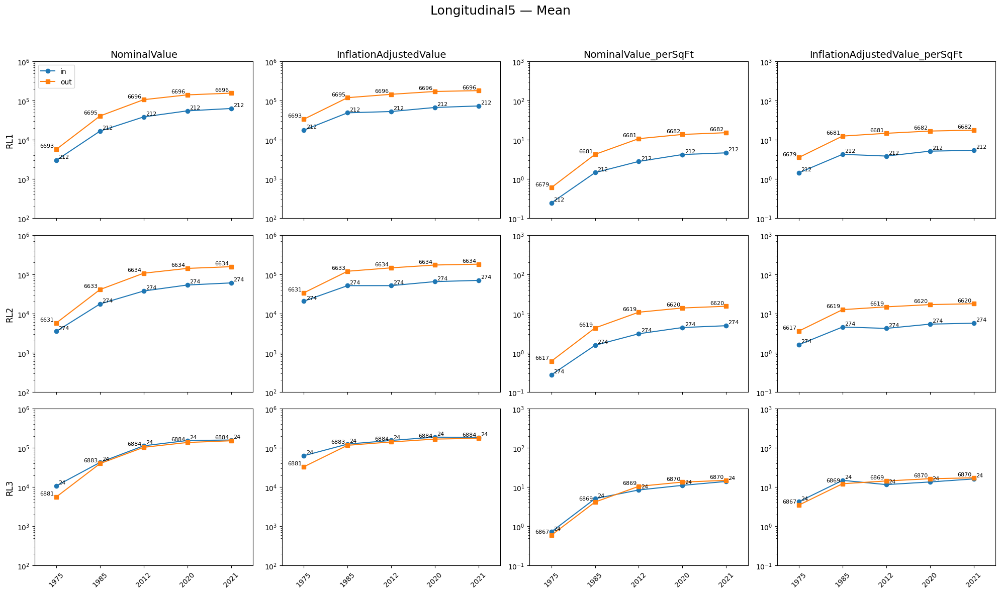

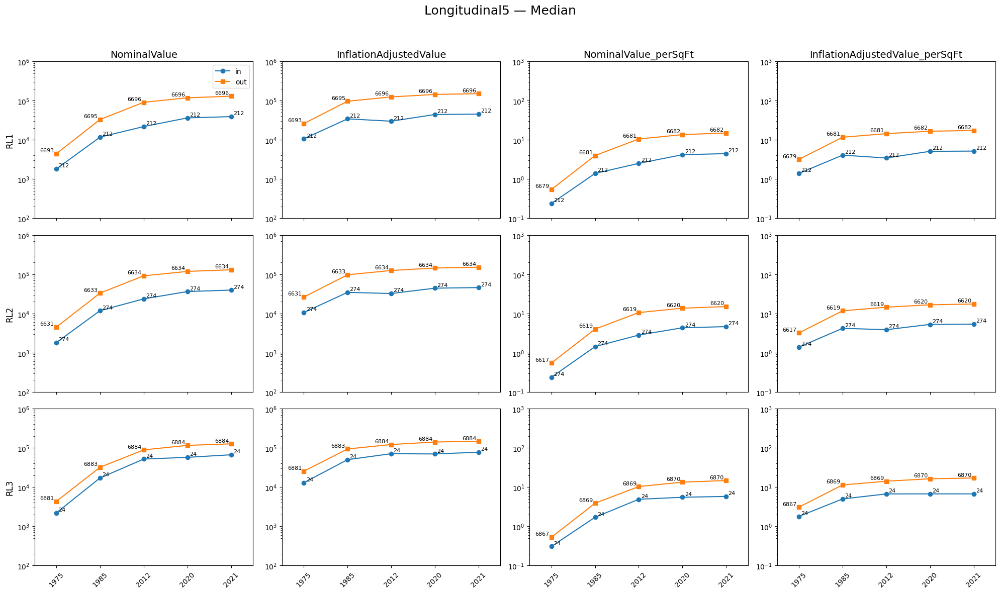

In [ ]:
# 1) settings
cohorts     = ['Baseline', 'Longitudinal6', 'Longitudinal5']
stats       = ['mean', 'median']
zones       = ['RL1','RL2','RL3']
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]
years6      = [1945,1975,1985,2012,2020,2021]
years5      = [1975,1985,2012,2020,2021]
years_map   = {
    'Baseline':      years6,
    'Longitudinal6': years6,
    'Longitudinal5': years5
}

# 2) manual y‐limits per value type
y_limits = {
    'NominalValue':                  (1e2, 1e6),
    'InflationAdjustedValue':        (1e2, 1e6),
    'NominalValue_perSqFt':          (1e-1, 1e3),
    'InflationAdjustedValue_perSqFt':(1e-1, 1e3),
}

# 3) plotting
for cohort in cohorts:
    for stat in stats:
        yrs = years_map[cohort]
        fig, axes = plt.subplots(
            nrows=3, ncols=4,
            figsize=(20,12),
            sharex=True
        )
        # ensure axes is 3×4 array
        axes = np.atleast_2d(axes)

        for ci, zone in enumerate(zones):
            for vi, vt in enumerate(value_types):
                ax = axes[ci][vi]

                # select data
                sel = core_stats_df[
                    (core_stats_df.Cohort == cohort) &
                    (core_stats_df.Zone   == zone)   &
                    (core_stats_df.ValueType == vt)
                ]

                # x positions
                x = np.arange(len(yrs))

                # y values
                y_in  = [ sel[(sel.Group=='in')  & (sel.Year==y)][stat].iat[0] for y in yrs ]
                y_out = [ sel[(sel.Group=='out') & (sel.Year==y)][stat].iat[0] for y in yrs ]

                # counts
                c_in  = [ sel[(sel.Group=='in')  & (sel.Year==y)]['count'].iat[0] for y in yrs ]
                c_out = [ sel[(sel.Group=='out') & (sel.Year==y)]['count'].iat[0] for y in yrs ]

                # plot
                ax.plot(x, y_in,  marker='o', label='in')
                ax.plot(x, y_out, marker='s', label='out')

                # annotate counts
                for xi, yi, ci_count in zip(x, y_in, c_in):
                    ax.text(
                        xi + 0.05, yi * 1.05, str(ci_count),
                        fontsize=8, ha='left',  va='bottom'
                    )
                for xi, yo, co_count in zip(x, y_out, c_out):
                    ax.text(
                        xi - 0.05, yo * 1.05, str(co_count),
                        fontsize=8, ha='right', va='bottom'
                    )

                # axes settings
                ax.set_yscale('log')
                ax.set_ylim(*y_limits[vt])
                ax.set_xlim(-0.5, len(yrs)-0.5)
                ax.set_xticks(x)
                ax.set_xticklabels(yrs, rotation=45)

                # titles & labels
                if ci == 0:
                    ax.set_title(vt, fontsize=14)
                if vi == 0:
                    ax.set_ylabel(zone, fontsize=12)
                if ci == 0 and vi == 0:
                    ax.legend()

        fig.suptitle(f"{cohort} — {stat.capitalize()}", fontsize=18)
        fig.tight_layout(rect=[0,0,1,0.95])
        plt.show()


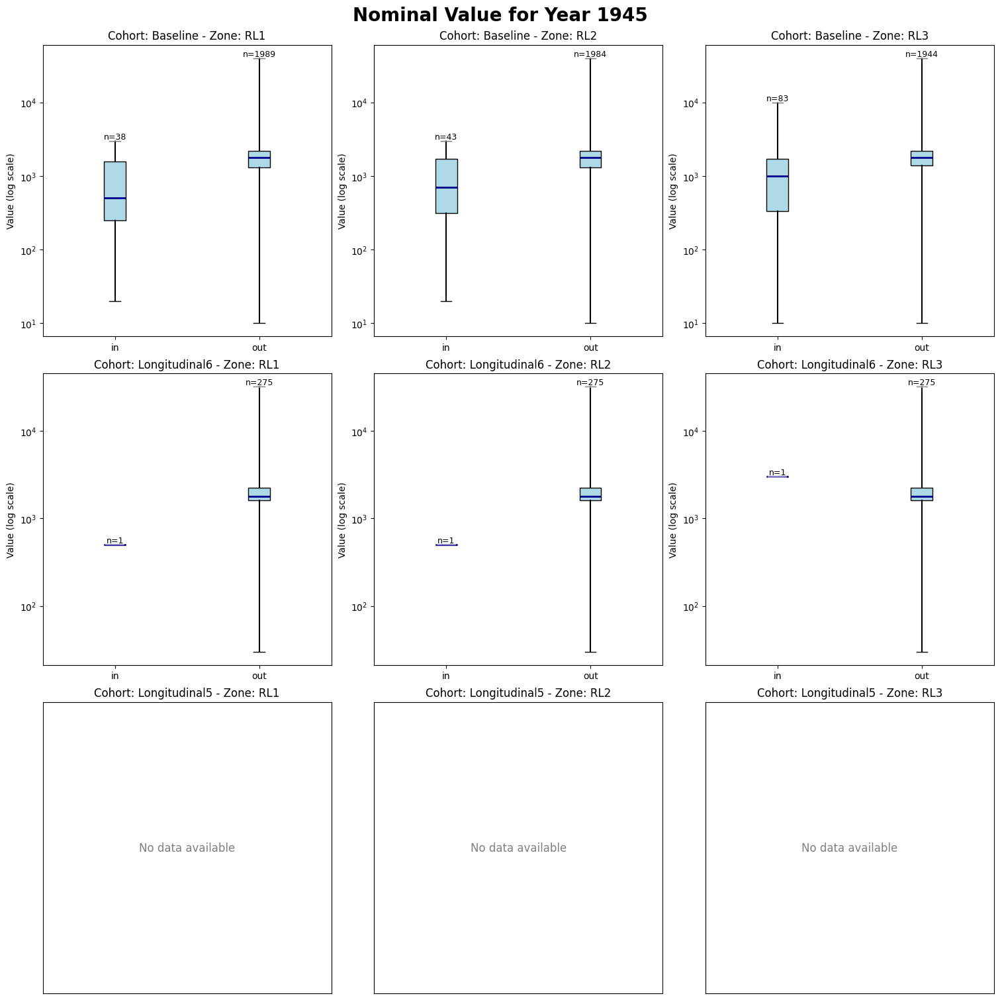

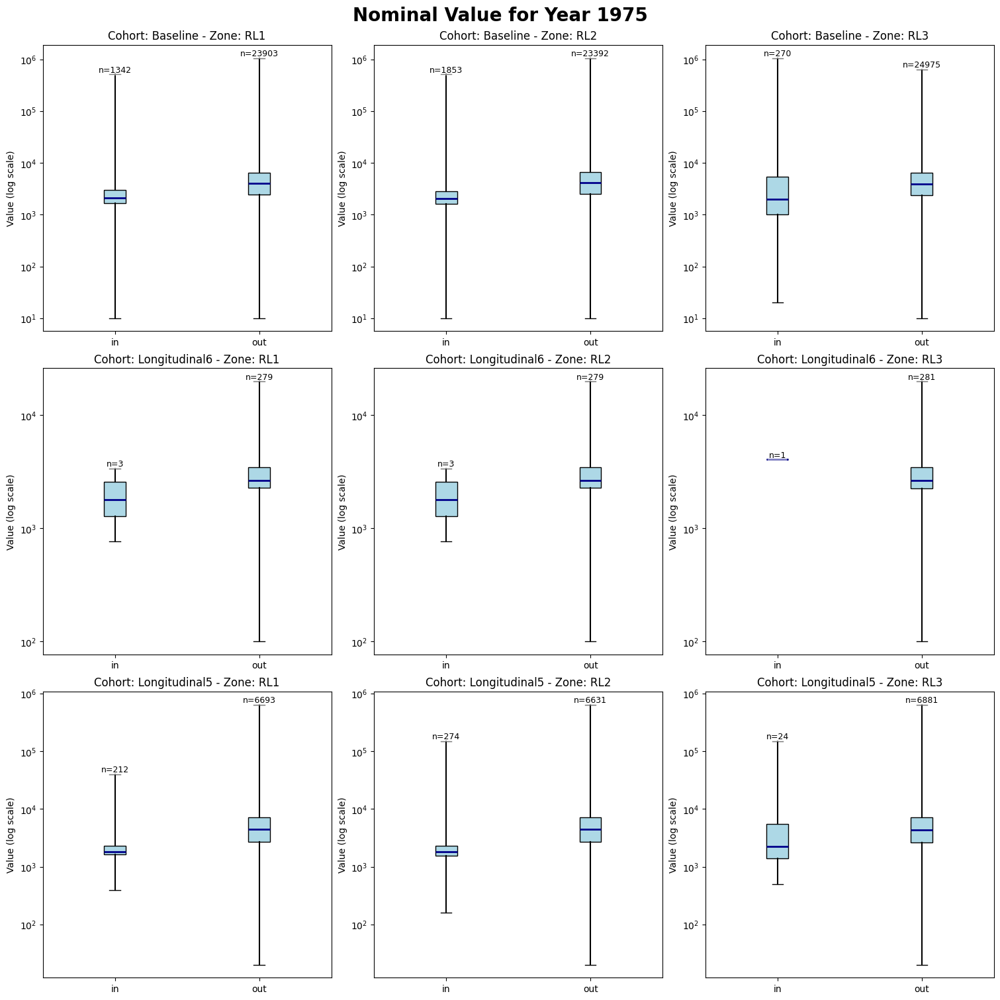

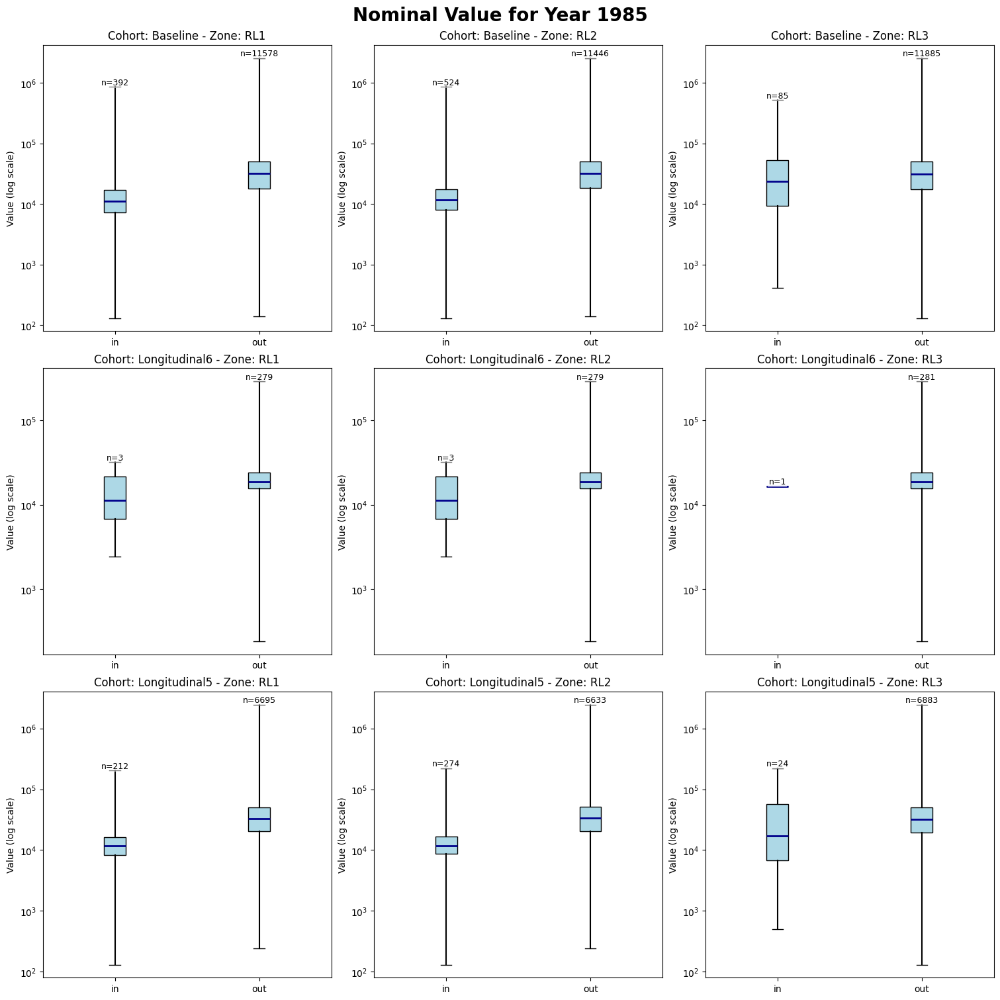

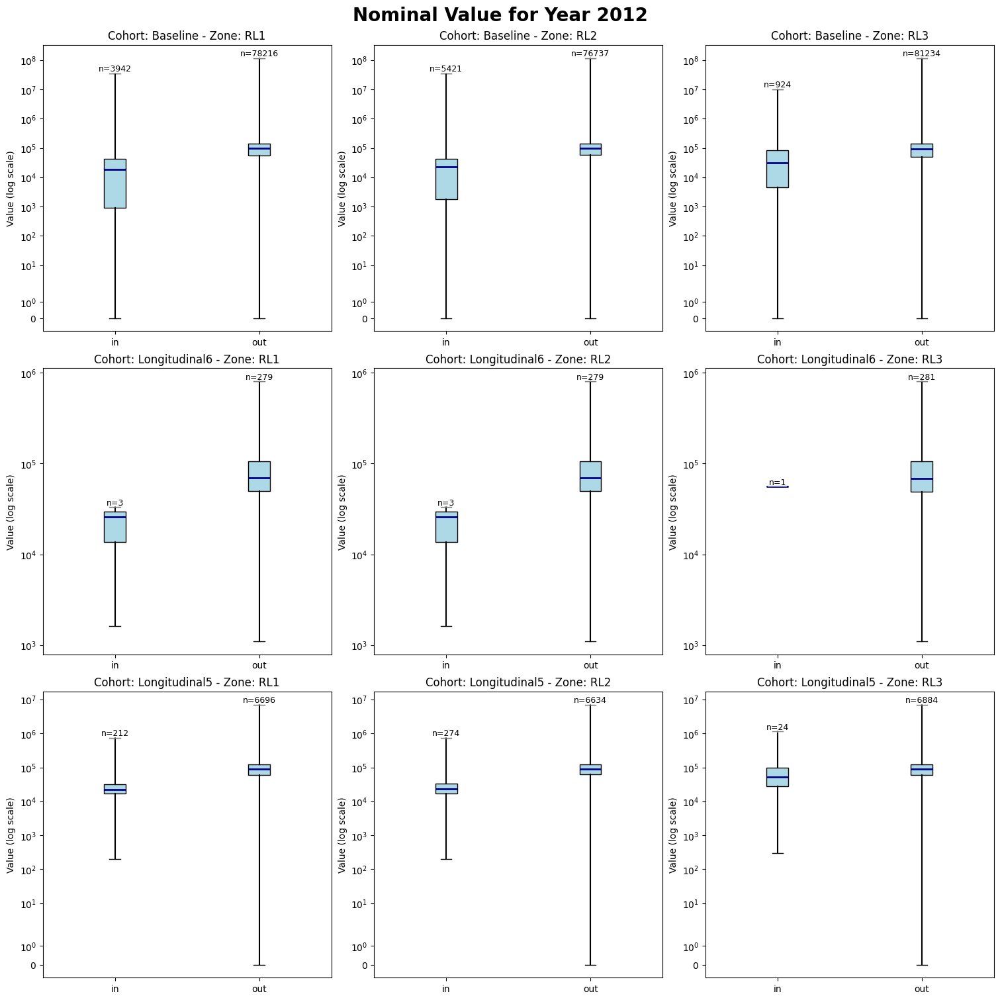

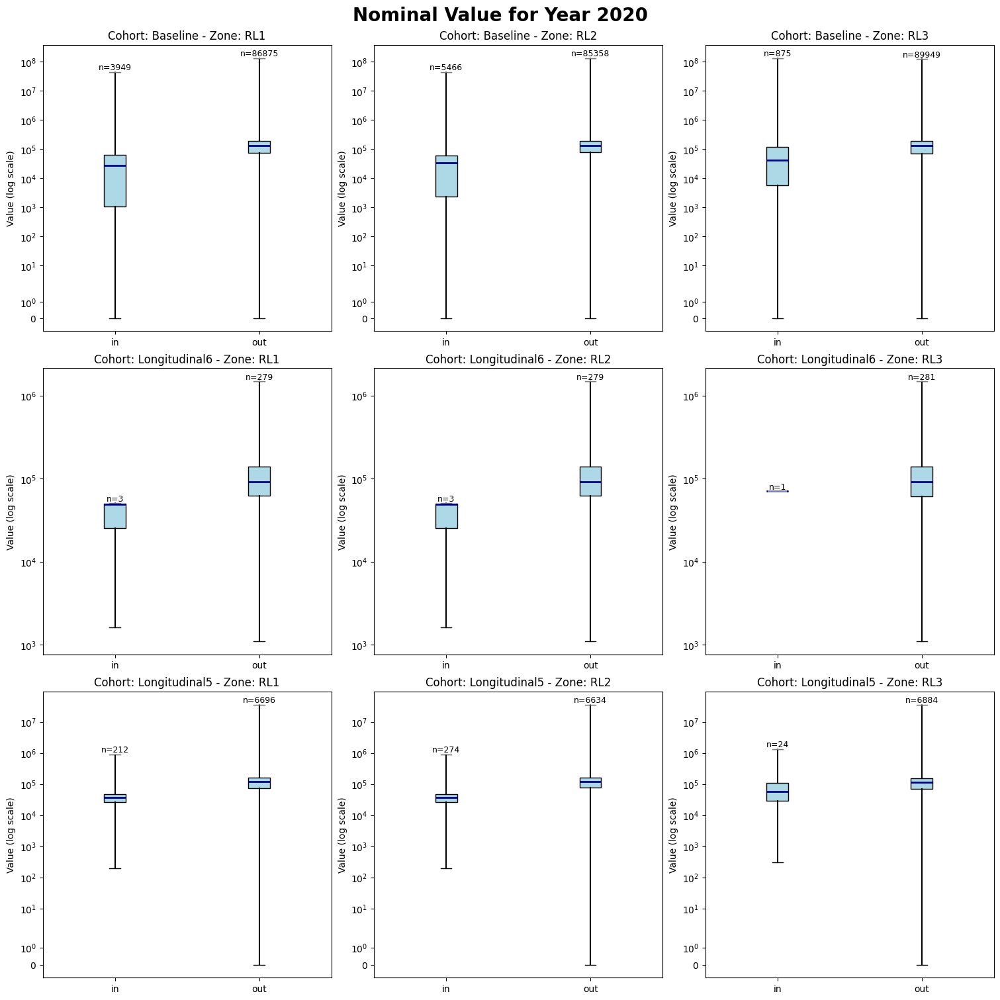

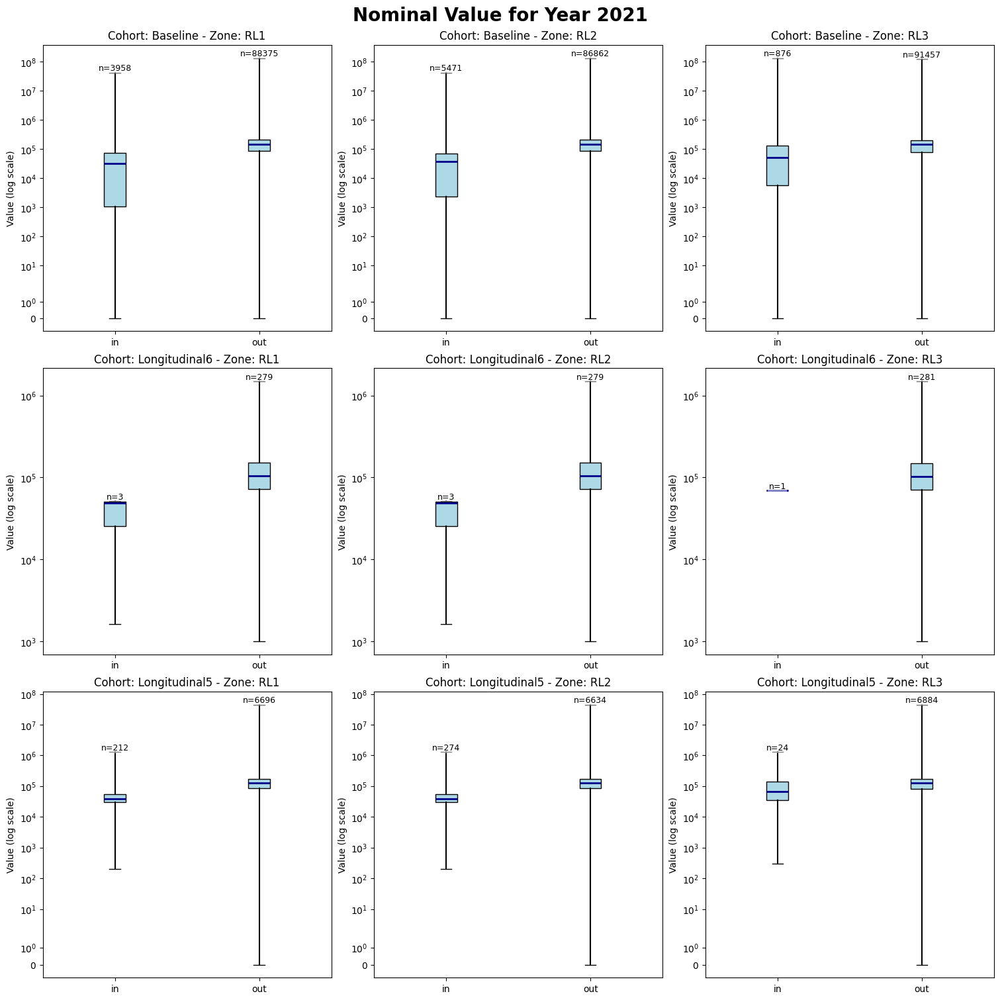

In [ ]:
# Filter the DataFrame to only include 'NominalValue' data.
nominal_df = core_stats_df[core_stats_df['ValueType'] == 'NominalValue'].copy()

# Get the unique years to create a plot for each.
years = sorted(nominal_df['Year'].unique())
cohorts = ['Baseline', 'Longitudinal6', 'Longitudinal5']
zones = ['RL1', 'RL2', 'RL3']

# Generate a plot for each year.
for year in years:
    # Create a 3x3 subplot grid for the current year.
    fig, axes = plt.subplots(3, 3, figsize=(15, 15), constrained_layout=True)
    fig.suptitle(f'Nominal Value for Year {year}', fontsize=20, weight='bold')

    # Iterate through each cohort and zone to create the subplots.
    for i, cohort in enumerate(cohorts):
        for j, zone in enumerate(zones):
            ax = axes[i, j]

            # Set the title for the subplot.
            ax.set_title(f'Cohort: {cohort} - Zone: {zone}', fontsize=12)

            # Filter data for the specific cohort, zone, and year.
            plot_data = nominal_df[
                (nominal_df['Year'] == year) &
                (nominal_df['Cohort'] == cohort) &
                (nominal_df['Zone'] == zone)
            ]

            # If there's no data, display a message on the subplot.
            if plot_data.empty:
                ax.text(0.5, 0.5, 'No data available', ha='center', va='center', fontsize=12, alpha=0.5)
                ax.set_xticks([])
                ax.set_yticks([])
                continue

            # Prepare the stats and counts for the box plot.
            stats_to_plot = []
            labels = []
            counts = []

            for group in ['in', 'out']:
                group_data = plot_data[plot_data['Group'] == group]

                # Check if there is data for the group.
                if not group_data.empty:
                    # Extract the first (and only) row for the group.
                    stats = group_data.iloc[0]

                    # Create the dictionary of statistics for the box plot.
                    stats_to_plot.append({
                        'med': stats['median'],
                        'q1': stats['q25'],
                        'q3': stats['q75'],
                        'whislo': stats['min'],
                        'whishi': stats['max'],
                        'fliers': []  # No individual fliers data available.
                    })
                    labels.append(group)
                    counts.append(stats['count'])

            # If we have stats to plot, create the boxplot and add annotations.
            if stats_to_plot:
                ax.bxp(stats_to_plot, showfliers=False, patch_artist=True,
                       boxprops=dict(facecolor='lightblue', edgecolor='black'),
                       whiskerprops=dict(color='black', linewidth=1.5),
                       medianprops=dict(color='darkblue', linewidth=2))
                ax.set_xticklabels(labels)
                # Use a symmetric log scale for the y-axis to handle zero values.
                ax.set_yscale('symlog')
                ax.set_ylabel('Value (log scale)')

                # Add count annotations above each box plot.
                for idx, (stat, count) in enumerate(zip(stats_to_plot, counts)):
                    # x-position is 1-based index of the box plot.
                    # y-position is the top of the upper whisker.
                    ax.text(idx + 1, stat['whishi'], f'n={int(count)}',
                            ha='center', va='bottom', fontsize=9,
                            bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))
            else:
                # Handle cases where the subplot might be empty for other reasons.
                ax.text(0.5, 0.5, 'No data available', ha='center', va='center', fontsize=12, alpha=0.5)
                ax.set_xticks([])
                ax.set_yticks([])

    # Display the plot for the current year.
    plt.show()


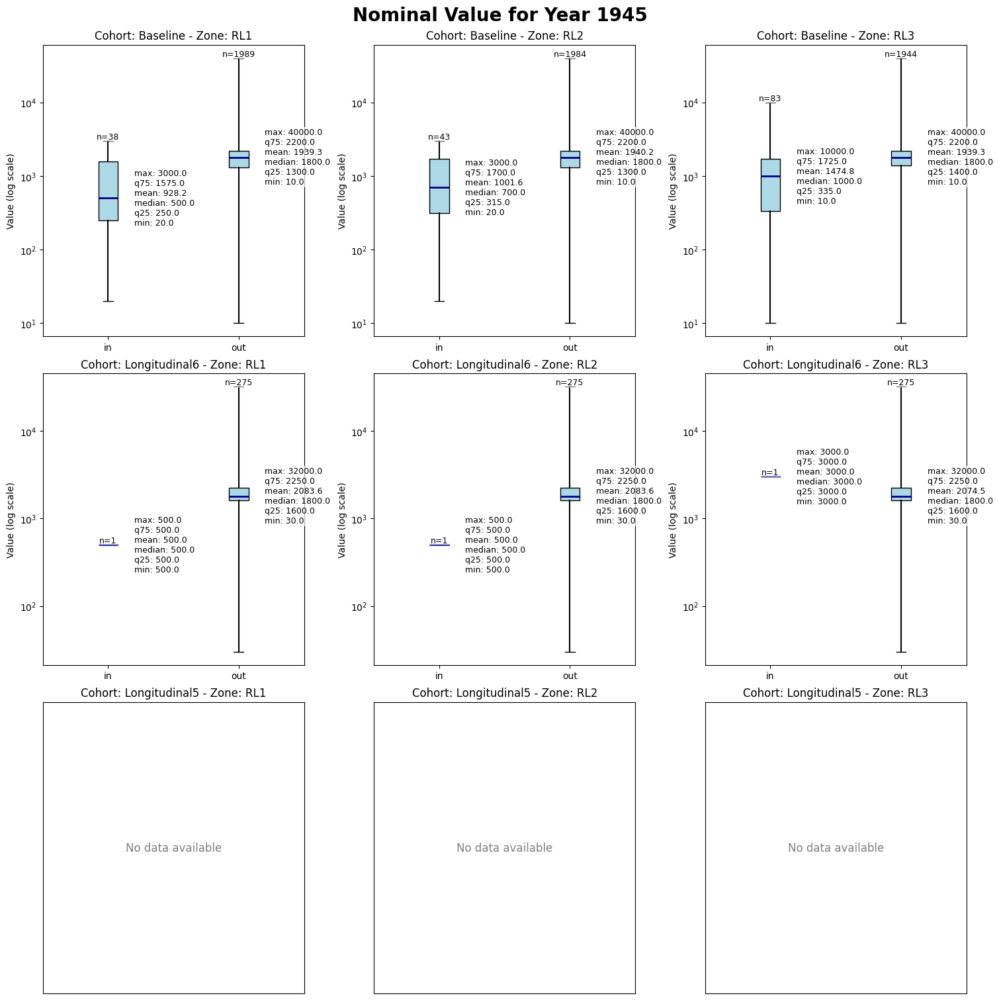

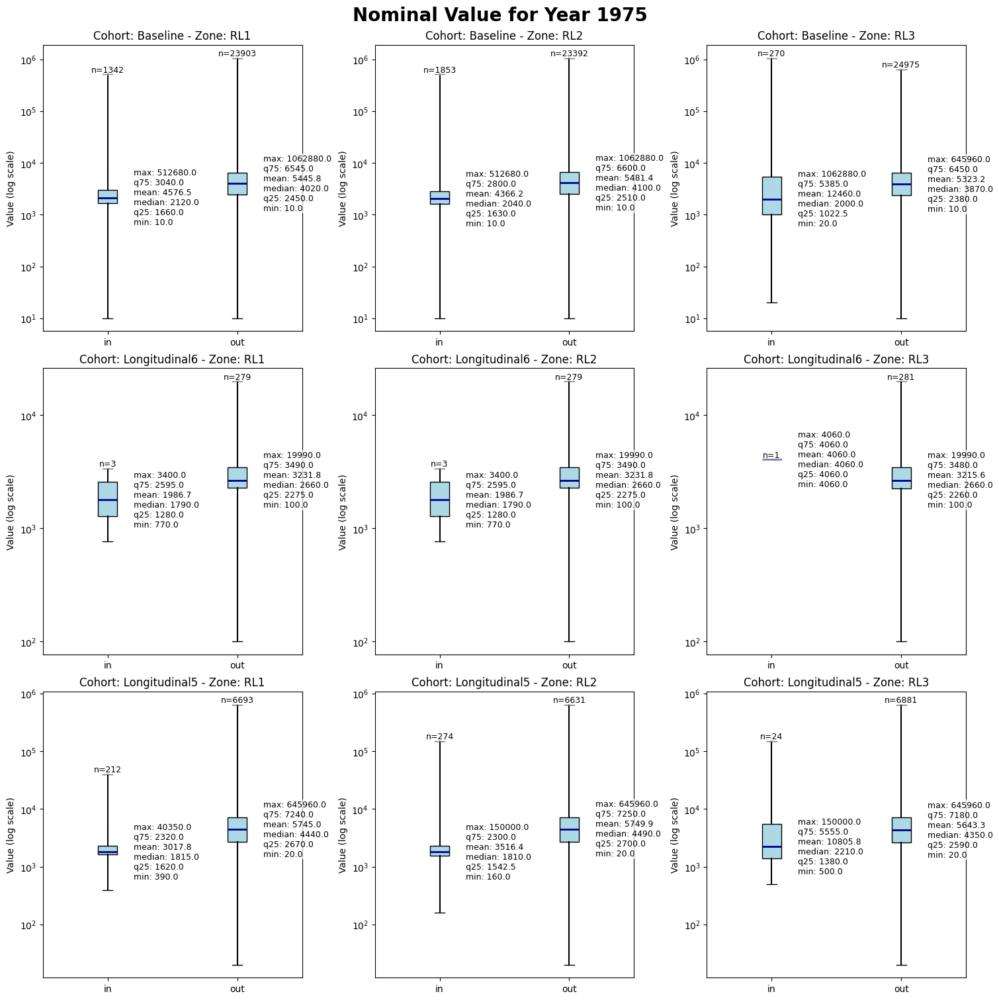

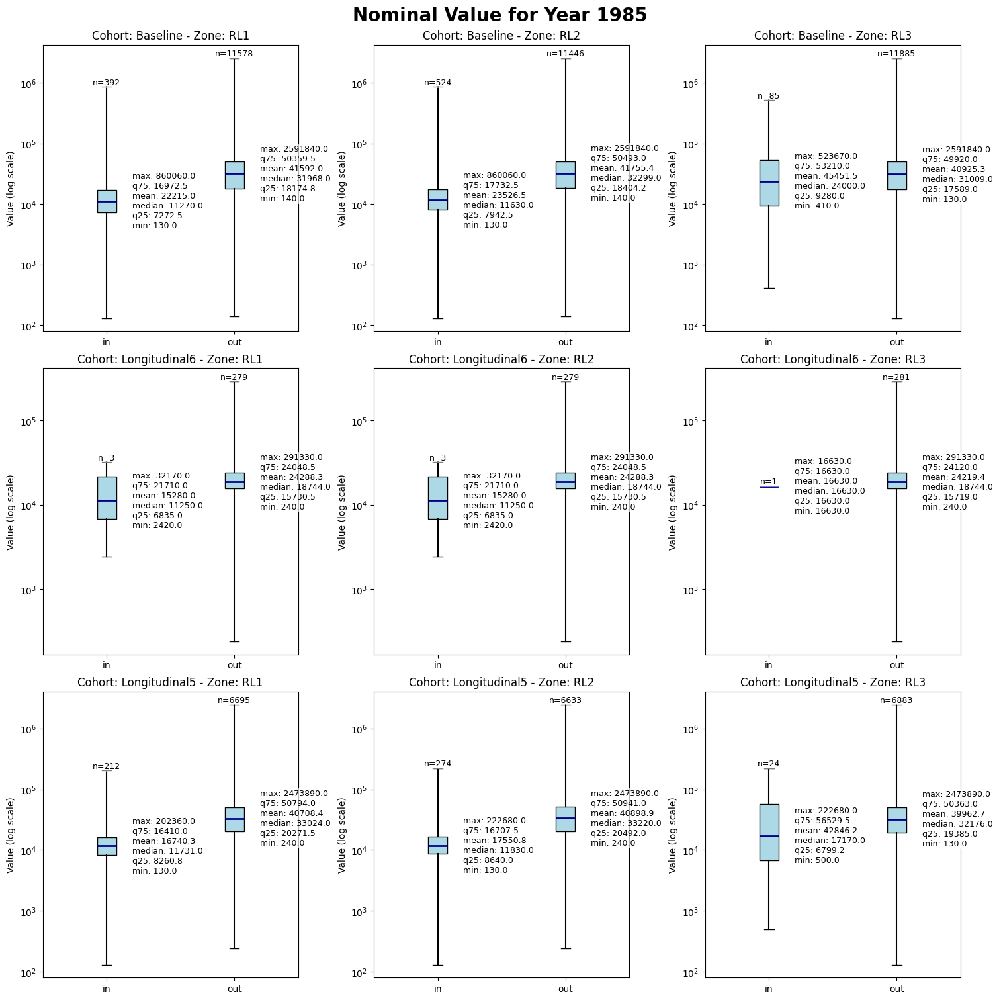

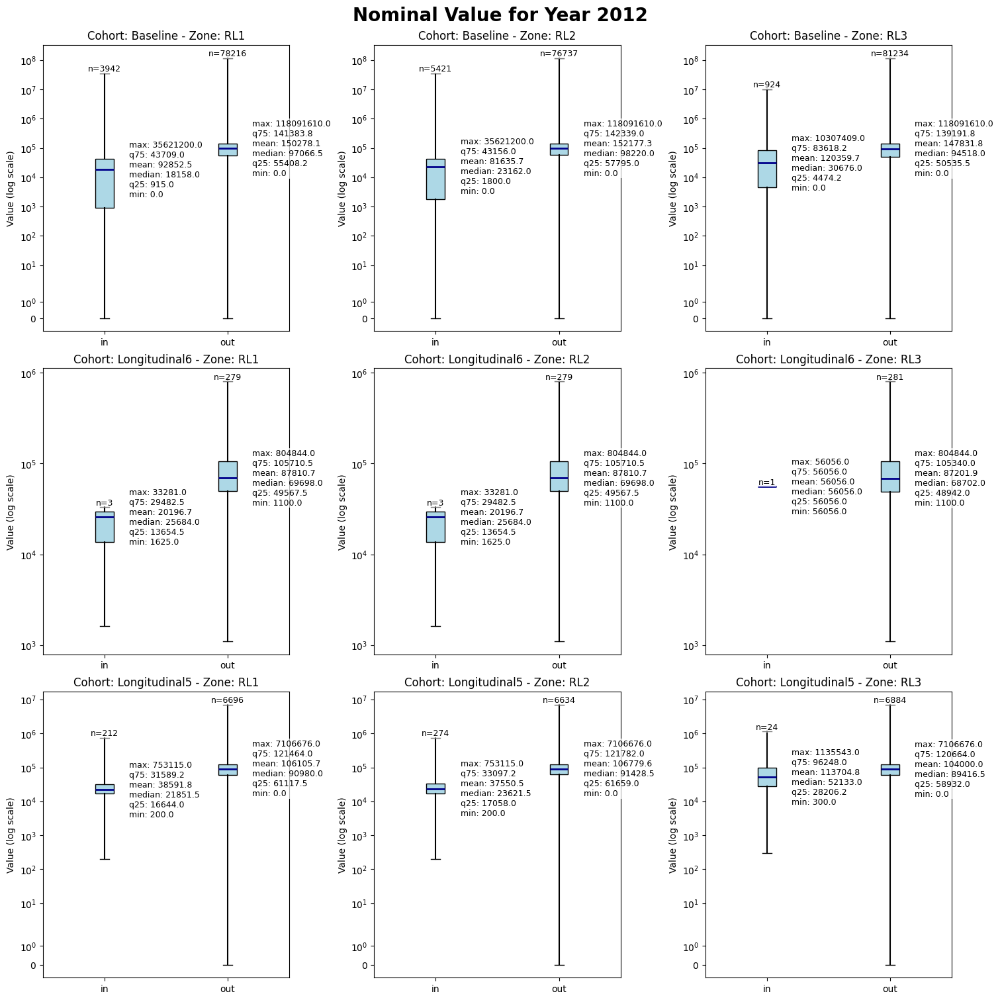

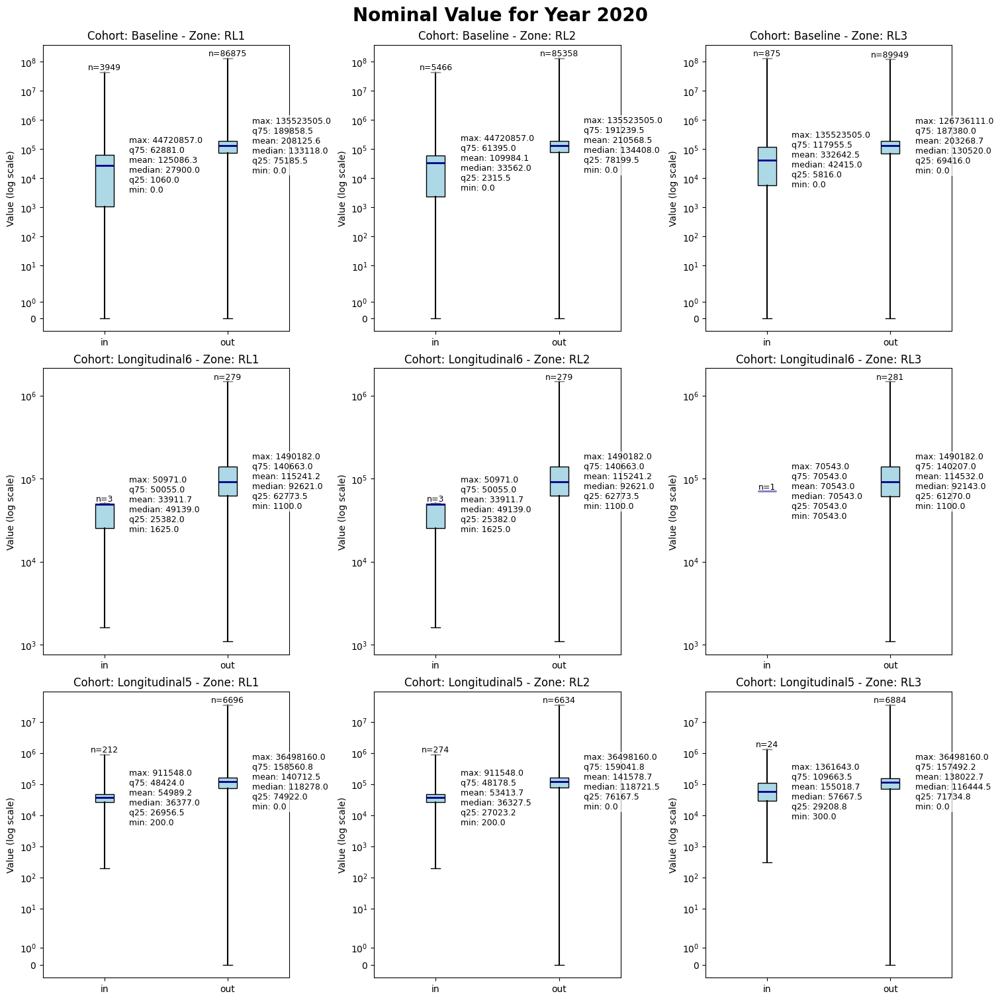

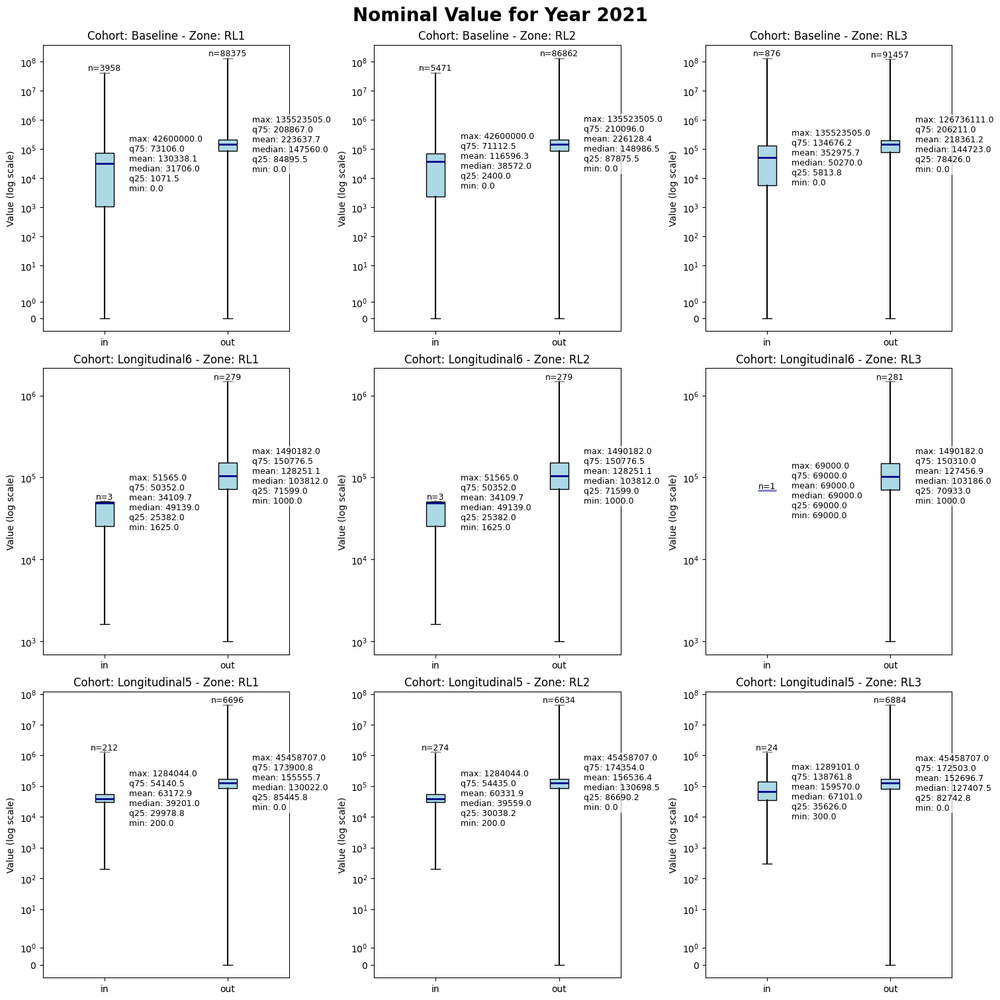

In [ ]:
# Filter the DataFrame to only include 'NominalValue' data.
nominal_df = core_stats_df[core_stats_df['ValueType'] == 'NominalValue'].copy()

# Get the unique years to create a plot for each.
years = sorted(nominal_df['Year'].unique())
cohorts = ['Baseline', 'Longitudinal6', 'Longitudinal5']
zones = ['RL1', 'RL2', 'RL3']

# Generate a plot for each year.
for year in years:
    # Create a 3x3 subplot grid for the current year.
    fig, axes = plt.subplots(3, 3, figsize=(15, 15), constrained_layout=True)
    fig.suptitle(f'Nominal Value for Year {year}', fontsize=20, weight='bold')

    # Iterate through each cohort and zone to create the subplots.
    for i, cohort in enumerate(cohorts):
        for j, zone in enumerate(zones):
            ax = axes[i, j]

            # Set the title for the subplot.
            ax.set_title(f'Cohort: {cohort} - Zone: {zone}', fontsize=12)

            # Filter data for the specific cohort, zone, and year.
            plot_data = nominal_df[
                (nominal_df['Year'] == year) &
                (nominal_df['Cohort'] == cohort) &
                (nominal_df['Zone'] == zone)
            ]

            # If there's no data, display a message on the subplot.
            if plot_data.empty:
                ax.text(0.5, 0.5, 'No data available', ha='center', va='center', fontsize=12, alpha=0.5)
                ax.set_xticks([])
                ax.set_yticks([])
                continue

            # Prepare the stats, counts, and means for the box plot.
            stats_to_plot = []
            labels = []
            counts = []
            means = []

            for group in ['in', 'out']:
                group_data = plot_data[plot_data['Group'] == group]

                # Check if there is data for the group.
                if not group_data.empty:
                    # Extract the first (and only) row for the group.
                    stats = group_data.iloc[0]

                    # Create the dictionary of statistics for the box plot.
                    stats_to_plot.append({
                        'med': stats['median'],
                        'q1': stats['q25'],
                        'q3': stats['q75'],
                        'whislo': stats['min'],
                        'whishi': stats['max'],
                        'fliers': []  # No individual fliers data available.
                    })
                    labels.append(group)
                    counts.append(stats['count'])
                    means.append(stats['mean'])

            # If we have stats to plot, create the boxplot and add annotations.
            if stats_to_plot:
                ax.bxp(stats_to_plot, showfliers=False, patch_artist=True,
                       boxprops=dict(facecolor='lightblue', edgecolor='black'),
                       whiskerprops=dict(color='black', linewidth=1.5),
                       medianprops=dict(color='darkblue', linewidth=2))
                ax.set_xticklabels(labels)
                # Use a symmetric log scale for the y-axis to handle zero values.
                ax.set_yscale('symlog')
                ax.set_ylabel('Value (log scale)')

                # Add count and detailed stats annotations for each box plot.
                for idx, (stat, count, mean_val) in enumerate(zip(stats_to_plot, counts, means)):
                    x_pos = idx + 1

                    # Add count annotation above the upper whisker.
                    ax.text(x_pos, stat['whishi'], f'n={int(count)}',
                            ha='center', va='bottom', fontsize=9,
                            bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))

                    # Create the multi-line string for all statistics.
                    stats_text = (
                        f"max: {stat['whishi']:.1f}\n"
                        f"q75: {stat['q3']:.1f}\n"
                        f"mean: {mean_val:.1f}\n"
                        f"median: {stat['med']:.1f}\n"
                        f"q25: {stat['q1']:.1f}\n"
                        f"min: {stat['whislo']:.1f}"
                    )

                    # Place the detailed stats text block next to the box, vertically centered on the median.
                    ax.text(x_pos + 0.2, stat['med'], stats_text,
                            ha='left', va='center', fontsize=9, # Using a small font size
                            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1))

            else:
                # Handle cases where the subplot might be empty for other reasons.
                ax.text(0.5, 0.5, 'No data available', ha='center', va='center', fontsize=12, alpha=0.5)
                ax.set_xticks([])
                ax.set_yticks([])

    # Display the plot for the current year.
    plt.show()


In [ ]:
# Filter the DataFrame to only include 'NominalValue' data.
nominal_df = core_stats_df[core_stats_df['ValueType'] == 'NominalValue'].copy()

# Get the unique years to create a plot for each.
years = sorted(nominal_df['Year'].unique())
# Updated cohort sequence as per your request.
cohorts = ['Baseline', 'Longitudinal5', 'Longitudinal6']
zones = ['RL1', 'RL2', 'RL3']
groups = ['in', 'out']

# Generate a plot for each year.
for year in years:
    # Create a 3x2 subplot grid for the current year.
    fig, axes = plt.subplots(3, 2, figsize=(18, 22), constrained_layout=True)
    fig.suptitle(f'Nominal Value for Year {year}', fontsize=24, weight='bold')

    # Iterate through each zone and group to create the subplots.
    for i, zone in enumerate(zones):
        for j, group in enumerate(groups):
            ax = axes[i, j]

            # Set the title for the subplot.
            ax.set_title(f'Zone: {zone} - Group: {group}', fontsize=14)

            # Prepare the stats, counts, and means for each cohort.
            stats_to_plot = []
            labels = []
            cohort_stats_list = [] # To hold full stats for annotation

            for cohort in cohorts:
                plot_data = nominal_df[
                    (nominal_df['Year'] == year) &
                    (nominal_df['Cohort'] == cohort) &
                    (nominal_df['Zone'] == zone) &
                    (nominal_df['Group'] == group)
                ]

                # Check if there is data for the cohort.
                if not plot_data.empty:
                    stats = plot_data.iloc[0]

                    # Store the full stats for later annotation.
                    cohort_stats_list.append(stats)
                    labels.append(cohort)

                    # Create the dictionary of statistics for the box plot.
                    stats_to_plot.append({
                        'med': stats['median'],
                        'q1': stats['q25'],
                        'q3': stats['q75'],
                        'whislo': stats['min'],
                        'whishi': stats['max'],
                        'fliers': []  # No individual fliers data available.
                    })

            # If we have stats to plot, create the boxplot and add annotations.
            if stats_to_plot:
                ax.bxp(stats_to_plot, showfliers=False, patch_artist=True,
                       boxprops=dict(facecolor='lightblue', edgecolor='black'),
                       whiskerprops=dict(color='black', linewidth=1.5),
                       medianprops=dict(color='darkblue', linewidth=2))
                ax.set_xticklabels(labels)
                ax.set_yscale('symlog')
                ax.set_ylabel('Value (log scale)')

                # Add count and detailed stats annotations for each box plot.
                for idx, stats_data in enumerate(cohort_stats_list):
                    x_pos = idx + 1

                    # Extract values for annotation
                    count = stats_data['count']
                    whishi = stats_data['max']
                    median = stats_data['median']
                    mean_val = stats_data['mean']
                    q25 = stats_data['q25']
                    q75 = stats_data['q75']
                    min_val = stats_data['min']

                    # Add count annotation.
                    ax.text(x_pos, whishi, f'n={int(count)}',
                            ha='center', va='bottom', fontsize=12, # Fontsize updated to 12
                            bbox=dict(facecolor='white', alpha=0.5, edgecolor='none', pad=1))

                    # Create the multi-line string for all statistics.
                    stats_text = (
                        f"max: {whishi:.1f}\n"
                        f"q75: {q75:.1f}\n"
                        f"mean: {mean_val:.1f}\n"
                        f"median: {median:.1f}\n"
                        f"q25: {q25:.1f}\n"
                        f"min: {min_val:.1f}"
                    )

                    # Place the detailed stats text block next to the box.
                    ax.text(x_pos + 0.15, median, stats_text,
                            ha='left', va='center', fontsize=12, # Fontsize updated to 12
                            bbox=dict(facecolor='white', alpha=0.7, edgecolor='none', pad=1.5))
            else:
                # If there's no data for any cohort in this subplot.
                ax.text(0.5, 0.5, 'No data available', ha='center', va='center', fontsize=12, alpha=0.5)
                ax.set_xticks([])
                ax.set_yticks([])

    # Display the plot for the current year.
    plt.show()

Output hidden; open in https://colab.research.google.com to view.

# JULY 3rd: TASK 1

In [ ]:
from scipy.stats import mannwhitneyu

# Initialize an empty list to store results
mannwhitney_results = []

# Define parameters
years6 = [1945, 1975, 1985, 2012, 2020, 2021]
years5 = [1975, 1985, 2012, 2020, 2021]
core_zones = ['RL1', 'RL2', 'RL3']
value_types = {
    'NominalValue': lambda y: f'TotalValue_{y}',
    'InflationAdjustedValue': lambda y: f'F2025DollarValueTotalValue_{y}',
    'NominalValue_perSqFt': lambda y: f'TotalValue_perSqFt_{y}',
    'InflationAdjustedValue_perSqFt': lambda y: f'F2025DollarValueTotalValue_perSqFt_{y}'
}

# Precompute masks for longitudinal cohorts
mask_value6 = df[[f'TotalValue_{y}' for y in years6]].notna().all(axis=1)
mask_value5 = df[[f'TotalValue_{y}' for y in years5]].notna().all(axis=1)

# Loop over cohorts, years, zones, and value types
for cohort, mask_cohort, cohort_years in [
    ('Baseline', None, years6),
    ('Longitudinal6', mask_value6, years6),
    ('Longitudinal5', mask_value5, years5)
]:
    for yr in cohort_years:
        city_flag = f'IsIn_citylimit_{yr}'
        base_mask = df[city_flag] == 1
        if mask_cohort is not None:
            base_mask &= mask_cohort
        for zone in core_zones:
            mask_in = base_mask & (df[zone] == 1)  # "in" group: inside the zone
            subset_in = df.loc[mask_in]
            mask_out = base_mask & (df[zone] == 0)  # "out" group: outside the zone
            subset_out = df.loc[mask_out]
            for vt, col_fn in value_types.items():
                col = col_fn(yr)
                in_data = subset_in[col].dropna()
                out_data = subset_out[col].dropna()
                if len(in_data) > 0 and len(out_data) > 0:
                    u_stat, p_value = mannwhitneyu(in_data, out_data, alternative='two-sided')
                    result = {
                        'Cohort': cohort,
                        'Zone': zone,
                        'ValueType': vt,
                        'Year': yr,
                        'U_statistic': u_stat,
                        'P_value': p_value,
                        'Mean_in': in_data.mean(),
                        'Median_in': in_data.median(),
                        'Mean_out': out_data.mean(),
                        'Median_out': out_data.median(),
                        'Count_in': len(in_data),
                        'Count_out': len(out_data)
                    }
                    mannwhitney_results.append(result)

# Convert list of results to DataFrame
mannwhitney_results = pd.DataFrame(mannwhitney_results)

print(mannwhitney_results)

            Cohort Zone                       ValueType  Year  U_statistic        P_value        Mean_in     Median_in       Mean_out     Median_out  Count_in  Count_out
0         Baseline  RL1                    NominalValue  1945      18436.5   5.752377e-08     928.157895    500.000000    1939.261438    1800.000000        38       1989
1         Baseline  RL1          InflationAdjustedValue  1945      18436.5   5.752377e-08   16270.607895   8765.000000   33995.253007   31554.000000        38       1989
2         Baseline  RL1            NominalValue_perSqFt  1945       7196.0   7.755435e-05       0.137882      0.133333       5.755479       0.240000        20       1480
3         Baseline  RL1  InflationAdjustedValue_perSqFt  1945       7196.5   7.763961e-05       2.417073      2.337333     100.893543       4.207200        20       1480
4         Baseline  RL2                    NominalValue  1945      22656.0   1.306921e-07    1001.627907    700.000000    1940.217238    1800.000000  

In [ ]:
mannwhitney_results.to_csv('t_test_results.csv')

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

# 1) Settings
cohorts = ['Baseline', 'Longitudinal6', 'Longitudinal5']
stats = ['mean', 'median']
zones = ['RL1', 'RL2', 'RL3']
value_types = [
    'NominalValue',
    'InflationAdjustedValue',
    'NominalValue_perSqFt',
    'InflationAdjustedValue_perSqFt'
]
years6 = [1945, 1975, 1985, 2012, 2020, 2021]
years5 = [1975, 1985, 2012, 2020, 2021]
years_map = {
    'Baseline': years6,
    'Longitudinal6': years6,
    'Longitudinal5': years5
}

# 2) Manual y-limits per value type
y_limits = {
    'NominalValue': (1e2, 1e6),
    'InflationAdjustedValue': (1e2, 1e6),
    'NominalValue_perSqFt': (1e-1, 1e3),
    'InflationAdjustedValue_perSqFt': (1e-1, 1e3),
}

# 3) Plotting
for cohort in cohorts:
    for stat in stats:
        yrs = years_map[cohort]
        fig, axes = plt.subplots(
            nrows=3, ncols=4,
            figsize=(20, 12),
            sharex=True
        )
        # Ensure axes is 3×4 array
        axes = np.atleast_2d(axes)

        for ci, zone in enumerate(zones):
            for vi, vt in enumerate(value_types):
                ax = axes[ci][vi]

                # Select data from core_stats_df
                sel = core_stats_df[
                    (core_stats_df.Cohort == cohort) &
                    (core_stats_df.Zone == zone) &
                    (core_stats_df.ValueType == vt)
                ]

                # X positions
                x = np.arange(len(yrs))

                # Y values
                y_in = [sel[(sel.Group == 'in') & (sel.Year == y)][stat].iat[0] for y in yrs]
                y_out = [sel[(sel.Group == 'out') & (sel.Year == y)][stat].iat[0] for y in yrs]

                # Counts
                c_in = [sel[(sel.Group == 'in') & (sel.Year == y)]['count'].iat[0] for y in yrs]
                c_out = [sel[(sel.Group == 'out') & (sel.Year == y)]['count'].iat[0] for y in yrs]

                # Plot
                ax.plot(x, y_in, marker='o', label='in')
                ax.plot(x, y_out, marker='s', label='out')

                # Annotate counts
                for xi, yi, ci_count in zip(x, y_in, c_in):
                    ax.text(xi + 0.05, yi * 1.05, str(ci_count), fontsize=8, ha='left', va='bottom')
                for xi, yo, co_count in zip(x, y_out, c_out):
                    ax.text(xi - 0.05, yo * 1.05, str(co_count), fontsize=8, ha='right', va='bottom')

                # Get p-values from mannwhitney_results
                p_values = []
                for yr in yrs:
                    p_val = mannwhitney_results[
                        (mannwhitney_results['Cohort'] == cohort) &
                        (mannwhitney_results['Zone'] == zone) &
                        (mannwhitney_results['ValueType'] == vt) &
                        (mannwhitney_results['Year'] == yr)
                    ]['P_value'].values
                    p_values.append(p_val[0] if len(p_val) > 0 else np.nan)

                # Add vertical dashed lines with p-value and short significance category at the top
                for xi, yr, p_val in zip(x, yrs, p_values):
                    if not np.isnan(p_val):
                        ax.axvline(x=xi, color='gray', linestyle='--', alpha=0.5)
                        significance = (
                            'VS' if p_val < 0.001 else # Very Significant
                            'S' if p_val < 0.05 else # Significant
                            'B' if p_val < 0.1 else # Borderline
                            'VI' # Very Insignificant
                        )
                        p_text = f'p={p_val:.2e}\n({significance})'
                        # Place text at the top edge, slightly above the upper y-limit
                        ax.text(xi, ax.get_ylim()[1] * 1.05, p_text, rotation=60, va='bottom', ha='center', fontsize=7)

                # Axes settings
                ax.set_yscale('log')
                ax.set_ylim(*y_limits[vt])
                ax.set_xlim(-0.5, len(yrs) - 0.5)
                ax.set_xticks(x)
                ax.set_xticklabels(yrs, rotation=45)

                # Titles & labels
                if ci == 0:
                    ax.set_title(vt, fontsize=14)
                if vi == 0:
                    ax.set_ylabel(zone, fontsize=12)
                if ci == 0 and vi == 0:
                    ax.legend()

        fig.suptitle(f"{cohort} — {stat.capitalize()}", fontsize=18)
        fig.tight_layout(rect=[0, 0, 1, 0.95])
        plt.show()

Output hidden; open in https://colab.research.google.com to view.

# JULY 3rd: TASK 4

RL1 CRS: COMPD_CS["NAD83 / Texas North Central (ftUS) + NAVD88 height",PROJCS["NAD83 / Texas North Central (ftUS)",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",31.6666666666667],PARAMETER["central_meridian",-98.5],PARAMETER["standard_parallel_1",32.1333333333333],PARAMETER["standard_parallel_2",33.9666666666667],PARAMETER["false_easting",1968500],PARAMETER["false_northing",6561666.66666667],UNIT["US survey foot",0.304800609601219,AUTHORITY["EPSG","9003"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]],VERT_CS["NAVD88 height",VERT_DATUM["North American Vertical Datum 1988",2005],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Gravity-related height",UP]]]
RL2 CRS: COMPD_CS["NAD83 / Texas North Central (ftUS) + NAVD88 height",PROJCS["NAD83 / Texas North Central (ftUS

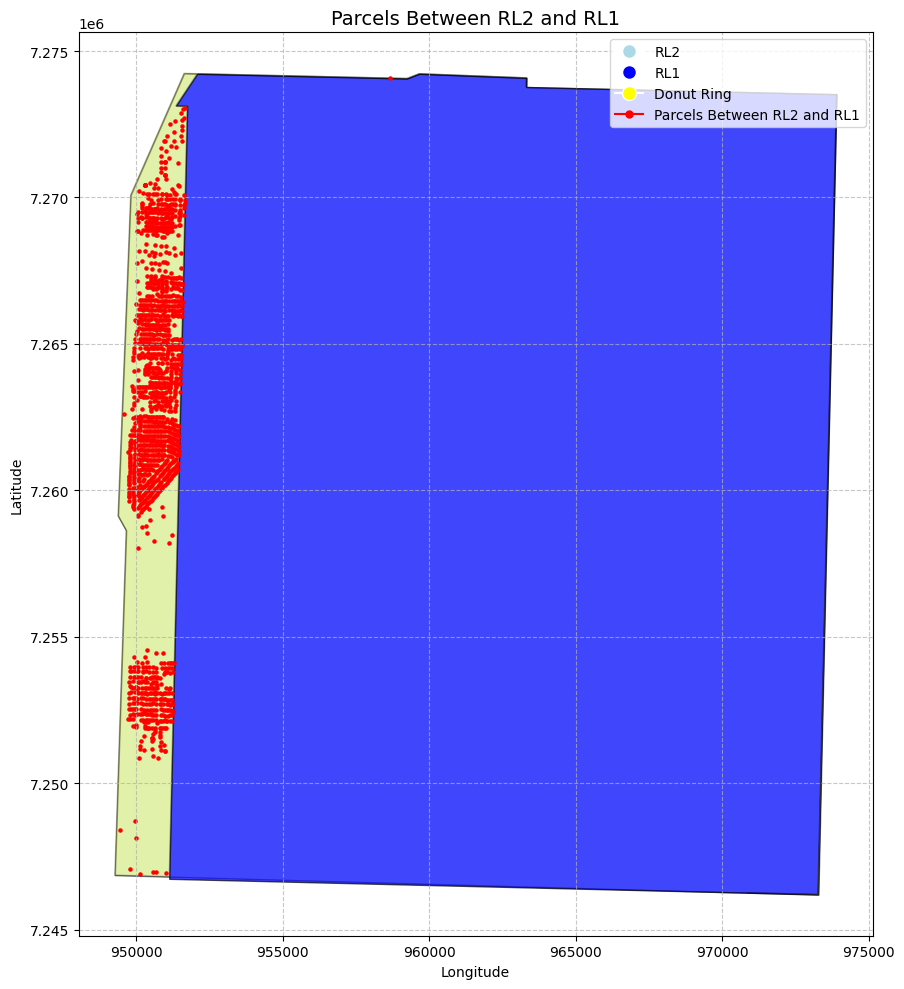


First few rows of df_parcels_rl1_rl2_corridor:
                                      Address  ZipCode   Latitude   Longitude  ValueOfCityProperty_1945  ValueOfPersonalProperty_1945  TotalValue_1945  F2025DollarValueTotalValue_1945  \
16640     405 19th St, Lubbock, TX 79401, USA    79401  33.577614 -101.839164                       NaN                           NaN              NaN                              NaN   
16738  1912 E 16th St, Lubbock, TX 79403, USA    79403  33.580996 -101.816355                       NaN                           NaN              NaN                              NaN   
23671       4207 I-27, Lubbock, TX 79403, USA    79403  33.555395 -101.843931                       NaN                           NaN              NaN                              NaN   
25776   1957 Avenue G, Lubbock, TX 79404, USA    79404  33.570256 -101.843351                       NaN                        2500.0           2500.0                          43825.0   
25777   1958 Aven

In [ ]:
# Load the polygon shapefiles
rl1_polygons = gpd.read_file('/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/RL1/RL1.shp')
rl2_polygons = gpd.read_file('/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/RL2/RL2.shp')

# Print CRS and bounds for debugging
print("RL1 CRS:", rl1_polygons.crs)
print("RL2 CRS:", rl2_polygons.crs)
print("RL1 Bounds:", rl1_polygons.total_bounds)
print("RL2 Bounds:", rl2_polygons.total_bounds)
print("RL1 Geometry Count:", len(rl1_polygons))
print("RL2 Geometry Count:", len(rl2_polygons))

# Create a GeoDataFrame from df
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Set and reproject CRS
gdf.crs = 'EPSG:4326'
if gdf.crs != rl1_polygons.crs:
    gdf = gdf.to_crs(rl1_polygons.crs)
    print("Reprojected gdf to match shapefile CRS:", gdf.crs)

# Compute the donut ring (difference between RL2 and RL1)
donut_ring = gpd.overlay(rl2_polygons, rl1_polygons, how='difference')

# Spatial join to find parcels within the donut ring
gdf_donut = gpd.sjoin(gdf, donut_ring, how='inner', predicate='intersects')
df_parcels_rl1_rl2_corridor = gdf_donut.drop(columns=['index_right']).copy()

# Verify the selection
print(f"Number of parcels between RL2 and RL1: {len(df_parcels_rl1_rl2_corridor)}")

# Plotting
fig, ax = plt.subplots(figsize=(10, 10))

# Plot RL2 and RL1 polygons
rl2_polygons.plot(ax=ax, color='lightblue', edgecolor='black', alpha=0.5, label='RL2')
rl1_polygons.plot(ax=ax, color='blue', edgecolor='black', alpha=0.7, label='RL1')

# Plot the donut ring
donut_ring.plot(ax=ax, color='yellow', edgecolor='black', alpha=0.3, label='Donut Ring')

# Plot only the parcels within the donut ring
df_parcels_rl1_rl2_corridor.plot(ax=ax, color='red', marker='o', label='Parcels Between RL2 and RL1', markersize=5)

# Customize the plot
ax.set_title('Parcels Between RL2 and RL1', fontsize=14)
ax.set_xlabel('Longitude')
ax.set_ylabel('Latitude')
ax.legend(handles=[plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', markersize=10, label='RL2'),
                   plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='RL1'),
                   plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=10, label='Donut Ring'),
                   plt.Line2D([0], [0], marker='o', color='red', markerfacecolor='red', markersize=5, label='Parcels Between RL2 and RL1')])
ax.grid(True, linestyle='--', alpha=0.7)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Display the first few rows
print("\nFirst few rows of df_parcels_rl1_rl2_corridor:")
print(df_parcels_rl1_rl2_corridor.head())

In [ ]:
df_parcels_rl1_rl2_corridor.to_csv('df_parcels_rl1_rl2_corridor.csv')

RL1 CRS: COMPD_CS["NAD83 / Texas North Central (ftUS) + NAVD88 height",PROJCS["NAD83 / Texas North Central (ftUS)",GEOGCS["NAD83",DATUM["North_American_Datum_1983",SPHEROID["GRS 1980",6378137,298.257222101,AUTHORITY["EPSG","7019"]],AUTHORITY["EPSG","6269"]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Lambert_Conformal_Conic_2SP"],PARAMETER["latitude_of_origin",31.6666666666667],PARAMETER["central_meridian",-98.5],PARAMETER["standard_parallel_1",32.1333333333333],PARAMETER["standard_parallel_2",33.9666666666667],PARAMETER["false_easting",1968500],PARAMETER["false_northing",6561666.66666667],UNIT["US survey foot",0.304800609601219,AUTHORITY["EPSG","9003"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]],VERT_CS["NAVD88 height",VERT_DATUM["North American Vertical Datum 1988",2005],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Gravity-related height",UP]]]
RL2 CRS: COMPD_CS["NAD83 / Texas North Central (ftUS) + NAVD88 height",PROJCS["NAD83 / Texas North Central (ftUS

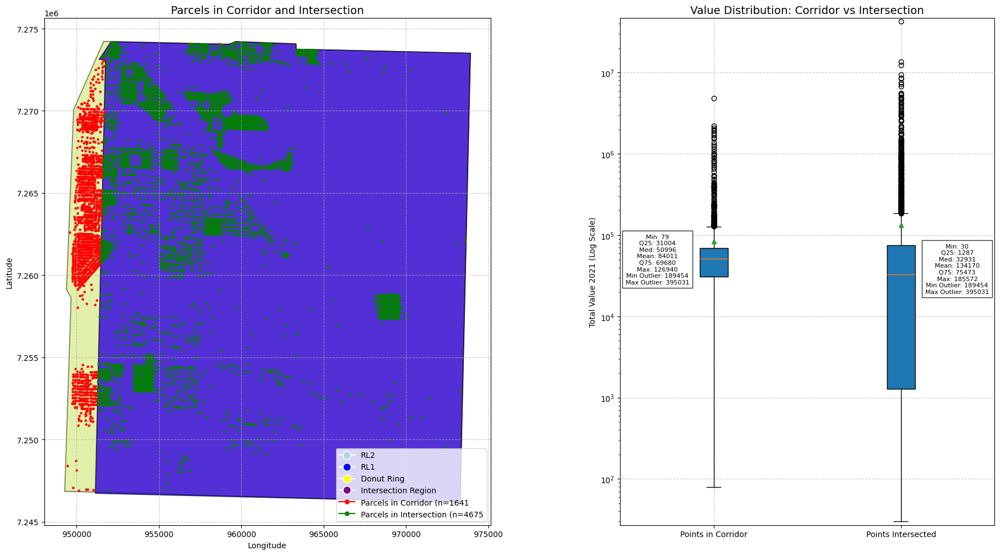


First few rows of df_parcels_rl1_rl2_corridor:
                                      Address  ZipCode   Latitude   Longitude  ValueOfCityProperty_1945  ValueOfPersonalProperty_1945  TotalValue_1945  F2025DollarValueTotalValue_1945  \
16640     405 19th St, Lubbock, TX 79401, USA    79401  33.577614 -101.839164                       NaN                           NaN              NaN                              NaN   
16738  1912 E 16th St, Lubbock, TX 79403, USA    79403  33.580996 -101.816355                       NaN                           NaN              NaN                              NaN   
23671       4207 I-27, Lubbock, TX 79403, USA    79403  33.555395 -101.843931                       NaN                           NaN              NaN                              NaN   
25776   1957 Avenue G, Lubbock, TX 79404, USA    79404  33.570256 -101.843351                       NaN                        2500.0           2500.0                          43825.0   
25777   1958 Aven

In [ ]:
# Load the polygon shapefiles
rl1_polygons = gpd.read_file('/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/RL1/RL1.shp')
rl2_polygons = gpd.read_file('/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/RL2/RL2.shp')

# Print CRS and bounds for debugging
print("RL1 CRS:", rl1_polygons.crs)
print("RL2 CRS:", rl2_polygons.crs)
print("RL1 Bounds:", rl1_polygons.total_bounds)
print("RL2 Bounds:", rl2_polygons.total_bounds)
print("RL1 Geometry Count:", len(rl1_polygons))
print("RL2 Geometry Count:", len(rl2_polygons))

# Create a GeoDataFrame from df
geometry = [Point(xy) for xy in zip(df['Longitude'], df['Latitude'])]
gdf = gpd.GeoDataFrame(df, geometry=geometry)

# Set and reproject CRS
gdf.crs = 'EPSG:4326'
if gdf.crs != rl1_polygons.crs:
    gdf = gdf.to_crs(rl1_polygons.crs)
    print("Reprojected gdf to match shapefile CRS:", gdf.crs)

# Compute the donut ring (difference between RL2 and RL1)
donut_ring = gpd.overlay(rl2_polygons, rl1_polygons, how='difference')

# Compute the intersection of RL1 and RL2
intersection_region = gpd.overlay(rl1_polygons, rl2_polygons, how='intersection')

# Spatial join to find parcels within the donut ring (corridor)
gdf_donut = gpd.sjoin(gdf, donut_ring, how='inner', predicate='intersects')
df_parcels_rl1_rl2_corridor = gdf_donut.drop(columns=['index_right']).copy()

# Spatial join to find parcels within the intersection of RL1 and RL2
gdf_intersection = gpd.sjoin(gdf, intersection_region, how='inner', predicate='intersects')
df_parcels_rl1_rl2_intersection = gdf_intersection.drop(columns=['index_right']).copy()

# Verify the selection
print(f"Number of parcels in corridor (between RL2 and RL1): {len(df_parcels_rl1_rl2_corridor)}")
print(f"Number of parcels in intersection (within RL1 and RL2): {len(df_parcels_rl1_rl2_intersection)}")

# Plotting
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10), gridspec_kw={'width_ratios': [2, 1]})

# Spatial Plot
# Plot RL2 and RL1 polygons
rl2_polygons.plot(ax=ax1, color='lightblue', edgecolor='black', alpha=0.5)
rl1_polygons.plot(ax=ax1, color='blue', edgecolor='black', alpha=0.7)

# Plot the donut ring and intersection region
donut_ring.plot(ax=ax1, color='yellow', edgecolor='black', alpha=0.3)
intersection_region.plot(ax=ax1, color='purple', edgecolor='black', alpha=0.3)

# Plot parcels in the corridor
df_parcels_rl1_rl2_corridor.plot(ax=ax1, color='red', marker='o', label=f'Parcels in Corridor (n={len(df_parcels_rl1_rl2_corridor)})', markersize=5)

# Plot parcels in the intersection
df_parcels_rl1_rl2_intersection.plot(ax=ax1, color='green', marker='o', label=f'Parcels in Intersection (n={len(df_parcels_rl1_rl2_intersection)})', markersize=5)

# Customize the spatial plot
ax1.set_title('Parcels in Corridor and Intersection', fontsize=14)
ax1.set_xlabel('Longitude')
ax1.set_ylabel('Latitude')
ax1.legend(handles=[
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='lightblue', markersize=10, label='RL2'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='blue', markersize=10, label='RL1'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='yellow', markersize=10, label='Donut Ring'),
    plt.Line2D([0], [0], marker='o', color='w', markerfacecolor='purple', markersize=10, label='Intersection Region'),
    plt.Line2D([0], [0], marker='o', color='red', markerfacecolor='red', markersize=5, label=f'Parcels in Corridor (n={len(df_parcels_rl1_rl2_corridor)}'),
    plt.Line2D([0], [0], marker='o', color='green', markerfacecolor='green', markersize=5, label=f'Parcels in Intersection (n={len(df_parcels_rl1_rl2_intersection)}')
])
ax1.grid(True, linestyle='--', alpha=0.7)

# Box Plot with Log Scale and Side Annotations
# Prepare data for box plot (handle missing values and non-positive values)
corridor_values = df_parcels_rl1_rl2_corridor['TotalValue_2021'].dropna()
intersection_values = df_parcels_rl1_rl2_intersection['TotalValue_2021'].dropna()
corridor_values = corridor_values[corridor_values > 0]  # Filter out non-positive values
intersection_values = intersection_values[intersection_values > 0]

# Create box plot data
data_to_plot = [corridor_values, intersection_values]
bp = ax2.boxplot(data_to_plot, tick_labels=['Points in Corridor', 'Points Intersected'], showmeans=True, patch_artist=True)

# Set log scale on y-axis
ax2.set_yscale('log')

# Determine axis limits based on outliers
all_values = np.concatenate([v for v in data_to_plot if len(v) > 0])
if len(all_values) > 0:
    min_val = np.min(all_values)
    max_val = np.max(all_values)
    # Extend limits to include outliers fully (e.g., 10% buffer, ensure positive)
    min_limit = max(min_val * 0.9, 1)  # Avoid log(0) or negative
    max_limit = max_val * 1.1
    ax2.set_ylim(min_limit, max_limit)

# Annotate box plot statistics on the side
for i, box in enumerate(bp['boxes']):
    # Get box plot stats using vertices and other components
    box_coords = box.get_path().vertices
    whisker_low = bp['whiskers'][i*2].get_ydata()[1]
    whisker_high = bp['whiskers'][i*2+1].get_ydata()[1]
    q25 = box_coords[0, 1]  # Q25
    median = bp['medians'][i].get_ydata()[0]
    q75 = box_coords[2, 1]  # Q75
    mean = bp['means'][i].get_ydata()[0]
    stats = (whisker_low, q25, median, mean, q75, whisker_high)

    label = f'Min: {stats[0]:.0f}\nQ25: {stats[1]:.0f}\nMed: {stats[2]:.0f}\nMean: {stats[3]:.0f}\nQ75: {stats[4]:.0f}\nMax: {stats[5]:.0f}'

    # Check for outliers (exclude count as requested)
    outliers = [f.get_ydata()[1] for f in bp['fliers'] if len(f.get_ydata()) > 0]
    if outliers:
        min_outlier = min(outliers)
        max_outlier = max(outliers)
        label += f'\nMin Outlier: {min_outlier:.0f}\nMax Outlier: {max_outlier:.0f}'

    # Place label to the left or right of the box (alternate sides)
    x_pos = 0.7 if i == 0 else 2.3  # Left for Corridor, right for Intersected
    y_pos = np.mean([stats[1], stats[4]])  # Center between Q25 and Q75
    ax2.text(x_pos, y_pos, label, ha='center', va='center', fontsize=8, bbox=dict(facecolor='white', alpha=0.8))

# Customize the box plot
ax2.set_title('Value Distribution: Corridor vs Intersection', fontsize=14)
ax2.set_ylabel('Total Value 2021 (Log Scale)')
ax2.grid(True, linestyle='--', alpha=0.7)

# Adjust layout and display
plt.tight_layout()
plt.show()

# Display the first few rows of both DataFrames
print("\nFirst few rows of df_parcels_rl1_rl2_corridor:")
print(df_parcels_rl1_rl2_corridor.head())
print("\nFirst few rows of df_parcels_rl1_rl2_intersection:")
print(df_parcels_rl1_rl2_intersection.head())

Corridor parcels     : 1,641
Intersection parcels : 4,675
Total tagged         : 6316


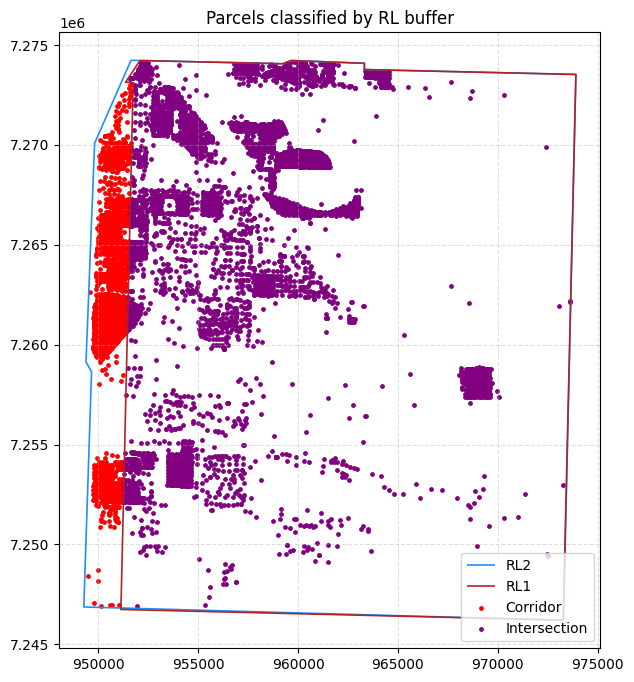

In [ ]:
# ------------------------------------------------------------
# 0 │ Build GeoDataFrame from df (already in memory)
# ------------------------------------------------------------
gdf = gpd.GeoDataFrame(
    df.copy(),
    geometry=gpd.points_from_xy(df.Longitude, df.Latitude),
    crs="EPSG:4326"
)
if gdf.crs != rl1_polygons.crs:
    gdf = gdf.to_crs(rl1_polygons.crs)

# ------------------------------------------------------------
# 1 │ Corridor vs Intersection masks (key trick)
# ------------------------------------------------------------
donut_ring       = gpd.overlay(rl2_polygons, rl1_polygons, how="difference")
intersection_reg = gpd.overlay(rl1_polygons, rl2_polygons, how="intersection")

# ------------------------------------------------------------
# 2 │ Spatial joins
# ------------------------------------------------------------
df_corridor     = gpd.sjoin(gdf, donut_ring,       how="inner", predicate="intersects").drop(columns="index_right")
df_intersection = gpd.sjoin(gdf, intersection_reg, how="inner", predicate="intersects").drop(columns="index_right")

df_corridor["RL_Tag"]     = "Corridor"     # inside RL2, outside RL1
df_intersection["RL_Tag"] = "Intersection" # inside both RL1 & RL2

print(f"Corridor parcels     : {len(df_corridor):,}")
print(f"Intersection parcels : {len(df_intersection):,}")
print("Total tagged         :", len(pd.concat([df_corridor, df_intersection])))

# ------------------------------------------------------------
# 3 │ QUICK PLOT (optional)
# ------------------------------------------------------------
ax = rl2_polygons.boundary.plot(figsize=(8,8), edgecolor="dodgerblue", linewidth=1.2, label="RL2")
rl1_polygons.boundary.plot(ax=ax, edgecolor="firebrick", linewidth=1.2, label="RL1")

df_corridor.plot(    ax=ax, color="red",    markersize=6, label="Corridor")
df_intersection.plot(ax=ax, color="purple", markersize=6, label="Intersection")

ax.set_title("Parcels classified by RL buffer")
ax.legend()
ax.grid(True, linestyle="--", alpha=0.4)


In [ ]:
# ------------------------------------------------------------
# 1 │ Combine and tidy
# ------------------------------------------------------------
df_tagged = (
    pd.concat([df_corridor, df_intersection], ignore_index=True)
      .reset_index(drop=True)
)

# If you prefer WGS-84 coords for the CSV, reproject first
df_tagged = df_tagged.to_crs(epsg=4326)

# Add lon / lat columns (makes the CSV human-friendly)
df_tagged["Longitude"] = df_tagged.geometry.x
df_tagged["Latitude"]  = df_tagged.geometry.y

# Optional: drop geometry to keep the CSV light
# (or keep it – GeoPandas will write WKT by default)
df_out = df_tagged.drop(columns="geometry")

# ------------------------------------------------------------
# 2 │ Save & download
# ------------------------------------------------------------
out_fname = "parcels_corridor_intersection.csv"
df_out.to_csv(out_fname, index=False)


In [ ]:
# ─── paths ───────────────────────────────────────────────────
CSV_PARCELS = "parcels_corridor_intersection.csv"     # uploaded earlier
PATH_RL1 = "/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/RL1/RL1.shp"
PATH_RL2 = "/content/drive/MyDrive/RA Part-time UMD/Lubbock Project/After May 18th 2025/May_18_Feature_Classes/RL2/RL2.shp"
PLOT_DIR    = "/content/row_plots"
os.makedirs(PLOT_DIR, exist_ok=True)

# ============================================================
# 1 │ LOAD DATA
# ============================================================
# parcels csv → GeoDataFrame
df_raw = pd.read_csv(CSV_PARCELS)
gdf_all = gpd.GeoDataFrame(
    df_raw,
    geometry=gpd.points_from_xy(df_raw.Longitude, df_raw.Latitude),
    crs="EPSG:4326",
)

# RL polygons
rl1 = gpd.read_file(PATH_RL1)
rl2 = gpd.read_file(PATH_RL2)
if rl1.crs != rl2.crs:
    rl2 = rl2.to_crs(rl1.crs)
gdf_all = gdf_all.to_crs(rl1.crs)

# dissolve outlines once for plotting
rl1_out = rl1.dissolve()
rl2_out = rl2.dissolve()

# ============================================================
# 2 │ PARAMS
# ============================================================
YEARS = [1945, 1975, 1985, 2012, 2020, 2021]
VALUE_TYPES = {
    "NominalValue":                   lambda y: f"TotalValue_{y}",
    "InflationAdjustedValue":         lambda y: f"F2025DollarValueTotalValue_{y}",
    "NominalValue_perSqFt":           lambda y: f"TotalValue_perSqFt_{y}",
    "InflationAdjustedValue_perSqFt": lambda y: f"F2025DollarValueTotalValue_perSqFt_{y}",
}

COHORT_DEFS = {
    "Baseline":      YEARS,         # no longitudinal filter
    "Longitudinal5": YEARS[1:],     # latest 5 years
    "Longitudinal6": YEARS,         # all 6 years
}

# ============================================================
# 3 │ BUILD STATS + PLOTS
# ============================================================
records = []
plot_idx = 0

for cohort, years_req in COHORT_DEFS.items():
    # cohort filter: require non-null TotalValue for *all* required years
    mask = np.ones(len(gdf_all), dtype=bool)
    if cohort != "Baseline":
        for yr in years_req:
            mask &= gdf_all[f"TotalValue_{yr}"].notna()
    gdf_cohort = gdf_all[mask]

    for loc in ["Corridor", "Intersection"]:
        gdf_loc = gdf_cohort[gdf_cohort["RL_Tag"] == loc]

        for yr in YEARS:
            for vtype, col_fn in VALUE_TYPES.items():
                col = col_fn(yr)
                if col not in gdf_loc.columns:
                    # column missing ⇒ still insert empty row
                    vals, cnt = pd.Series(dtype=float), 0
                else:
                    vals = gdf_loc[col].dropna()
                    vals = vals[vals > 0]
                    cnt  = len(vals)

                # ---------------- stats row ----------------
                records.append({
                    "Parcel_Location": loc,
                    "Cohort":          cohort,
                    "Year":            yr,
                    "Value_Type":      vtype,
                    "Mean":            vals.mean()   if cnt else np.nan,
                    "Median":          vals.median() if cnt else np.nan,
                    "Count":           cnt,
                })

                # ---------------- plot ----------------
                title = f"{cohort} | {yr} | {vtype} | {loc}  (n={cnt})"
                fig, ax = plt.subplots(figsize=(6, 6))
                rl2_out.boundary.plot(ax=ax, edgecolor="dodgerblue", linewidth=1)
                rl1_out.boundary.plot(ax=ax, edgecolor="firebrick",  linewidth=1)

                if cnt:
                    # rows, not columns  ↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓↓
                    gdf_loc.loc[vals.index].plot(
                        ax=ax,
                        markersize=6,
                        marker="o",
                        color="purple" if loc == "Intersection" else "red",
                        alpha=0.7,
                        label=f"{loc} points"
                    )

                ax.set_title(title, fontsize=9)
                ax.set_axis_off()
                plt.tight_layout()


                out_file = os.path.join(PLOT_DIR, f"row_{plot_idx:03d}.png")
                fig.savefig(out_file, dpi=150)
                plt.close(fig)
                plot_idx += 1

print(f"Generated {plot_idx} plots → {PLOT_DIR}")

# ============================================================
# 4 │ SAVE STATS CSV
# ============================================================
df_stats = pd.DataFrame(records)
csv_out = "/content/df_descriptive_stats_complete.csv"
df_stats.to_csv(csv_out, index=False)
print(f"Stats table with empty rows saved: {csv_out}")


Generated 144 plots → /content/row_plots
Stats table with empty rows saved: /content/df_descriptive_stats_complete.csv


In [ ]:
!zip -r row_plots.zip /content/row_plots


  adding: content/row_plots/ (stored 0%)
  adding: content/row_plots/row_113.png (deflated 15%)
  adding: content/row_plots/row_024.png (deflated 13%)
  adding: content/row_plots/row_053.png (deflated 12%)
  adding: content/row_plots/row_058.png (deflated 13%)
  adding: content/row_plots/row_021.png (deflated 8%)
  adding: content/row_plots/row_124.png (deflated 15%)
  adding: content/row_plots/row_135.png (deflated 14%)
  adding: content/row_plots/row_094.png (deflated 9%)
  adding: content/row_plots/row_052.png (deflated 12%)
  adding: content/row_plots/row_048.png (deflated 14%)
  adding: content/row_plots/row_002.png (deflated 15%)
  adding: content/row_plots/row_086.png (deflated 9%)
  adding: content/row_plots/row_125.png (deflated 14%)
  adding: content/row_plots/row_029.png (deflated 5%)
  adding: content/row_plots/row_138.png (deflated 14%)
  adding: content/row_plots/row_142.png (deflated 15%)
  adding: content/row_plots/row_045.png (deflated 4%)
  adding: content/row_plots/r

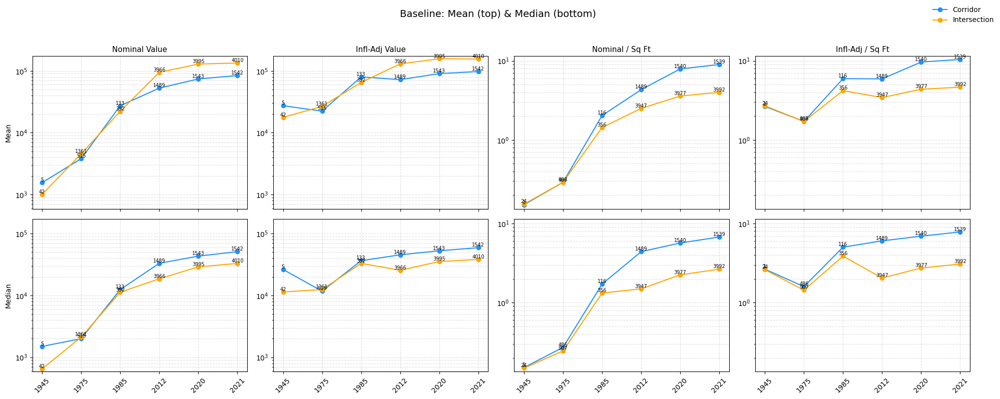

Saved: /content/Baseline_8panel.png


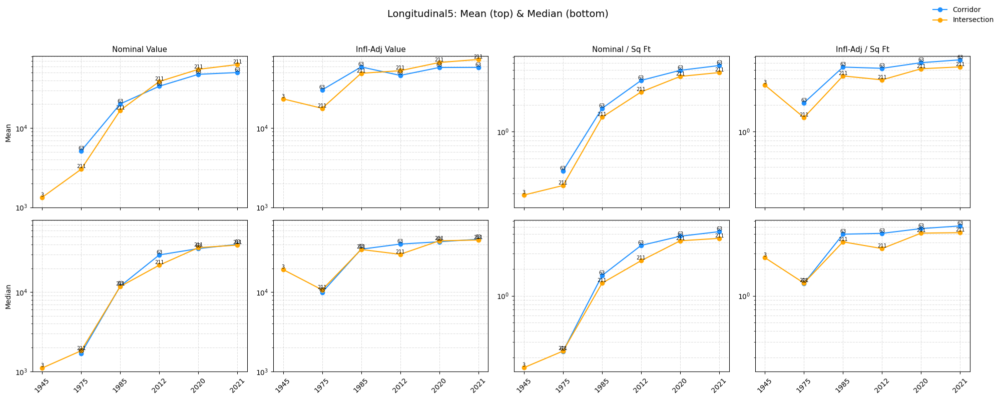

Saved: /content/Longitudinal5_8panel.png


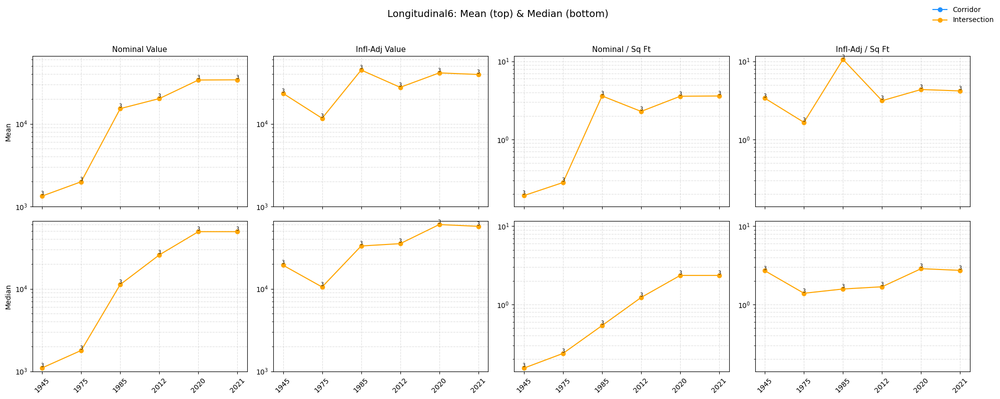

Saved: /content/Longitudinal6_8panel.png


In [ ]:
# ------------------------------------------------------------------
# 0 │ SETTINGS & INPUT FILES
# ------------------------------------------------------------------
CSV_STATS   = "/content/df_descriptive_stats_complete.csv"      # 136-row table
CSV_PARCELS = "/content/parcels_corridor_intersection.csv"      # use if stats file missing

YEAR_ORDER  = [1945, 1975, 1985, 2012, 2020, 2021]
X_POS       = np.arange(len(YEAR_ORDER))        # equal spacing 0..5

VALUE_TYPES = [
    "NominalValue",
    "InflationAdjustedValue",
    "NominalValue_perSqFt",
    "InflationAdjustedValue_perSqFt",
]
VT_LABELS = {
    "NominalValue":                   "Nominal Value",
    "InflationAdjustedValue":         "Infl-Adj Value",
    "NominalValue_perSqFt":           "Nominal / Sq Ft",
    "InflationAdjustedValue_perSqFt": "Infl-Adj / Sq Ft",
}

COHORTS = ["Baseline", "Longitudinal5", "Longitudinal6"]
COLORS  = {"Corridor": "dodgerblue", "Intersection": "orange"}

# ------------------------------------------------------------------
# 1 │ LOAD (or rebuild) df_stats
# ------------------------------------------------------------------
try:
    df_stats = pd.read_csv(CSV_STATS)
    assert set(df_stats["Cohort"]) == set(COHORTS)
except Exception:
    # Quick rebuild (mean / median / count) – uses the latest script logic
    print("Stats file not found – rebuilding from parcel CSV …")
    df_parc = pd.read_csv(CSV_PARCELS)

    YEARS = YEAR_ORDER
    VALUE_COLS = {
        "NominalValue":                   lambda y: f"TotalValue_{y}",
        "InflationAdjustedValue":         lambda y: f"F2025DollarValueTotalValue_{y}",
        "NominalValue_perSqFt":           lambda y: f"TotalValue_perSqFt_{y}",
        "InflationAdjustedValue_perSqFt": lambda y: f"F2025DollarValueTotalValue_perSqFt_{y}",
    }
    COHORT_DEFS = {
        "Baseline":      YEARS,
        "Longitudinal5": YEARS[1:],      # latest 5 years
        "Longitudinal6": YEARS,
    }

    recs = []
    for cohort, yrs_req in COHORT_DEFS.items():
        mask = np.ones(len(df_parc), dtype=bool)
        if cohort != "Baseline":
            for yr in yrs_req:
                mask &= df_parc[f"TotalValue_{yr}"].notna()
        sub_cohort = df_parc[mask]
        for loc in ["Corridor", "Intersection"]:
            df_loc = sub_cohort[sub_cohort["RL_Tag"] == loc]
            for yr in YEAR_ORDER:
                for vt, fn in VALUE_COLS.items():
                    col = fn(yr)
                    vals = df_loc[col].dropna() if col in df_loc else pd.Series(dtype=float)
                    vals = vals[vals > 0]
                    recs.append({
                        "Cohort": cohort,
                        "Parcel_Location": loc,
                        "Year": yr,
                        "Value_Type": vt,
                        "Mean": vals.mean() if not vals.empty else np.nan,
                        "Median": vals.median() if not vals.empty else np.nan,
                        "Count": len(vals),
                    })
    df_stats = pd.DataFrame(recs)
    df_stats.to_csv(CSV_STATS, index=False)
    print("Rebuilt stats →", CSV_STATS)

# ------------------------------------------------------------------
# 2 │ PLOT LOOP
# ------------------------------------------------------------------
for cohort in COHORTS:
    fig, axes = plt.subplots(nrows=2, ncols=4, figsize=(20, 8), sharex="col")

    # ------------------------------------------------ shared y-limits
    totals_mask = df_stats["Value_Type"].isin(["NominalValue", "InflationAdjustedValue"])
    sqft_mask   = df_stats["Value_Type"].str.contains("_perSqFt")

    cohort_totals = df_stats[(df_stats["Cohort"] == cohort) & totals_mask]
    cohort_sqft   = df_stats[(df_stats["Cohort"] == cohort) & sqft_mask]

    y_totals = cohort_totals[["Mean", "Median"]].values.ravel()
    y_totals = y_totals[~np.isnan(y_totals) & (y_totals > 0)]
    y_sqft   = cohort_sqft[["Mean", "Median"]].values.ravel()
    y_sqft   = y_sqft[~np.isnan(y_sqft) & (y_sqft > 0)]

    y_total_lim = (y_totals.min() * 0.9, y_totals.max() * 1.1)
    y_sqft_lim  = (y_sqft.min()   * 0.9, y_sqft.max()   * 1.1)

    # ------------------------------------------------ plot each panel
    for col_idx, vt in enumerate(VALUE_TYPES):
        for row_idx, stat in enumerate(["Mean", "Median"]):
            ax = axes[row_idx, col_idx]

            for loc in ["Corridor", "Intersection"]:
                sub = df_stats[
                    (df_stats["Cohort"] == cohort) &
                    (df_stats["Parcel_Location"] == loc) &
                    (df_stats["Value_Type"] == vt)
                ].set_index("Year").reindex(YEAR_ORDER)

                y_vals   = sub[stat].values
                counts   = sub["Count"].values
                ax.plot(X_POS, y_vals, marker="o", color=COLORS[loc],
                        label=loc if row_idx == 0 and col_idx == 0 else "")

                # annotate n count next to each point
                for x, y, n in zip(X_POS, y_vals, counts):
                    if not np.isnan(y):
                        ax.text(x, y, f"{int(n)}", fontsize=7,
                                va="bottom", ha="center")

            ax.set_yscale("log")
            ax.set_xticks(X_POS)
            ax.set_xticklabels(YEAR_ORDER, rotation=45)
            ax.grid(True, which="both", linestyle="--", alpha=0.4)
            if vt.endswith("_perSqFt"):
                ax.set_ylim(*y_sqft_lim)
            else:
                ax.set_ylim(*y_total_lim)

            if row_idx == 0:
                ax.set_title(VT_LABELS[vt], fontsize=11)
            if col_idx == 0:
                ax.set_ylabel(stat)

    # tidy + legend
    handles, labels = axes[0,0].get_legend_handles_labels()
    fig.legend(handles, labels, loc="upper right", frameon=False)
    fig.suptitle(f"{cohort}: Mean (top) & Median (bottom)", fontsize=14)
    fig.tight_layout(rect=[0, 0, 0.98, 0.95])

    # save & show
    out_png = f"/content/{cohort}_8panel.png"
    fig.savefig(out_png, dpi=150)
    plt.show()
    print("Saved:", out_png)
